In [1]:
import fastf1
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px 

In [2]:
import os 

In [3]:
# Ensure cache directory exists
cache_dir = 'cache'
os.makedirs(cache_dir, exist_ok=True)

# Enable FastF1 cache for performance improvement
fastf1.Cache.enable_cache(cache_dir)


In [4]:
#setting dark theme for plots
plt.style.use('dark_background')
sns.set_style('darkgrid')

# Loading Race Data into cache

In [5]:
schedule = fastf1.get_event_schedule(2024)
track_names = schedule['EventName'][1:].tolist()
round_to_track = {i+1: track for i, track in enumerate(track_names)}

# Load and cache session data
cached_sessions = {}
for round_number in range(1, len(schedule)):
    session = fastf1.get_session(2024, round_number, 'R')
    session.load(telemetry=False, weather=False)
    cached_sessions[round_number] = session

core           INFO 	Loading data for Bahrain Grand Prix - Race [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for lap_count
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['1', '11', '55', '16', '63', '4', '44', '81', '14', '18', '24', '20', '3', '22', '23', '27', '31', '10', '77', '2']
core           INFO 	Loading data for Saudi Arabian Grand Prix - Race [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
req            INFO 	Using cached dat

In [6]:
round_numbers = list(range(1,len(schedule)))
track_names = schedule['EventName'][1:].tolist()
round_to_track = {i+1: track for i, track in enumerate(track_names)}


# Function to fetch driver standings after each race 

In [7]:
def get_driver_standings():
    standings = []
    for round_number,session in cached_sessions.items():
        session = fastf1.get_session(2024,round_number,'R')
        session.load()
        results = session.results
        standings.append({
            'Track': round_to_track[round_number],
            'Round':round_number,
            'Driver':results['Abbreviation'].tolist(),
            'Points':results['Points'].tolist()
        })
    return pd.concat([pd.DataFrame(s) for s in standings ],ignore_index=True)
    

In [8]:
driver_standings = get_driver_standings()

core           INFO 	Loading data for Bahrain Grand Prix - Race [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for lap_count
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['1', '11', '55', '16', '63', '4', '44', '81', '14', '18', '24', '20', '3', '22', '23', '27', '31', '10', '77', '2']
core           INFO 	Loading data for Saudi Arabian Grand Prix

# Function to Analyze Qualifying vs Race Performance 

In [9]:
def get_qualifying_vs_race():
    performance = []
    for round_number,session in cached_sessions.items():
        quali_session = fastf1.get_session(2024,round_number,'Q')
        race_session = fastf1.get_session(2024,round_number,'R')
        quali_session.load()
        race_session.load()
        quali = quali_session.results
        race = race_session.results
        for driver in quali['Abbreviation']:
            start_pos = int(quali.loc[quali['Abbreviation']==driver,'Position'])
            finish_pos = int(race.loc[race['Abbreviation']==driver,'Position'])
            performance.append({
                'Track': round_to_track[round_number],
                'Round':round_number,
                'Driver':driver,
                'Start':start_pos,
                'Finish':finish_pos
            })
    return pd.DataFrame(performance)


# Function to analyze lap time trends

In [10]:
def get_lap_time_trends():
    lap_times = []
    for round_number,session in cached_sessions.items():
        session = fastf1.get_session(2024,round_number,'R')
        session.load()
        for driver in session.drivers:
            driver_laps = session.laps.pick_driver(driver)
            avg_lap = driver_laps['LapTime'].mean().total_seconds()
            best_lap = driver_laps['LapTime'].min().total_seconds()
            lap_times.append({
                'Track': round_to_track[round_number],
                'Round':round_number,
                'Driver':driver,
                'BestLap':best_lap,
                'AvgLap':avg_lap
            })
    return pd.DataFrame(lap_times)    

In [11]:
laps_data = get_lap_time_trends()
laps_data

core           INFO 	Loading data for Bahrain Grand Prix - Race [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for lap_count
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['1', '11', '55', '16', '63', '4', '44', '81', '14', '18', '24', '20', '3', '22', '23', '27', '31', '10', '77', '2']
c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-

,Track,Round,Driver,BestLap,AvgLap
0,Bahrain Grand Prix,1,1,92.608,96.574421
1,Bahrain Grand Prix,1,11,94.364,96.968403
2,Bahrain Grand Prix,1,55,94.507,97.014947
3,Bahrain Grand Prix,1,16,94.090,97.270368
4,Bahrain Grand Prix,1,63,95.065,97.395263
...,...,...,...,...,...
474,Abu Dhabi Grand Prix,24,20,85.637,92.471719
475,Abu Dhabi Grand Prix,24,30,88.751,92.308163
476,Abu Dhabi Grand Prix,24,77,89.482,94.909333
477,Abu Dhabi Grand Prix,24,43,89.411,95.016538


# Function to measure consistency 


In [12]:
def get_driver_consistency():
    standings = get_driver_standings()
    consistency = standings.groupby('Driver')['Points'].std().reset_index()
    consistency.rename(columns={'Points':'PointsStdDev'},inplace=True)
    return consistency.sort_values(by='PointsStdDev')

If a driver scores [18, 16, 18, 17, 18] points in five races:
Standard deviation is small (≈0.89), meaning consistent performance.

If another driver scores [25, 6, 18, 2, 12] points:
Standard deviation is large (≈9.37), showing inconsistency.


# Fetching data

In [13]:
#we have already fetched driver_standings data in one of the above cells 

qualifying_vs_race = get_qualifying_vs_race()
lap_time_trends = get_lap_time_trends()
driver_consistency = get_driver_consistency()

core           INFO 	Loading data for Bahrain Grand Prix - Qualifying [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['1', '16', '63', '55', '11', '14', '4', '81', '44', '27', '22', '18', '23', '3', '20', '77', '24', '2', '31', '10']
core           INFO 	Loading data for Bahrain Grand Prix - Race [v3.4.4]
req            INFO 	Using cached da

#### F1 2024 Season Driver Points Progression

In [14]:
driver_standings = []
for round_number, session in cached_sessions.items():
    results = session.results[['DriverNumber', 'FullName', 'TeamName', 'Points']]
    results['Track'] = round_to_track[round_number]
    driver_standings.append(results)

driver_standings = pd.concat(driver_standings, ignore_index=True)

#getting unique driver names
drivers = driver_standings['FullName'].unique()

#Plotting points progression for each driver separately
for driver in drivers:
    driver_data = driver_standings[driver_standings['FullName'] == driver]
    fig = px.line(
        driver_data,
        x='Track',
        y='Points',
        markers=True,
        title=f'F1 2024 Season Points Progression - {driver}',
        template='plotly_dark'
    )
    
    fig.update_layout(
        xaxis_title='Track',
        yaxis_title='Points'
    )
    
    fig.show(renderer="browser")

C:\Users\Admin\AppData\Local\Temp\ipykernel_28552\971974029.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  results['Track'] = round_to_track[round_number]
C:\Users\Admin\AppData\Local\Temp\ipykernel_28552\971974029.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  results['Track'] = round_to_track[round_number]
C:\Users\Admin\AppData\Local\Temp\ipykernel_28552\971974029.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

In [15]:
unique_rounds =qualifying_vs_race['Round'].unique()
 
for round_number in unique_rounds:
    round_data = qualifying_vs_race[qualifying_vs_race['Round']==round_number]
    

In [16]:
qualifying_vs_race

,Track,Round,Driver,Start,Finish
0,Bahrain Grand Prix,1,VER,1,1
1,Bahrain Grand Prix,1,LEC,2,4
2,Bahrain Grand Prix,1,RUS,3,5
3,Bahrain Grand Prix,1,SAI,4,3
4,Bahrain Grand Prix,1,PER,5,2
...,...,...,...,...,...
474,Abu Dhabi Grand Prix,24,ALB,16,11
475,Abu Dhabi Grand Prix,24,ZHO,17,13
476,Abu Dhabi Grand Prix,24,HAM,18,4
477,Abu Dhabi Grand Prix,24,COL,19,19


In [17]:
track_names

['Bahrain Grand Prix',
 'Saudi Arabian Grand Prix',
 'Australian Grand Prix',
 'Japanese Grand Prix',
 'Chinese Grand Prix',
 'Miami Grand Prix',
 'Emilia Romagna Grand Prix',
 'Monaco Grand Prix',
 'Canadian Grand Prix',
 'Spanish Grand Prix',
 'Austrian Grand Prix',
 'British Grand Prix',
 'Hungarian Grand Prix',
 'Belgian Grand Prix',
 'Dutch Grand Prix',
 'Italian Grand Prix',
 'Azerbaijan Grand Prix',
 'Singapore Grand Prix',
 'United States Grand Prix',
 'Mexico City Grand Prix',
 'São Paulo Grand Prix',
 'Las Vegas Grand Prix',
 'Qatar Grand Prix',
 'Abu Dhabi Grand Prix']

#### Qualifying vs Race Performance 

In [19]:
for track_name in track_names:
    
    track_data = qualifying_vs_race[qualifying_vs_race['Track'] == track_name]
    
    if not track_data.empty:
        
        fig = px.scatter(
            track_data,
            x='Start',
            y='Finish',
            color='Driver',
            text='Driver',
            hover_data=['Round', 'Track'],
            title=f'Qualifying vs Race Performance ({track_name})',
            template='plotly_dark'
        )

        fig.update_traces(mode='markers+text', 
                          marker=dict(size=10), 
                          textposition='top center', 
                          textfont=dict(size=12, color='white'))

        fig.add_annotation(
            text="Ideal line (Start = Finish)",
            xref="paper", yref="paper",
            x=0.95, y=0.05,
            showarrow=False
        )

        fig.add_shape(
            type="line",
            x0=0, y0=0, x1=20, y1=20,
            line=dict(color="White", width=0.60, dash="dash")
        )

        fig.update_layout(
            xaxis_title='Qualifying Position',
            yaxis_title='Race Finish Position',
            legend_title='Drivers',
            legend=dict(
                orientation="v",
                yanchor="top",
                y=1.05,
                xanchor="left",
                x=1.05
            )
        )

        fig.show()

In [20]:
import pandas as pd
import plotly.express as px

# Grouping by driver to get average start and finish positions
avg_performance = qualifying_vs_race.groupby('Driver').agg(
    Avg_Start=('Start', 'mean'),
    Avg_Finish=('Finish', 'mean')
).reset_index()

# Scatter plot to visualize the trend
fig = px.scatter(
    avg_performance,
    x='Avg_Start',
    y='Avg_Finish',
    text='Driver',
    color='Driver',
    hover_data=['Avg_Start', 'Avg_Finish'],
    title='Average Qualifying vs. Race Performance (2024 Season)',
    template='plotly_dark'
)

# Enhancing the visualization
fig.update_traces(mode='markers+text', 
                  marker=dict(size=12), 
                  textposition='top center', 
                  textfont=dict(size=10, color='white'))

# Adding the ideal reference line (where qualifying = finishing)
fig.add_shape(
    type="line",
    x0=0, y0=0, x1=max(avg_performance['Avg_Start'])+1, y1=max(avg_performance['Avg_Start'])+1,
    line=dict(color="White", width=1, dash="dash")
)

fig.add_annotation(
    text="Ideal Performance Line (Start = Finish)",
    xref="paper", yref="paper",
    x=0.95, y=0.05,
    showarrow=False
)

fig.update_layout(
    xaxis_title='Average Qualifying Position',
    yaxis_title='Average Race Finish Position',
    legend_title='Drivers',
    legend=dict(
        orientation="v",
        yanchor="top",
        y=1.05,
        xanchor="left",
        x=1.05
    )
)

fig.show()


In [21]:
import plotly.graph_objects as go

In [22]:
lap_time_trends.head()

,Track,Round,Driver,BestLap,AvgLap
0,Bahrain Grand Prix,1,1,92.608,96.574421
1,Bahrain Grand Prix,1,11,94.364,96.968403
2,Bahrain Grand Prix,1,55,94.507,97.014947
3,Bahrain Grand Prix,1,16,94.090,97.270368
4,Bahrain Grand Prix,1,63,95.065,97.395263


#### Lap time box plots

In [23]:
for track_name in track_names:
    track_data = lap_time_trends[lap_time_trends['Track'] == track_name]
    
    if not track_data.empty:
        print(f"Creating plot for {track_name} with {len(track_data)} data points.")
        
        fig = go.Figure()

        for driver in track_data['Driver'].unique():
            driver_data = track_data[track_data['Driver'] == driver]
            if not driver_data.empty:
                print(f"Adding trace for driver {driver} with {len(driver_data)} data points.")
                fig.add_trace(go.Box(
                    y=driver_data['BestLap'],
                    x=driver_data['Round'],
                    name=driver, 
                    boxpoints='all',  
                    jitter=0.3,  
                    pointpos=-1.8,  
                    text=driver_data['Driver'],  
                    hovertext=driver_data['Track'],  
                    marker=dict(size=8)
                ))

        
        fig.update_layout(
            title=f'Distribution of Best Lap Times by Round ({track_name})',
            xaxis_title='Round',
            yaxis_title='Best Lap Time (seconds)',
            legend_title='Drivers',
            legend=dict(
                orientation="v",
                yanchor="top",
                y=1.05,
                xanchor="left",
                x=1.05
            ),
            template='plotly_dark'
        )

        
        fig.show()
    else:
        print(f"No data available for {track_name}.")

Creating plot for Bahrain Grand Prix with 20 data points.
Adding trace for driver 1 with 1 data points.
Adding trace for driver 11 with 1 data points.
Adding trace for driver 55 with 1 data points.
Adding trace for driver 16 with 1 data points.
Adding trace for driver 63 with 1 data points.
Adding trace for driver 4 with 1 data points.
Adding trace for driver 44 with 1 data points.
Adding trace for driver 81 with 1 data points.
Adding trace for driver 14 with 1 data points.
Adding trace for driver 18 with 1 data points.
Adding trace for driver 24 with 1 data points.
Adding trace for driver 20 with 1 data points.
Adding trace for driver 3 with 1 data points.
Adding trace for driver 22 with 1 data points.
Adding trace for driver 23 with 1 data points.
Adding trace for driver 27 with 1 data points.
Adding trace for driver 31 with 1 data points.
Adding trace for driver 10 with 1 data points.
Adding trace for driver 77 with 1 data points.
Adding trace for driver 2 with 1 data points.


Creating plot for Saudi Arabian Grand Prix with 20 data points.
Adding trace for driver 1 with 1 data points.
Adding trace for driver 11 with 1 data points.
Adding trace for driver 16 with 1 data points.
Adding trace for driver 81 with 1 data points.
Adding trace for driver 14 with 1 data points.
Adding trace for driver 63 with 1 data points.
Adding trace for driver 38 with 1 data points.
Adding trace for driver 4 with 1 data points.
Adding trace for driver 44 with 1 data points.
Adding trace for driver 27 with 1 data points.
Adding trace for driver 23 with 1 data points.
Adding trace for driver 20 with 1 data points.
Adding trace for driver 31 with 1 data points.
Adding trace for driver 2 with 1 data points.
Adding trace for driver 22 with 1 data points.
Adding trace for driver 3 with 1 data points.
Adding trace for driver 77 with 1 data points.
Adding trace for driver 24 with 1 data points.
Adding trace for driver 18 with 1 data points.
Adding trace for driver 10 with 1 data points.


Creating plot for Australian Grand Prix with 19 data points.
Adding trace for driver 55 with 1 data points.
Adding trace for driver 16 with 1 data points.
Adding trace for driver 4 with 1 data points.
Adding trace for driver 81 with 1 data points.
Adding trace for driver 11 with 1 data points.
Adding trace for driver 18 with 1 data points.
Adding trace for driver 22 with 1 data points.
Adding trace for driver 14 with 1 data points.
Adding trace for driver 27 with 1 data points.
Adding trace for driver 20 with 1 data points.
Adding trace for driver 23 with 1 data points.
Adding trace for driver 3 with 1 data points.
Adding trace for driver 10 with 1 data points.
Adding trace for driver 77 with 1 data points.
Adding trace for driver 24 with 1 data points.
Adding trace for driver 31 with 1 data points.
Adding trace for driver 63 with 1 data points.
Adding trace for driver 44 with 1 data points.
Adding trace for driver 1 with 1 data points.


Creating plot for Japanese Grand Prix with 20 data points.
Adding trace for driver 1 with 1 data points.
Adding trace for driver 11 with 1 data points.
Adding trace for driver 55 with 1 data points.
Adding trace for driver 16 with 1 data points.
Adding trace for driver 4 with 1 data points.
Adding trace for driver 14 with 1 data points.
Adding trace for driver 63 with 1 data points.
Adding trace for driver 81 with 1 data points.
Adding trace for driver 44 with 1 data points.
Adding trace for driver 22 with 1 data points.
Adding trace for driver 27 with 1 data points.
Adding trace for driver 18 with 1 data points.
Adding trace for driver 20 with 1 data points.
Adding trace for driver 77 with 1 data points.
Adding trace for driver 31 with 1 data points.
Adding trace for driver 10 with 1 data points.
Adding trace for driver 2 with 1 data points.
Adding trace for driver 24 with 1 data points.
Adding trace for driver 3 with 1 data points.
Adding trace for driver 23 with 1 data points.


Creating plot for Chinese Grand Prix with 20 data points.
Adding trace for driver 1 with 1 data points.
Adding trace for driver 4 with 1 data points.
Adding trace for driver 11 with 1 data points.
Adding trace for driver 16 with 1 data points.
Adding trace for driver 55 with 1 data points.
Adding trace for driver 63 with 1 data points.
Adding trace for driver 14 with 1 data points.
Adding trace for driver 81 with 1 data points.
Adding trace for driver 44 with 1 data points.
Adding trace for driver 27 with 1 data points.
Adding trace for driver 31 with 1 data points.
Adding trace for driver 23 with 1 data points.
Adding trace for driver 10 with 1 data points.
Adding trace for driver 24 with 1 data points.
Adding trace for driver 18 with 1 data points.
Adding trace for driver 20 with 1 data points.
Adding trace for driver 2 with 1 data points.
Adding trace for driver 3 with 1 data points.
Adding trace for driver 22 with 1 data points.
Adding trace for driver 77 with 1 data points.


Creating plot for Miami Grand Prix with 20 data points.
Adding trace for driver 4 with 1 data points.
Adding trace for driver 1 with 1 data points.
Adding trace for driver 16 with 1 data points.
Adding trace for driver 11 with 1 data points.
Adding trace for driver 55 with 1 data points.
Adding trace for driver 44 with 1 data points.
Adding trace for driver 22 with 1 data points.
Adding trace for driver 63 with 1 data points.
Adding trace for driver 14 with 1 data points.
Adding trace for driver 31 with 1 data points.
Adding trace for driver 27 with 1 data points.
Adding trace for driver 10 with 1 data points.
Adding trace for driver 81 with 1 data points.
Adding trace for driver 24 with 1 data points.
Adding trace for driver 3 with 1 data points.
Adding trace for driver 77 with 1 data points.
Adding trace for driver 18 with 1 data points.
Adding trace for driver 23 with 1 data points.
Adding trace for driver 20 with 1 data points.
Adding trace for driver 2 with 1 data points.


Creating plot for Emilia Romagna Grand Prix with 20 data points.
Adding trace for driver 1 with 1 data points.
Adding trace for driver 4 with 1 data points.
Adding trace for driver 16 with 1 data points.
Adding trace for driver 81 with 1 data points.
Adding trace for driver 55 with 1 data points.
Adding trace for driver 44 with 1 data points.
Adding trace for driver 63 with 1 data points.
Adding trace for driver 11 with 1 data points.
Adding trace for driver 18 with 1 data points.
Adding trace for driver 22 with 1 data points.
Adding trace for driver 27 with 1 data points.
Adding trace for driver 20 with 1 data points.
Adding trace for driver 3 with 1 data points.
Adding trace for driver 31 with 1 data points.
Adding trace for driver 24 with 1 data points.
Adding trace for driver 10 with 1 data points.
Adding trace for driver 2 with 1 data points.
Adding trace for driver 77 with 1 data points.
Adding trace for driver 14 with 1 data points.
Adding trace for driver 23 with 1 data points.

Creating plot for Monaco Grand Prix with 20 data points.
Adding trace for driver 16 with 1 data points.
Adding trace for driver 81 with 1 data points.
Adding trace for driver 55 with 1 data points.
Adding trace for driver 4 with 1 data points.
Adding trace for driver 63 with 1 data points.
Adding trace for driver 1 with 1 data points.
Adding trace for driver 44 with 1 data points.
Adding trace for driver 22 with 1 data points.
Adding trace for driver 23 with 1 data points.
Adding trace for driver 10 with 1 data points.
Adding trace for driver 14 with 1 data points.
Adding trace for driver 3 with 1 data points.
Adding trace for driver 77 with 1 data points.
Adding trace for driver 18 with 1 data points.
Adding trace for driver 2 with 1 data points.
Adding trace for driver 24 with 1 data points.
Adding trace for driver 31 with 1 data points.
Adding trace for driver 11 with 1 data points.
Adding trace for driver 27 with 1 data points.
Adding trace for driver 20 with 1 data points.


Creating plot for Canadian Grand Prix with 20 data points.
Adding trace for driver 1 with 1 data points.
Adding trace for driver 4 with 1 data points.
Adding trace for driver 63 with 1 data points.
Adding trace for driver 44 with 1 data points.
Adding trace for driver 81 with 1 data points.
Adding trace for driver 14 with 1 data points.
Adding trace for driver 18 with 1 data points.
Adding trace for driver 3 with 1 data points.
Adding trace for driver 10 with 1 data points.
Adding trace for driver 31 with 1 data points.
Adding trace for driver 27 with 1 data points.
Adding trace for driver 20 with 1 data points.
Adding trace for driver 77 with 1 data points.
Adding trace for driver 22 with 1 data points.
Adding trace for driver 24 with 1 data points.
Adding trace for driver 55 with 1 data points.
Adding trace for driver 23 with 1 data points.
Adding trace for driver 11 with 1 data points.
Adding trace for driver 16 with 1 data points.
Adding trace for driver 2 with 1 data points.


Creating plot for Spanish Grand Prix with 20 data points.
Adding trace for driver 1 with 1 data points.
Adding trace for driver 4 with 1 data points.
Adding trace for driver 44 with 1 data points.
Adding trace for driver 63 with 1 data points.
Adding trace for driver 16 with 1 data points.
Adding trace for driver 55 with 1 data points.
Adding trace for driver 81 with 1 data points.
Adding trace for driver 11 with 1 data points.
Adding trace for driver 10 with 1 data points.
Adding trace for driver 31 with 1 data points.
Adding trace for driver 27 with 1 data points.
Adding trace for driver 14 with 1 data points.
Adding trace for driver 24 with 1 data points.
Adding trace for driver 18 with 1 data points.
Adding trace for driver 3 with 1 data points.
Adding trace for driver 77 with 1 data points.
Adding trace for driver 20 with 1 data points.
Adding trace for driver 23 with 1 data points.
Adding trace for driver 22 with 1 data points.
Adding trace for driver 2 with 1 data points.


Creating plot for Austrian Grand Prix with 20 data points.
Adding trace for driver 63 with 1 data points.
Adding trace for driver 81 with 1 data points.
Adding trace for driver 55 with 1 data points.
Adding trace for driver 44 with 1 data points.
Adding trace for driver 1 with 1 data points.
Adding trace for driver 27 with 1 data points.
Adding trace for driver 11 with 1 data points.
Adding trace for driver 20 with 1 data points.
Adding trace for driver 3 with 1 data points.
Adding trace for driver 10 with 1 data points.
Adding trace for driver 16 with 1 data points.
Adding trace for driver 31 with 1 data points.
Adding trace for driver 18 with 1 data points.
Adding trace for driver 22 with 1 data points.
Adding trace for driver 23 with 1 data points.
Adding trace for driver 77 with 1 data points.
Adding trace for driver 24 with 1 data points.
Adding trace for driver 14 with 1 data points.
Adding trace for driver 2 with 1 data points.
Adding trace for driver 4 with 1 data points.


Creating plot for British Grand Prix with 20 data points.
Adding trace for driver 44 with 1 data points.
Adding trace for driver 1 with 1 data points.
Adding trace for driver 4 with 1 data points.
Adding trace for driver 81 with 1 data points.
Adding trace for driver 55 with 1 data points.
Adding trace for driver 27 with 1 data points.
Adding trace for driver 18 with 1 data points.
Adding trace for driver 14 with 1 data points.
Adding trace for driver 23 with 1 data points.
Adding trace for driver 22 with 1 data points.
Adding trace for driver 2 with 1 data points.
Adding trace for driver 20 with 1 data points.
Adding trace for driver 3 with 1 data points.
Adding trace for driver 16 with 1 data points.
Adding trace for driver 77 with 1 data points.
Adding trace for driver 31 with 1 data points.
Adding trace for driver 11 with 1 data points.
Adding trace for driver 24 with 1 data points.
Adding trace for driver 63 with 1 data points.
Adding trace for driver 10 with 1 data points.


Creating plot for Hungarian Grand Prix with 20 data points.
Adding trace for driver 81 with 1 data points.
Adding trace for driver 4 with 1 data points.
Adding trace for driver 44 with 1 data points.
Adding trace for driver 16 with 1 data points.
Adding trace for driver 1 with 1 data points.
Adding trace for driver 55 with 1 data points.
Adding trace for driver 11 with 1 data points.
Adding trace for driver 63 with 1 data points.
Adding trace for driver 22 with 1 data points.
Adding trace for driver 18 with 1 data points.
Adding trace for driver 14 with 1 data points.
Adding trace for driver 3 with 1 data points.
Adding trace for driver 27 with 1 data points.
Adding trace for driver 23 with 1 data points.
Adding trace for driver 20 with 1 data points.
Adding trace for driver 77 with 1 data points.
Adding trace for driver 2 with 1 data points.
Adding trace for driver 31 with 1 data points.
Adding trace for driver 24 with 1 data points.
Adding trace for driver 10 with 1 data points.


Creating plot for Belgian Grand Prix with 20 data points.
Adding trace for driver 44 with 1 data points.
Adding trace for driver 81 with 1 data points.
Adding trace for driver 16 with 1 data points.
Adding trace for driver 1 with 1 data points.
Adding trace for driver 4 with 1 data points.
Adding trace for driver 55 with 1 data points.
Adding trace for driver 11 with 1 data points.
Adding trace for driver 14 with 1 data points.
Adding trace for driver 31 with 1 data points.
Adding trace for driver 3 with 1 data points.
Adding trace for driver 18 with 1 data points.
Adding trace for driver 23 with 1 data points.
Adding trace for driver 10 with 1 data points.
Adding trace for driver 20 with 1 data points.
Adding trace for driver 77 with 1 data points.
Adding trace for driver 22 with 1 data points.
Adding trace for driver 2 with 1 data points.
Adding trace for driver 27 with 1 data points.
Adding trace for driver 24 with 1 data points.
Adding trace for driver 63 with 1 data points.


Creating plot for Dutch Grand Prix with 20 data points.
Adding trace for driver 4 with 1 data points.
Adding trace for driver 1 with 1 data points.
Adding trace for driver 16 with 1 data points.
Adding trace for driver 81 with 1 data points.
Adding trace for driver 55 with 1 data points.
Adding trace for driver 11 with 1 data points.
Adding trace for driver 63 with 1 data points.
Adding trace for driver 44 with 1 data points.
Adding trace for driver 10 with 1 data points.
Adding trace for driver 14 with 1 data points.
Adding trace for driver 27 with 1 data points.
Adding trace for driver 3 with 1 data points.
Adding trace for driver 18 with 1 data points.
Adding trace for driver 23 with 1 data points.
Adding trace for driver 31 with 1 data points.
Adding trace for driver 2 with 1 data points.
Adding trace for driver 22 with 1 data points.
Adding trace for driver 20 with 1 data points.
Adding trace for driver 77 with 1 data points.
Adding trace for driver 24 with 1 data points.


Creating plot for Italian Grand Prix with 20 data points.
Adding trace for driver 16 with 1 data points.
Adding trace for driver 81 with 1 data points.
Adding trace for driver 4 with 1 data points.
Adding trace for driver 55 with 1 data points.
Adding trace for driver 44 with 1 data points.
Adding trace for driver 1 with 1 data points.
Adding trace for driver 63 with 1 data points.
Adding trace for driver 11 with 1 data points.
Adding trace for driver 23 with 1 data points.
Adding trace for driver 20 with 1 data points.
Adding trace for driver 14 with 1 data points.
Adding trace for driver 43 with 1 data points.
Adding trace for driver 3 with 1 data points.
Adding trace for driver 31 with 1 data points.
Adding trace for driver 10 with 1 data points.
Adding trace for driver 77 with 1 data points.
Adding trace for driver 27 with 1 data points.
Adding trace for driver 24 with 1 data points.
Adding trace for driver 18 with 1 data points.
Adding trace for driver 22 with 1 data points.


Creating plot for Azerbaijan Grand Prix with 20 data points.
Adding trace for driver 81 with 1 data points.
Adding trace for driver 16 with 1 data points.
Adding trace for driver 63 with 1 data points.
Adding trace for driver 4 with 1 data points.
Adding trace for driver 1 with 1 data points.
Adding trace for driver 14 with 1 data points.
Adding trace for driver 23 with 1 data points.
Adding trace for driver 43 with 1 data points.
Adding trace for driver 44 with 1 data points.
Adding trace for driver 50 with 1 data points.
Adding trace for driver 27 with 1 data points.
Adding trace for driver 10 with 1 data points.
Adding trace for driver 3 with 1 data points.
Adding trace for driver 24 with 1 data points.
Adding trace for driver 31 with 1 data points.
Adding trace for driver 77 with 1 data points.
Adding trace for driver 11 with 1 data points.
Adding trace for driver 55 with 1 data points.
Adding trace for driver 18 with 1 data points.
Adding trace for driver 22 with 1 data points.


Creating plot for Singapore Grand Prix with 20 data points.
Adding trace for driver 4 with 1 data points.
Adding trace for driver 1 with 1 data points.
Adding trace for driver 81 with 1 data points.
Adding trace for driver 63 with 1 data points.
Adding trace for driver 16 with 1 data points.
Adding trace for driver 44 with 1 data points.
Adding trace for driver 55 with 1 data points.
Adding trace for driver 14 with 1 data points.
Adding trace for driver 27 with 1 data points.
Adding trace for driver 11 with 1 data points.
Adding trace for driver 43 with 1 data points.
Adding trace for driver 22 with 1 data points.
Adding trace for driver 31 with 1 data points.
Adding trace for driver 18 with 1 data points.
Adding trace for driver 24 with 1 data points.
Adding trace for driver 77 with 1 data points.
Adding trace for driver 10 with 1 data points.
Adding trace for driver 3 with 1 data points.
Adding trace for driver 20 with 1 data points.
Adding trace for driver 23 with 1 data points.


Creating plot for United States Grand Prix with 20 data points.
Adding trace for driver 16 with 1 data points.
Adding trace for driver 55 with 1 data points.
Adding trace for driver 1 with 1 data points.
Adding trace for driver 4 with 1 data points.
Adding trace for driver 81 with 1 data points.
Adding trace for driver 63 with 1 data points.
Adding trace for driver 11 with 1 data points.
Adding trace for driver 27 with 1 data points.
Adding trace for driver 30 with 1 data points.
Adding trace for driver 43 with 1 data points.
Adding trace for driver 20 with 1 data points.
Adding trace for driver 10 with 1 data points.
Adding trace for driver 14 with 1 data points.
Adding trace for driver 22 with 1 data points.
Adding trace for driver 18 with 1 data points.
Adding trace for driver 23 with 1 data points.
Adding trace for driver 77 with 1 data points.
Adding trace for driver 31 with 1 data points.
Adding trace for driver 24 with 1 data points.
Adding trace for driver 44 with 1 data points

Creating plot for Mexico City Grand Prix with 20 data points.
Adding trace for driver 55 with 1 data points.
Adding trace for driver 4 with 1 data points.
Adding trace for driver 16 with 1 data points.
Adding trace for driver 44 with 1 data points.
Adding trace for driver 63 with 1 data points.
Adding trace for driver 1 with 1 data points.
Adding trace for driver 20 with 1 data points.
Adding trace for driver 81 with 1 data points.
Adding trace for driver 27 with 1 data points.
Adding trace for driver 10 with 1 data points.
Adding trace for driver 18 with 1 data points.
Adding trace for driver 43 with 1 data points.
Adding trace for driver 31 with 1 data points.
Adding trace for driver 77 with 1 data points.
Adding trace for driver 24 with 1 data points.
Adding trace for driver 30 with 1 data points.
Adding trace for driver 11 with 1 data points.
Adding trace for driver 14 with 1 data points.
Adding trace for driver 23 with 1 data points.
Adding trace for driver 22 with 1 data points.


Creating plot for São Paulo Grand Prix with 20 data points.
Adding trace for driver 1 with 1 data points.
Adding trace for driver 31 with 1 data points.
Adding trace for driver 10 with 1 data points.
Adding trace for driver 63 with 1 data points.
Adding trace for driver 16 with 1 data points.
Adding trace for driver 4 with 1 data points.
Adding trace for driver 22 with 1 data points.
Adding trace for driver 81 with 1 data points.
Adding trace for driver 30 with 1 data points.
Adding trace for driver 44 with 1 data points.
Adding trace for driver 11 with 1 data points.
Adding trace for driver 50 with 1 data points.
Adding trace for driver 77 with 1 data points.
Adding trace for driver 14 with 1 data points.
Adding trace for driver 24 with 1 data points.
Adding trace for driver 55 with 1 data points.
Adding trace for driver 43 with 1 data points.
Adding trace for driver 23 with 1 data points.
Adding trace for driver 18 with 1 data points.
Adding trace for driver 27 with 1 data points.


Creating plot for Las Vegas Grand Prix with 20 data points.
Adding trace for driver 63 with 1 data points.
Adding trace for driver 44 with 1 data points.
Adding trace for driver 55 with 1 data points.
Adding trace for driver 16 with 1 data points.
Adding trace for driver 1 with 1 data points.
Adding trace for driver 4 with 1 data points.
Adding trace for driver 81 with 1 data points.
Adding trace for driver 27 with 1 data points.
Adding trace for driver 22 with 1 data points.
Adding trace for driver 11 with 1 data points.
Adding trace for driver 14 with 1 data points.
Adding trace for driver 20 with 1 data points.
Adding trace for driver 24 with 1 data points.
Adding trace for driver 43 with 1 data points.
Adding trace for driver 18 with 1 data points.
Adding trace for driver 30 with 1 data points.
Adding trace for driver 31 with 1 data points.
Adding trace for driver 77 with 1 data points.
Adding trace for driver 23 with 1 data points.
Adding trace for driver 10 with 1 data points.


Creating plot for Qatar Grand Prix with 20 data points.
Adding trace for driver 1 with 1 data points.
Adding trace for driver 16 with 1 data points.
Adding trace for driver 81 with 1 data points.
Adding trace for driver 63 with 1 data points.
Adding trace for driver 10 with 1 data points.
Adding trace for driver 55 with 1 data points.
Adding trace for driver 14 with 1 data points.
Adding trace for driver 24 with 1 data points.
Adding trace for driver 20 with 1 data points.
Adding trace for driver 4 with 1 data points.
Adding trace for driver 77 with 1 data points.
Adding trace for driver 44 with 1 data points.
Adding trace for driver 22 with 1 data points.
Adding trace for driver 30 with 1 data points.
Adding trace for driver 23 with 1 data points.
Adding trace for driver 27 with 1 data points.
Adding trace for driver 11 with 1 data points.
Adding trace for driver 18 with 1 data points.
Adding trace for driver 43 with 1 data points.
Adding trace for driver 31 with 1 data points.


Creating plot for Abu Dhabi Grand Prix with 20 data points.
Adding trace for driver 4 with 1 data points.
Adding trace for driver 55 with 1 data points.
Adding trace for driver 16 with 1 data points.
Adding trace for driver 44 with 1 data points.
Adding trace for driver 63 with 1 data points.
Adding trace for driver 1 with 1 data points.
Adding trace for driver 10 with 1 data points.
Adding trace for driver 27 with 1 data points.
Adding trace for driver 14 with 1 data points.
Adding trace for driver 81 with 1 data points.
Adding trace for driver 23 with 1 data points.
Adding trace for driver 22 with 1 data points.
Adding trace for driver 24 with 1 data points.
Adding trace for driver 18 with 1 data points.
Adding trace for driver 61 with 1 data points.
Adding trace for driver 20 with 1 data points.
Adding trace for driver 30 with 1 data points.
Adding trace for driver 77 with 1 data points.
Adding trace for driver 43 with 1 data points.
Adding trace for driver 11 with 1 data points.


In [24]:
for track_name in track_names:
    track_data = lap_time_trends[lap_time_trends['Track'] == track_name]

    if not track_data.empty:
        fig = go.Figure()

        for driver in track_data['Driver'].unique():
            driver_data = track_data[track_data['Driver'] == driver]
            fig.add_trace(go.Scatter(
                x=driver_data['Round'],
                y=driver_data['BestLap'],
                mode='lines+markers',
                name=driver
            ))

        fig.update_layout(
            title=f'Best Lap Time Trends - {track_name}',
            xaxis_title='Round',
            yaxis_title='Best Lap Time (seconds)',
            template='plotly_dark'
        )

        fig.show()


In [25]:
driver_mapping = {
    1: "VER", 11: "PER", 55: "SAI", 16: "LEC", 63: "RUS", 44: "HAM", 
    4: "NOR", 81: "PIA", 18: "STR", 14: "ALO", 22: "TSU", 23: "ALB",
    3: "RIC", 30: "LAW", 24: "ZHO", 77: "BOT", 10: "GAS", 31: "OCO", 
    87: "BEA", 43: "COL", 20: "MAG", 27: "HUL", 61: "DOO"  
}

lap_time_trends['DriverAbbr'] = lap_time_trends['Driver'].astype(int).apply(lambda x: driver_mapping.get(x, "UNK"))

lap_time_trends.head()


,Track,Round,Driver,BestLap,AvgLap,DriverAbbr
0,Bahrain Grand Prix,1,1,92.608,96.574421,VER
1,Bahrain Grand Prix,1,11,94.364,96.968403,PER
2,Bahrain Grand Prix,1,55,94.507,97.014947,SAI
3,Bahrain Grand Prix,1,16,94.090,97.270368,LEC
4,Bahrain Grand Prix,1,63,95.065,97.395263,RUS


In [26]:
lap_time_trends['RelativeLapTime'] = (
    (lap_time_trends['BestLap'] - lap_time_trends['BestLap'].mean()) / lap_time_trends['BestLap'].mean()
) * 100  # Convert to percentage

fig = px.bar(
    lap_time_trends.groupby('DriverAbbr')['RelativeLapTime'].mean().reset_index(),
    x='DriverAbbr',
    y='RelativeLapTime',
    title='Average Relative Lap Time per Driver (2024 Season)',
    template='plotly_dark',
    color='RelativeLapTime',
    color_continuous_scale='RdBu',
    hover_data={'DriverAbbr': True}
)

fig.update_layout(
    xaxis_title='Driver',
    yaxis_title='Relative Lap Time (%)',
    yaxis=dict(autorange="reversed"),  # Faster drivers at the top
    coloraxis_colorbar=dict(title="Faster <-> Slower")
)

fig.show()


1. Fastest Drivers (Negative Relative Lap Time)
Max Verstappen (VER) and Lando Norris (NOR) were significantly faster than the average, with negative relative lap times.
Other quick drivers include Oscar Piastri (PIA), George Russell (RUS), Carlos Sainz (SAI), and Daniel Ricciardo (RIC), who also had negative relative lap times but to a lesser extent.
These drivers had consistently strong pace across races, showing their competitive edge in qualifying and race pace.

2. Slowest Drivers (Positive Relative Lap Time)
Colapinto (COL) had the highest relative lap time, indicating that he was much slower than the grid average.
Pierre Gasly (GAS) also had a high relative lap time, suggesting a struggle compared to his competitors.
Logan Sargeant (LAW), Kevin Magnussen (MAG), and Zhou Guanyu (ZHO) also posted lap times above the average, implying that they were slower across the season.

3. Midfield Drivers (Around 0% Relative Lap Time)
Fernando Alonso (ALO), Lewis Hamilton (HAM), and Yuki Tsunoda (TSU) had relative lap times hovering around zero, indicating a balanced performance near the grid average.
Charles Leclerc (LEC) and Lance Stroll (STR) were also close to the average, suggesting inconsistent performances across different tracks.

4. Color Gradient Analysis
Deep Red Shades (Fastest) → Verstappen and Norris stand out as the fastest.
Deep Blue Shade (Slowest) → Colapinto had an extreme positive relative lap time, meaning he was considerably off the pace.
Light Shades (Average Performers) → Drivers like Alonso, Hamilton, and Tsunoda were closely matched to the grid average.

#### Driver Consistency

In [27]:
fig = px.bar(
    driver_consistency,
    x='Driver',
    y='PointsStdDev',
    title='Driver Consistency Across Rounds',
    template='plotly_dark',
    color='Driver'
)

# Customize the plot layout
fig.update_layout(
    xaxis_title='Driver',
    yaxis_title='Points Standard Deviation',
    legend_title='Drivers',
    legend=dict(
        orientation="v",
        yanchor="top",
        y=1.05,
        xanchor="left",
        x=1.05
    )
)

# Show the plot
fig.show()

High Std Dev (e.g., VER, HAM, NOR, LEC) → Drivers with major swings in performance. Likely contenders for podiums but affected by DNFs or mixed results.

Low Std Dev (e.g., BOT, SAR, ZHO) → Drivers who score consistently low (or not at all), rather than fluctuating between strong and weak results.

Midfielders (ALO, GAS, OCO, etc.) → Moderate consistency, meaning they generally score but not always at the same level.

In [28]:
schedule = fastf1.get_event_schedule(2024)
track_names = schedule['EventName'][1:].tolist()
round_to_track = {i+1: track for i, track in enumerate(track_names)}

# Load and cache session data
cached_sessions = {}
for round_number in range(1, len(schedule)):
    session = fastf1.get_session(2024, round_number, 'R')
    session.load(telemetry=False, weather=False)
    cached_sessions[round_number] = session

core           INFO 	Loading data for Bahrain Grand Prix - Race [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for lap_count
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['1', '11', '55', '16', '63', '4', '44', '81', '14', '18', '24', '20', '3', '22', '23', '27', '31', '10', '77', '2']
core           INFO 	Loading data for Saudi Arabian Grand Prix - Race [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
req            INFO 	Using cached dat

#### Position Change During Race

In [29]:
import fastf1.plotting as f1plot
import matplotlib.pyplot as plt 


In [30]:
for round_number, session in cached_sessions.items():
    lap_data = []
    
    for driver in session.drivers:
        driver_laps = session.laps.pick_driver(driver)
        
        # Check if there are any laps for the driver
        if not driver_laps.empty:
            # Get driver abbreviation and add data to list
            abb = driver_laps['Driver'].iloc[0]
            driver_laps['Driver'] = abb
            lap_data.append(driver_laps[['LapNumber', 'Position', 'Driver']])
    
    if lap_data:
        all_laps = pd.concat(lap_data)
        
        
        fig = px.line(
            all_laps,
            x='LapNumber',
            y='Position',
            color='Driver',
            title=f"Position Changes Throughout the Race - Round {round_number}: {round_to_track[round_number]}",
            template='plotly_dark'
        )
        
        
        fig.update_layout(
            yaxis=dict(autorange="reversed"),
            xaxis_title='Lap',
            yaxis_title='Position',
            legend_title='Drivers',
            legend=dict(
                orientation="v",
                yanchor="top",
                y=1.05,
                xanchor="left",
                x=1.05
            ),
            showlegend=True
        )
        
        # Show the plot
        fig.show()

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

C:\Users\Admin\AppData\Local\Temp\ipykernel_28552\4271493283.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

C:\Users\Admin\AppData\Local\Temp\ipykernel_28552\4271493283.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in t

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

C:\Users\Admin\AppData\Local\Temp\ipykernel_28552\4271493283.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

C:\Users\Admin\AppData\Local\Temp\ipykernel_28552\4271493283.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in t

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

C:\Users\Admin\AppData\Local\Temp\ipykernel_28552\4271493283.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

C:\Users\Admin\AppData\Local\Temp\ipykernel_28552\4271493283.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in t

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

C:\Users\Admin\AppData\Local\Temp\ipykernel_28552\4271493283.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

C:\Users\Admin\AppData\Local\Temp\ipykernel_28552\4271493283.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in t

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

C:\Users\Admin\AppData\Local\Temp\ipykernel_28552\4271493283.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

C:\Users\Admin\AppData\Local\Temp\ipykernel_28552\4271493283.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in t

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

C:\Users\Admin\AppData\Local\Temp\ipykernel_28552\4271493283.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

C:\Users\Admin\AppData\Local\Temp\ipykernel_28552\4271493283.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in t

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

C:\Users\Admin\AppData\Local\Temp\ipykernel_28552\4271493283.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

C:\Users\Admin\AppData\Local\Temp\ipykernel_28552\4271493283.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in t

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

C:\Users\Admin\AppData\Local\Temp\ipykernel_28552\4271493283.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

C:\Users\Admin\AppData\Local\Temp\ipykernel_28552\4271493283.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in t

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

C:\Users\Admin\AppData\Local\Temp\ipykernel_28552\4271493283.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

C:\Users\Admin\AppData\Local\Temp\ipykernel_28552\4271493283.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in t

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

C:\Users\Admin\AppData\Local\Temp\ipykernel_28552\4271493283.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

C:\Users\Admin\AppData\Local\Temp\ipykernel_28552\4271493283.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in t

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

C:\Users\Admin\AppData\Local\Temp\ipykernel_28552\4271493283.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

C:\Users\Admin\AppData\Local\Temp\ipykernel_28552\4271493283.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in t

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

C:\Users\Admin\AppData\Local\Temp\ipykernel_28552\4271493283.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

C:\Users\Admin\AppData\Local\Temp\ipykernel_28552\4271493283.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in t

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

C:\Users\Admin\AppData\Local\Temp\ipykernel_28552\4271493283.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

C:\Users\Admin\AppData\Local\Temp\ipykernel_28552\4271493283.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in t

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

C:\Users\Admin\AppData\Local\Temp\ipykernel_28552\4271493283.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

C:\Users\Admin\AppData\Local\Temp\ipykernel_28552\4271493283.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in t

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

C:\Users\Admin\AppData\Local\Temp\ipykernel_28552\4271493283.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

C:\Users\Admin\AppData\Local\Temp\ipykernel_28552\4271493283.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in t

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

C:\Users\Admin\AppData\Local\Temp\ipykernel_28552\4271493283.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

C:\Users\Admin\AppData\Local\Temp\ipykernel_28552\4271493283.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in t

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

C:\Users\Admin\AppData\Local\Temp\ipykernel_28552\4271493283.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

C:\Users\Admin\AppData\Local\Temp\ipykernel_28552\4271493283.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in t

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

C:\Users\Admin\AppData\Local\Temp\ipykernel_28552\4271493283.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

C:\Users\Admin\AppData\Local\Temp\ipykernel_28552\4271493283.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in t

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

C:\Users\Admin\AppData\Local\Temp\ipykernel_28552\4271493283.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

C:\Users\Admin\AppData\Local\Temp\ipykernel_28552\4271493283.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in t

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

C:\Users\Admin\AppData\Local\Temp\ipykernel_28552\4271493283.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

C:\Users\Admin\AppData\Local\Temp\ipykernel_28552\4271493283.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in t

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

C:\Users\Admin\AppData\Local\Temp\ipykernel_28552\4271493283.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

C:\Users\Admin\AppData\Local\Temp\ipykernel_28552\4271493283.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in t

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

C:\Users\Admin\AppData\Local\Temp\ipykernel_28552\4271493283.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

C:\Users\Admin\AppData\Local\Temp\ipykernel_28552\4271493283.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in t

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

C:\Users\Admin\AppData\Local\Temp\ipykernel_28552\4271493283.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

C:\Users\Admin\AppData\Local\Temp\ipykernel_28552\4271493283.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in t

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

C:\Users\Admin\AppData\Local\Temp\ipykernel_28552\4271493283.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

C:\Users\Admin\AppData\Local\Temp\ipykernel_28552\4271493283.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in t

#### Top 5 position gainers during each round in 2024 

In [31]:
import pandas as pd
import plotly.express as px

top_n = 5  # Change this to 3 if you want top 3 gainers instead

position_gains = []

for round_number, session in cached_sessions.items():
    race_positions = []
    
    for driver in session.drivers:
        driver_laps = session.laps.pick_driver(driver)

        if not driver_laps.empty:
            # Get first and last recorded position
            start_pos = driver_laps.iloc[0]['Position']
            end_pos = driver_laps.iloc[-1]['Position']
            gain = start_pos - end_pos  # Positive means they gained places
            
            abb = driver_laps['Driver'].iloc[0]
            race_positions.append({'Driver': abb, 'Gain': gain, 
                                   'Position Started': start_pos, 'Position Ended': end_pos})
    
    # Convert to DataFrame
    if race_positions:
        df_gains = pd.DataFrame(race_positions)
        df_gains = df_gains.sort_values(by='Gain', ascending=False).head(top_n)  # Keep only top gainers
        
        # Plot top gainers
        fig = px.bar(
            df_gains,
            x='Driver',
            y='Gain',
            title=f"Top {top_n} Position Gainers - Round {round_number}: {round_to_track[round_number]}",
            text='Gain',
            template='plotly_dark',
            color='Driver',
            hover_data={'Position Started': True, 'Position Ended': True}  # Adding hover data
        )

        fig.update_layout(
            xaxis_title='Driver',
            yaxis_title='Positions Gained',
            showlegend=False
        )
        
        fig.show()
    
    # Store season total gains
    position_gains.extend(race_positions)


c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.



c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.



c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.



c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.



c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.



c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.



c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.



c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.



c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.



c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.



c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.



c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.



c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.



c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.



c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.



c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.



c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.



c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.



c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.



c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.



c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.



c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.



c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.



c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.



In [32]:
# Convert total season data to DataFrame
df_total_gains = pd.DataFrame(position_gains)

# Aggregate total position gains per driver
total_gains = df_total_gains.groupby('Driver')['Gain'].sum().reset_index()

# Find the driver with the most gains
top_gainer = total_gains.sort_values(by='Gain', ascending=False).iloc[0]

print(f"Driver with the most positions gained in 2024: {top_gainer['Driver']} with {top_gainer['Gain']} positions gained.")


Driver with the most positions gained in 2024: HAM with 53.0 positions gained.


# Lap Performance of top 3 drivers in each race

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\plotting\_plotting.py:90: FutureWarning:

FastF1 will no longer silently modify the default Matplotlib colors in the future.
To remove this warning, explicitly set `color_scheme=None` or `color_scheme='fastf1'` when calling `.setup_mpl()`.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\plotting\_plotting.py:151: FutureWarning:

The function `driver_color` is deprecated and will be removed in a future version. Use `fastf1.plotting.get_driver_color` instead.



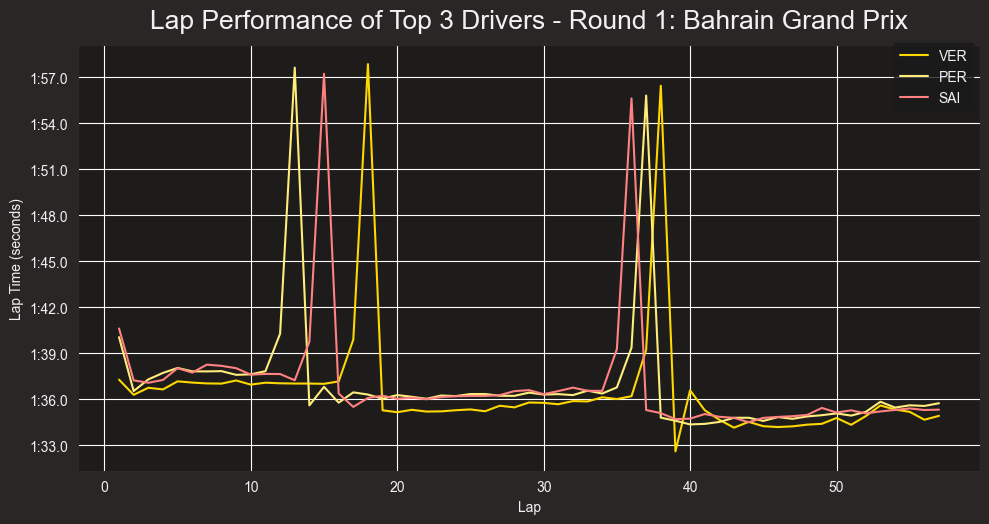

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\plotting\_plotting.py:151: FutureWarning:

The function `driver_color` is deprecated and will be removed in a future version. Use `fastf1.plotting.get_driver_color` instead.



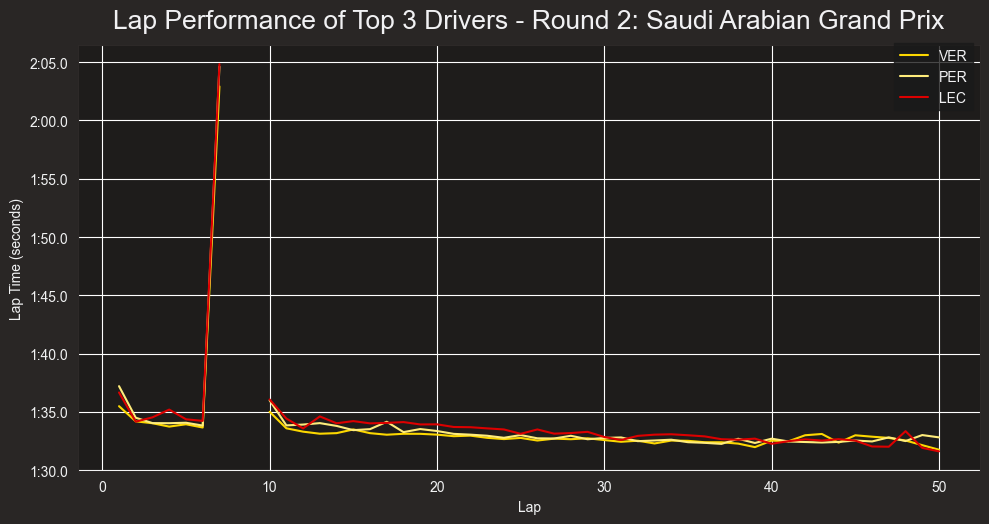

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\plotting\_plotting.py:151: FutureWarning:

The function `driver_color` is deprecated and will be removed in a future version. Use `fastf1.plotting.get_driver_color` instead.



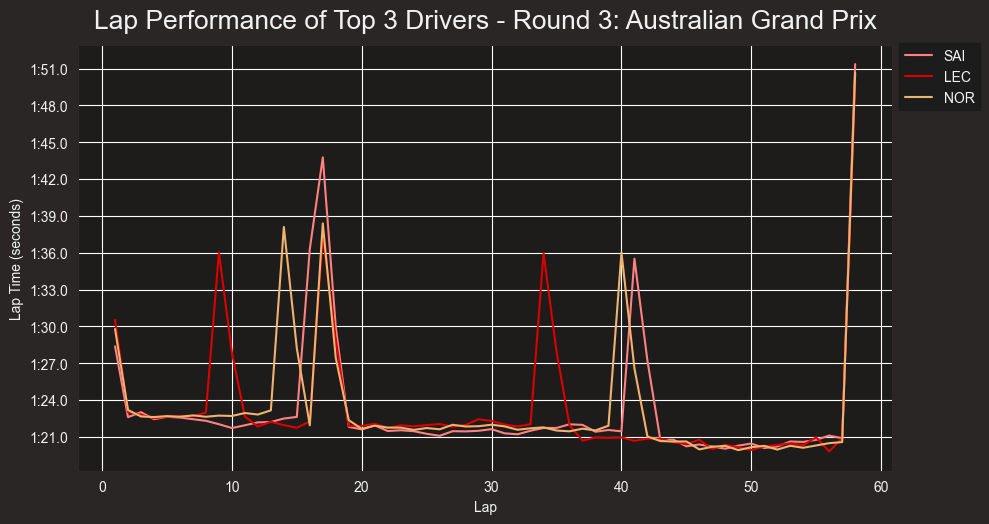

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\plotting\_plotting.py:151: FutureWarning:

The function `driver_color` is deprecated and will be removed in a future version. Use `fastf1.plotting.get_driver_color` instead.



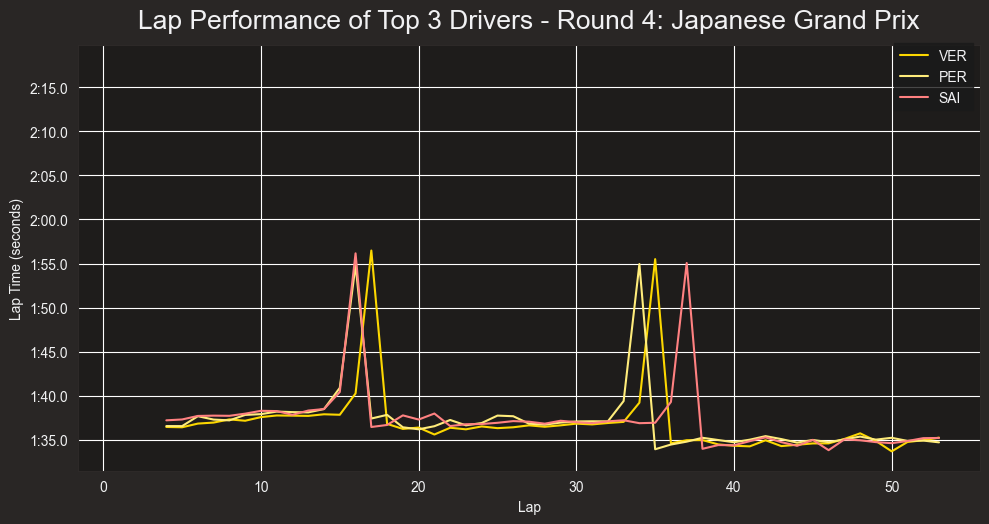

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\plotting\_plotting.py:151: FutureWarning:

The function `driver_color` is deprecated and will be removed in a future version. Use `fastf1.plotting.get_driver_color` instead.



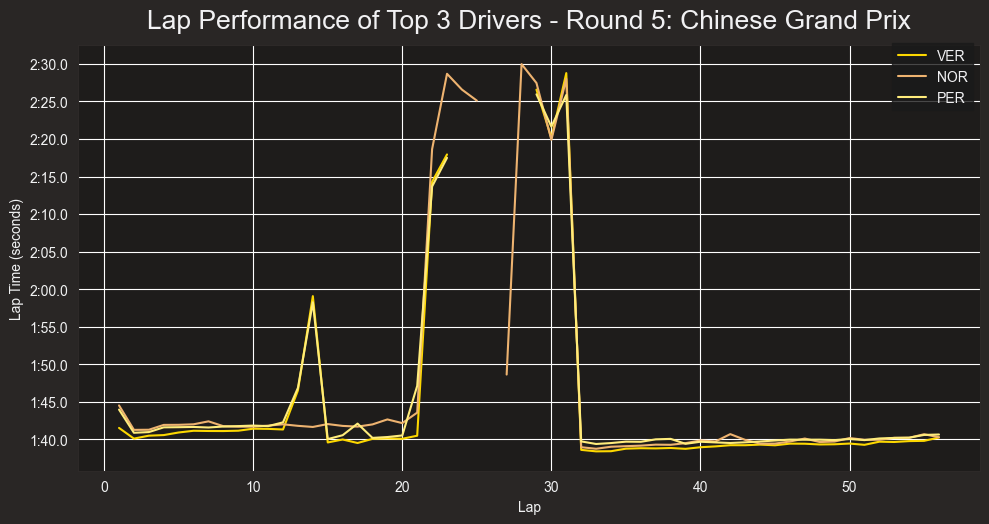

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\plotting\_plotting.py:151: FutureWarning:

The function `driver_color` is deprecated and will be removed in a future version. Use `fastf1.plotting.get_driver_color` instead.



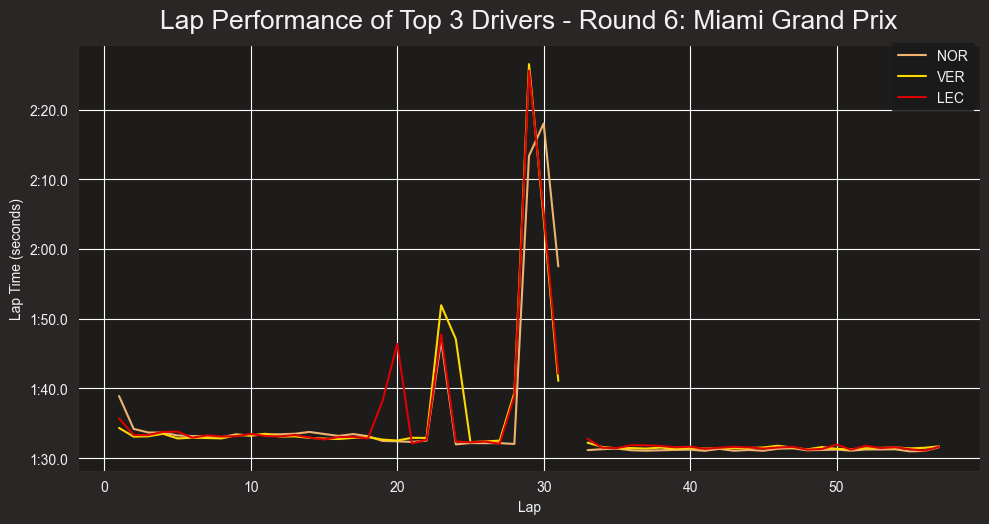

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\plotting\_plotting.py:151: FutureWarning:

The function `driver_color` is deprecated and will be removed in a future version. Use `fastf1.plotting.get_driver_color` instead.



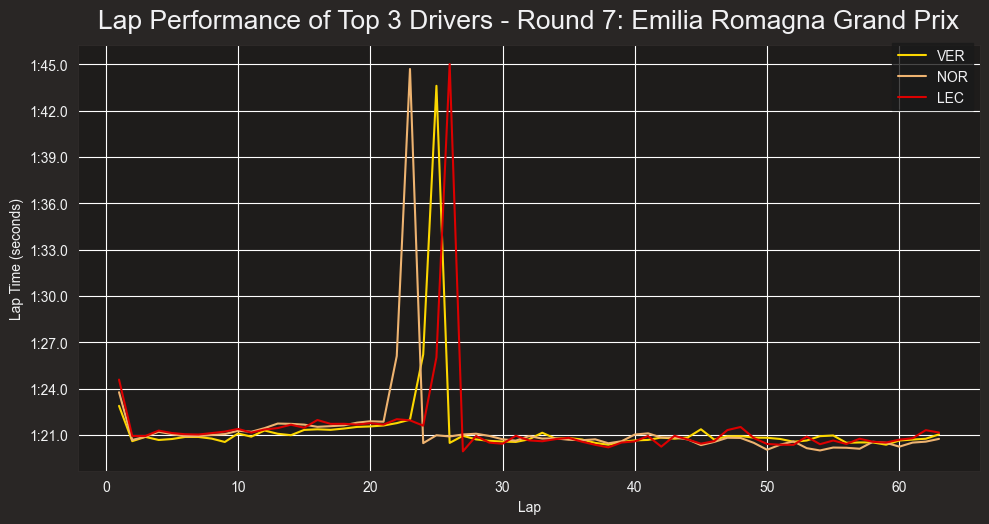

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\plotting\_plotting.py:151: FutureWarning:

The function `driver_color` is deprecated and will be removed in a future version. Use `fastf1.plotting.get_driver_color` instead.



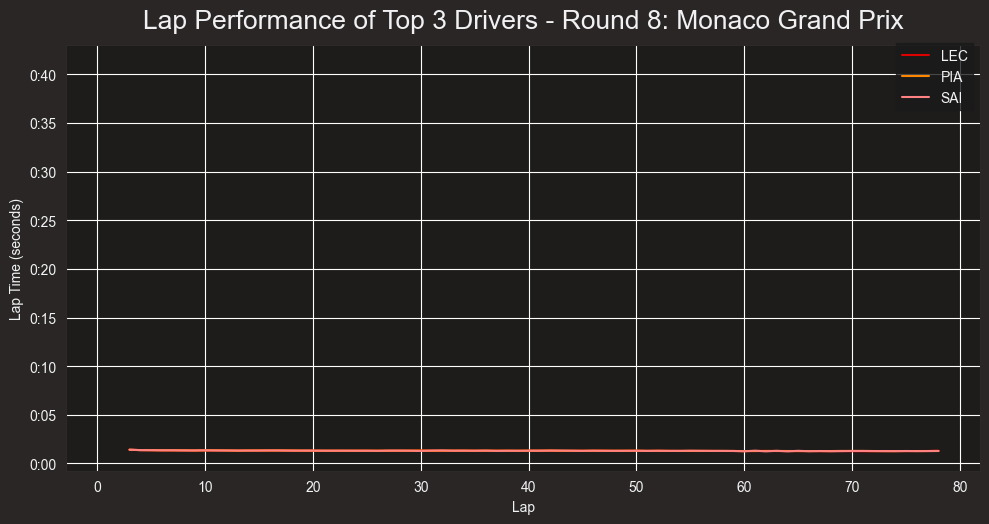

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\plotting\_plotting.py:151: FutureWarning:

The function `driver_color` is deprecated and will be removed in a future version. Use `fastf1.plotting.get_driver_color` instead.



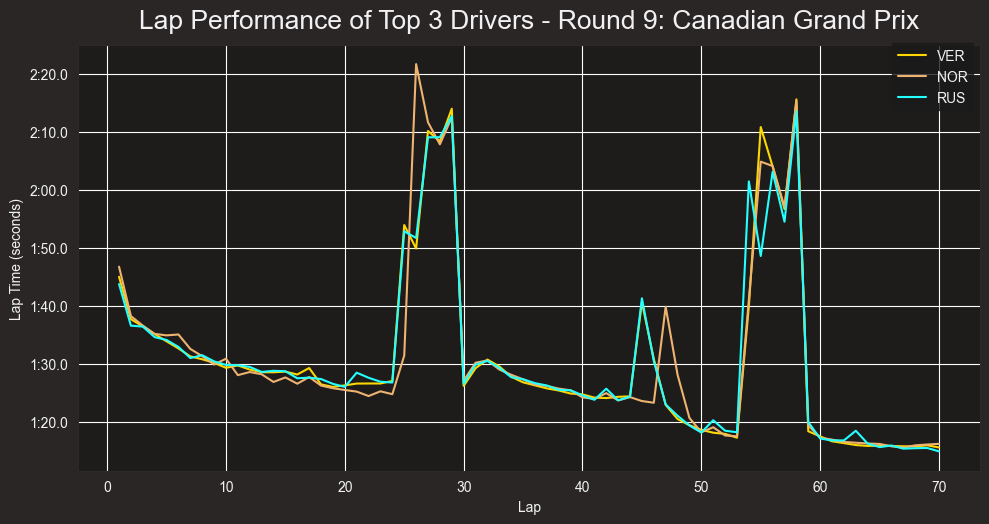

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\plotting\_plotting.py:151: FutureWarning:

The function `driver_color` is deprecated and will be removed in a future version. Use `fastf1.plotting.get_driver_color` instead.



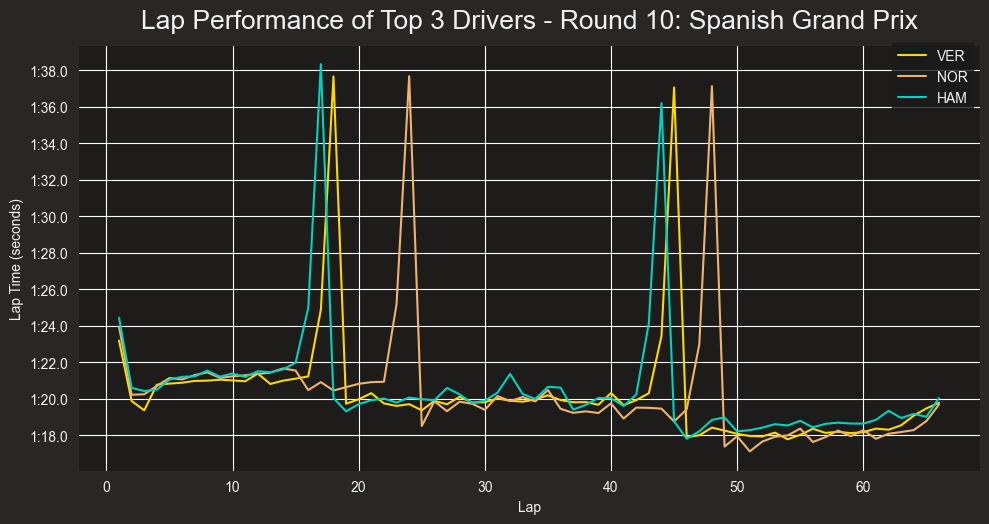

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\plotting\_plotting.py:151: FutureWarning:

The function `driver_color` is deprecated and will be removed in a future version. Use `fastf1.plotting.get_driver_color` instead.



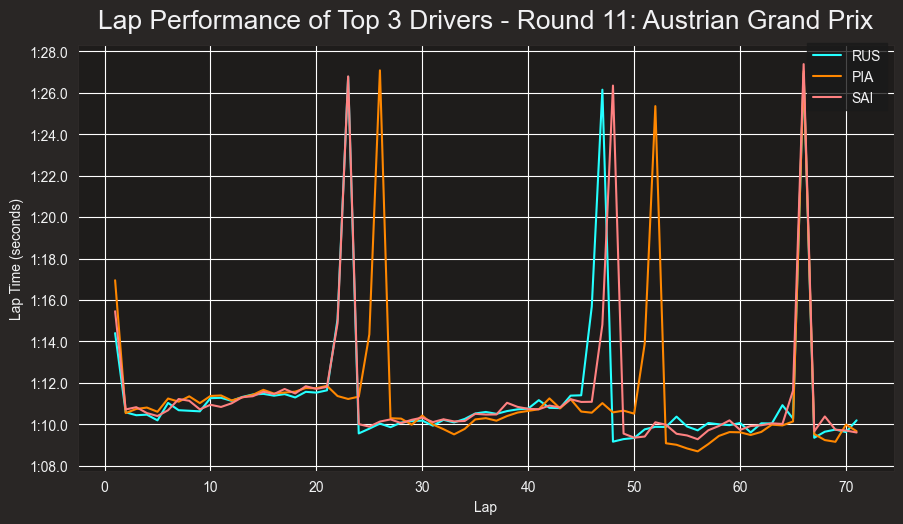

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\plotting\_plotting.py:151: FutureWarning:

The function `driver_color` is deprecated and will be removed in a future version. Use `fastf1.plotting.get_driver_color` instead.



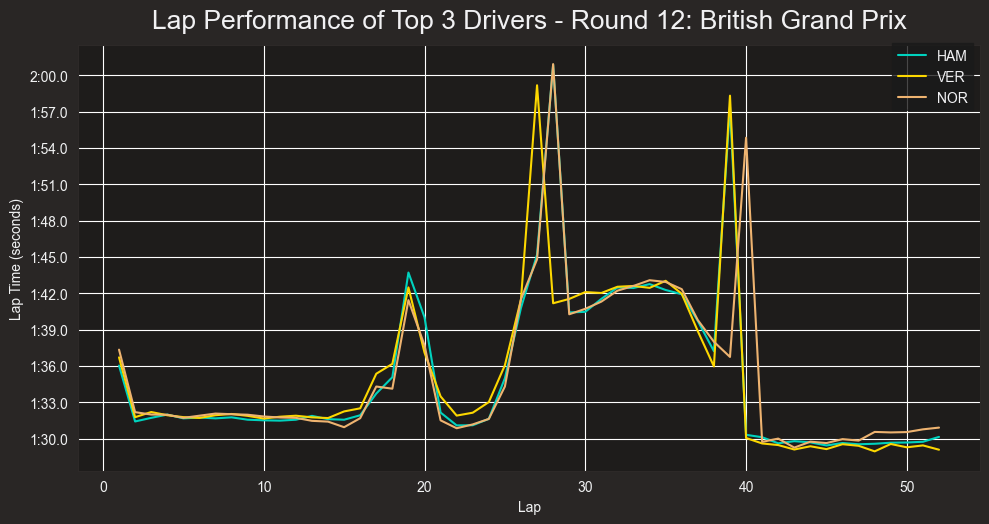

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\plotting\_plotting.py:151: FutureWarning:

The function `driver_color` is deprecated and will be removed in a future version. Use `fastf1.plotting.get_driver_color` instead.



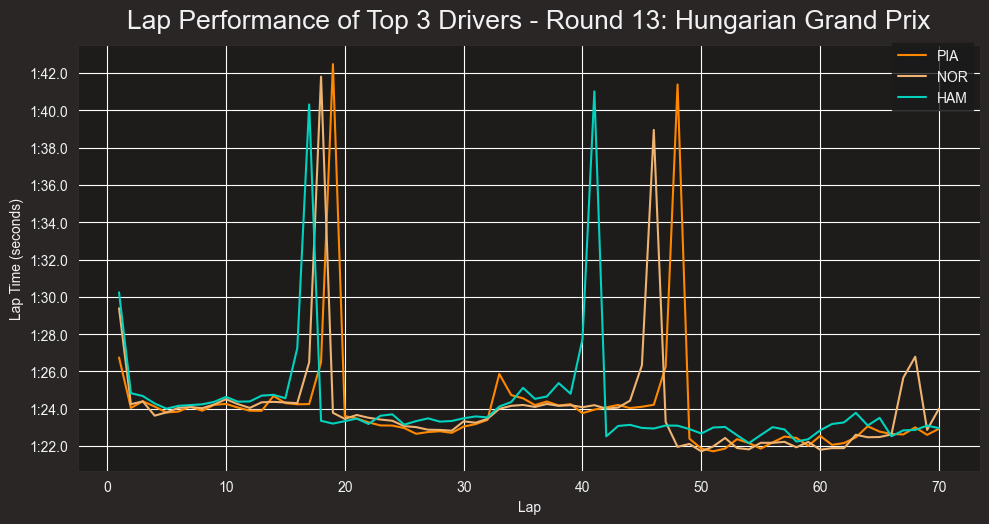

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\plotting\_plotting.py:151: FutureWarning:

The function `driver_color` is deprecated and will be removed in a future version. Use `fastf1.plotting.get_driver_color` instead.



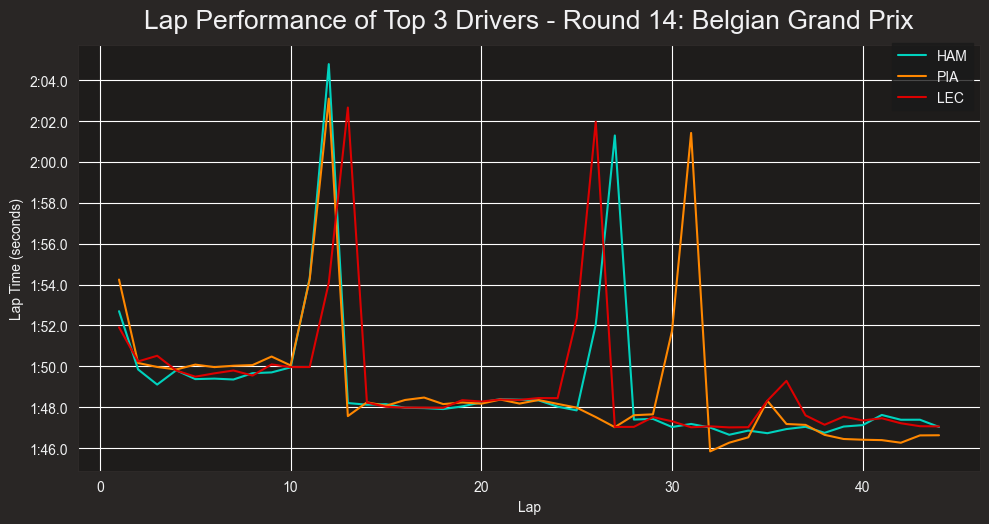

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\plotting\_plotting.py:151: FutureWarning:

The function `driver_color` is deprecated and will be removed in a future version. Use `fastf1.plotting.get_driver_color` instead.



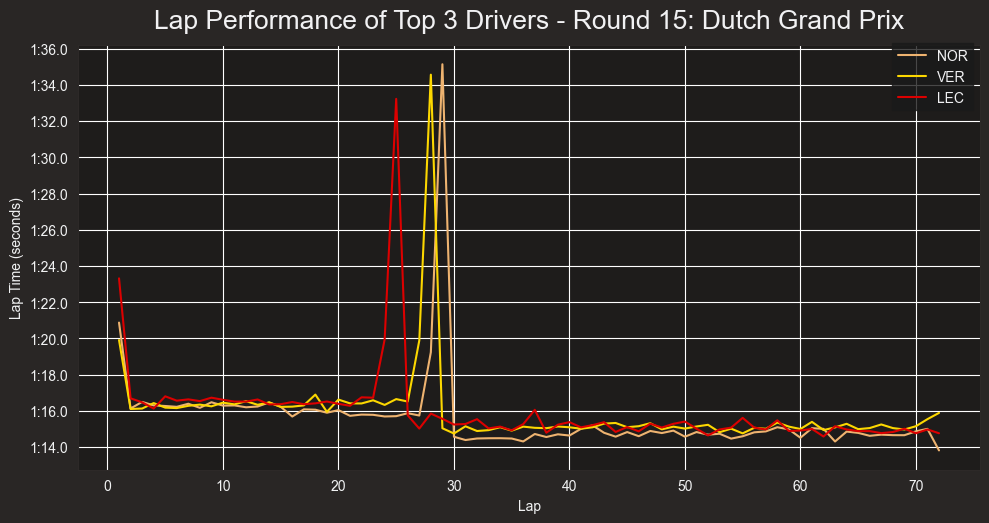

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\plotting\_plotting.py:151: FutureWarning:

The function `driver_color` is deprecated and will be removed in a future version. Use `fastf1.plotting.get_driver_color` instead.



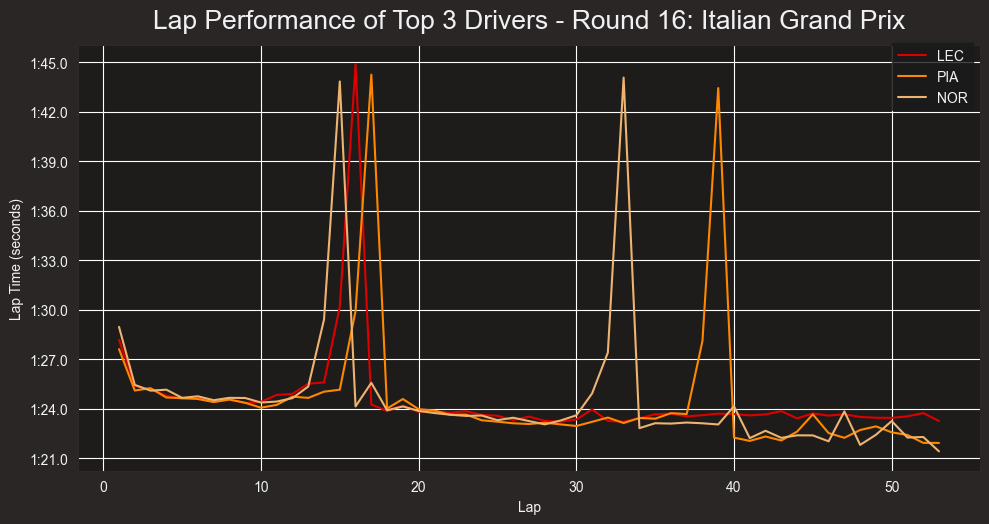

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\plotting\_plotting.py:151: FutureWarning:

The function `driver_color` is deprecated and will be removed in a future version. Use `fastf1.plotting.get_driver_color` instead.



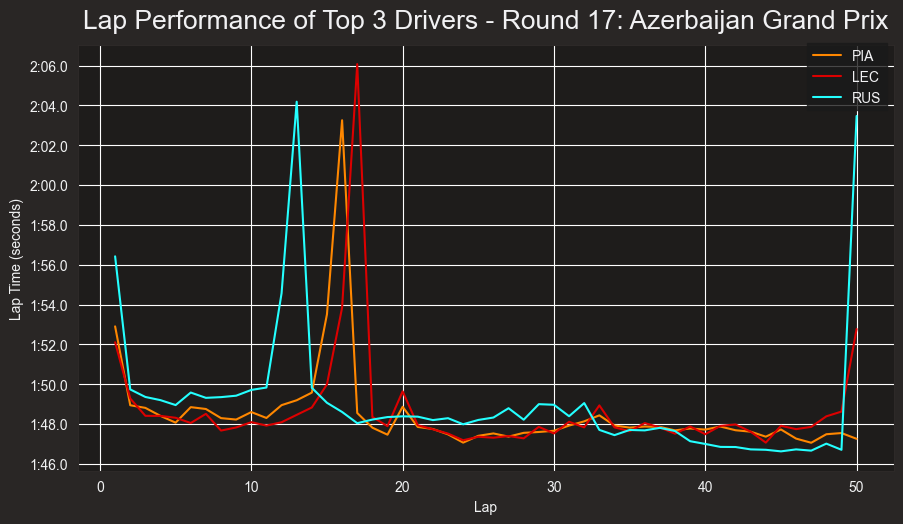

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\plotting\_plotting.py:151: FutureWarning:

The function `driver_color` is deprecated and will be removed in a future version. Use `fastf1.plotting.get_driver_color` instead.



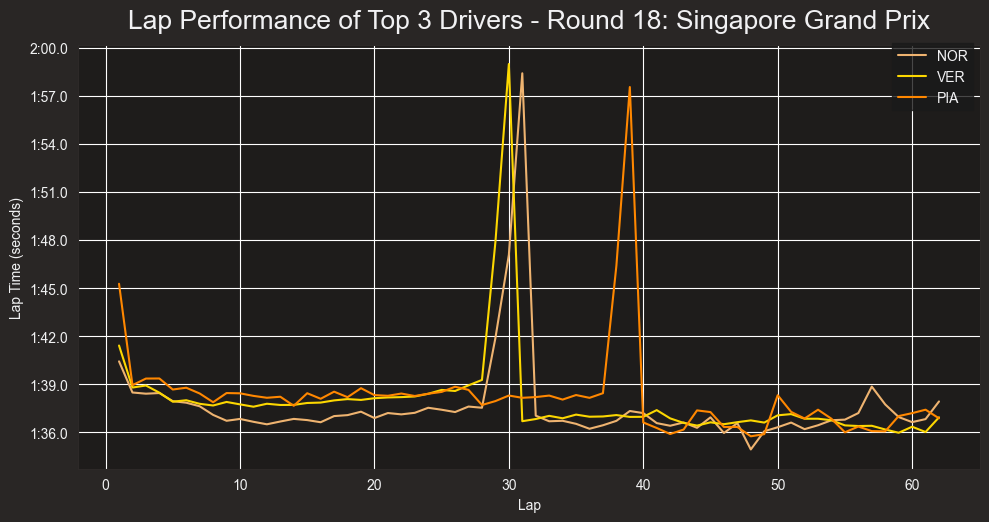

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\plotting\_plotting.py:151: FutureWarning:

The function `driver_color` is deprecated and will be removed in a future version. Use `fastf1.plotting.get_driver_color` instead.



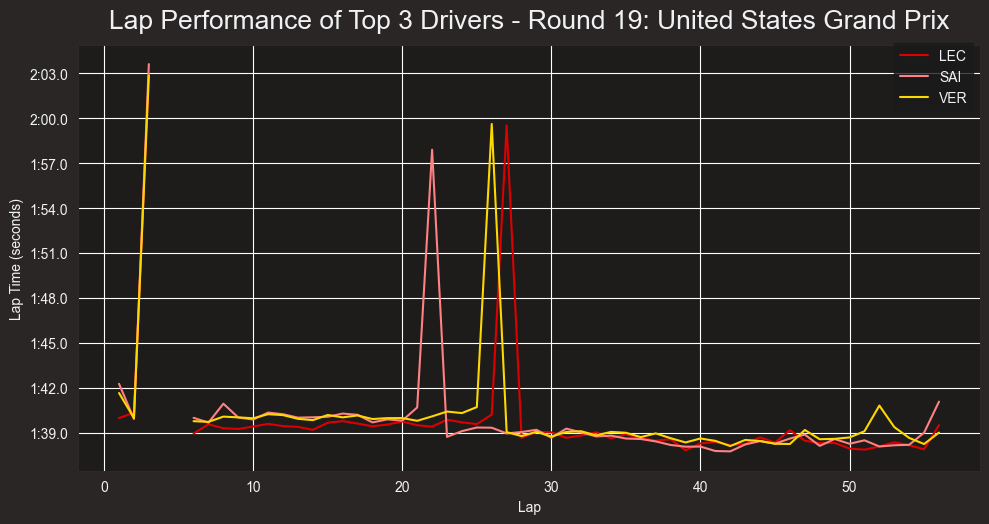

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\plotting\_plotting.py:151: FutureWarning:

The function `driver_color` is deprecated and will be removed in a future version. Use `fastf1.plotting.get_driver_color` instead.



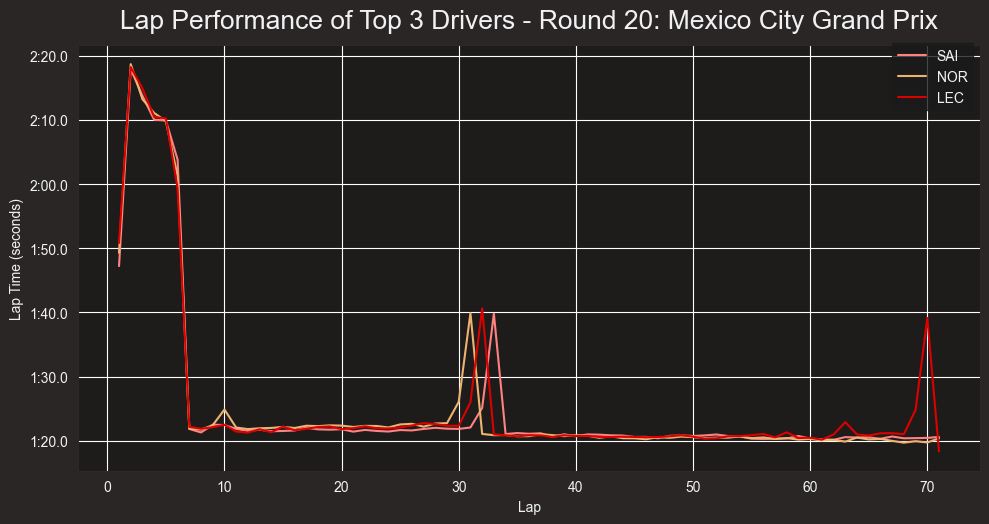

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\plotting\_plotting.py:151: FutureWarning:

The function `driver_color` is deprecated and will be removed in a future version. Use `fastf1.plotting.get_driver_color` instead.



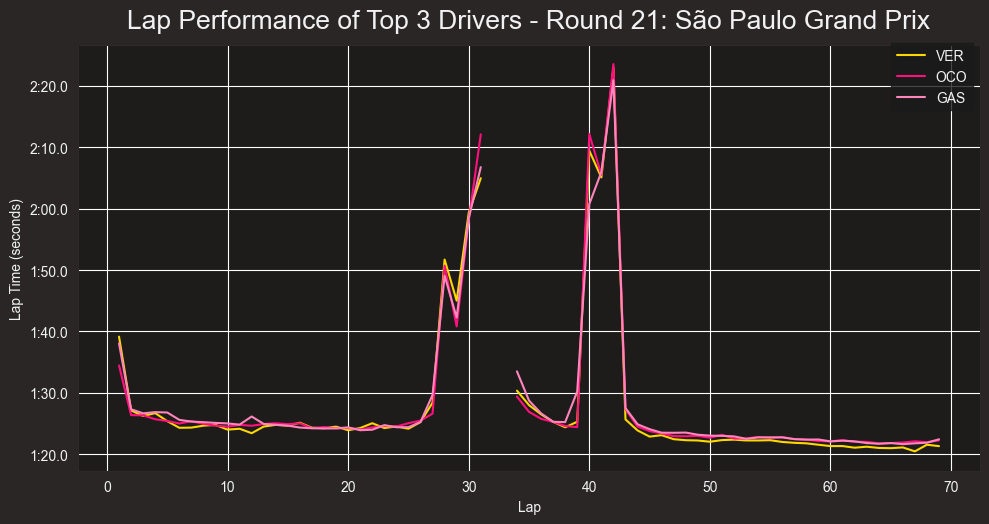

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\plotting\_plotting.py:151: FutureWarning:

The function `driver_color` is deprecated and will be removed in a future version. Use `fastf1.plotting.get_driver_color` instead.



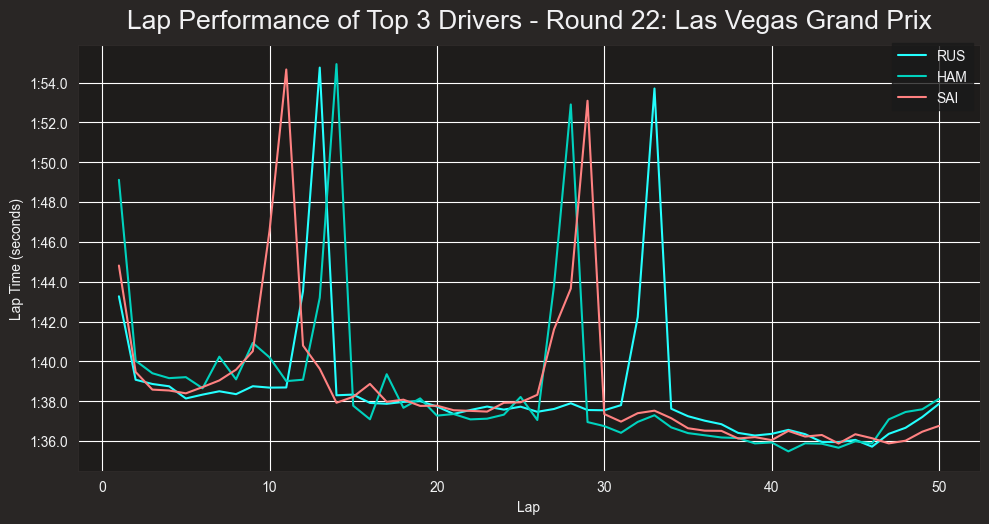

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\plotting\_plotting.py:151: FutureWarning:

The function `driver_color` is deprecated and will be removed in a future version. Use `fastf1.plotting.get_driver_color` instead.



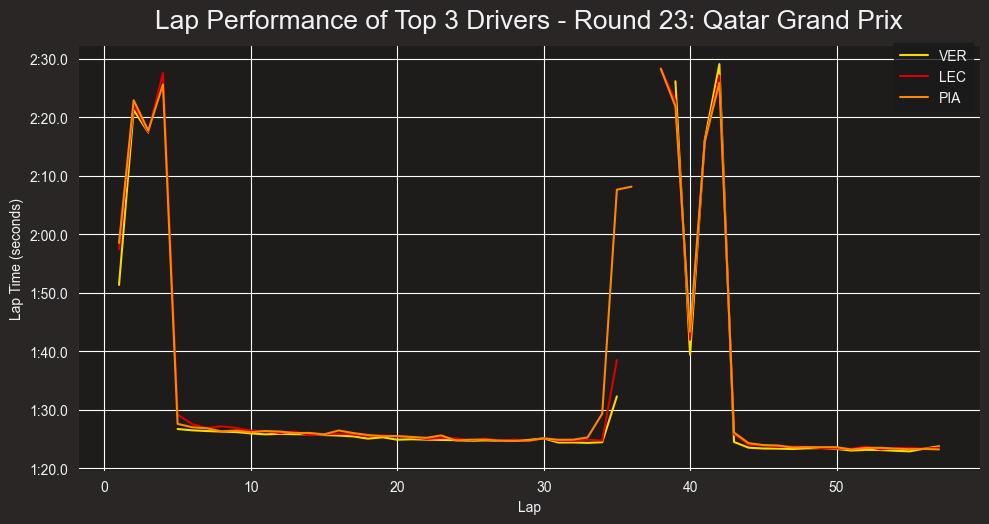

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\plotting\_plotting.py:151: FutureWarning:

The function `driver_color` is deprecated and will be removed in a future version. Use `fastf1.plotting.get_driver_color` instead.



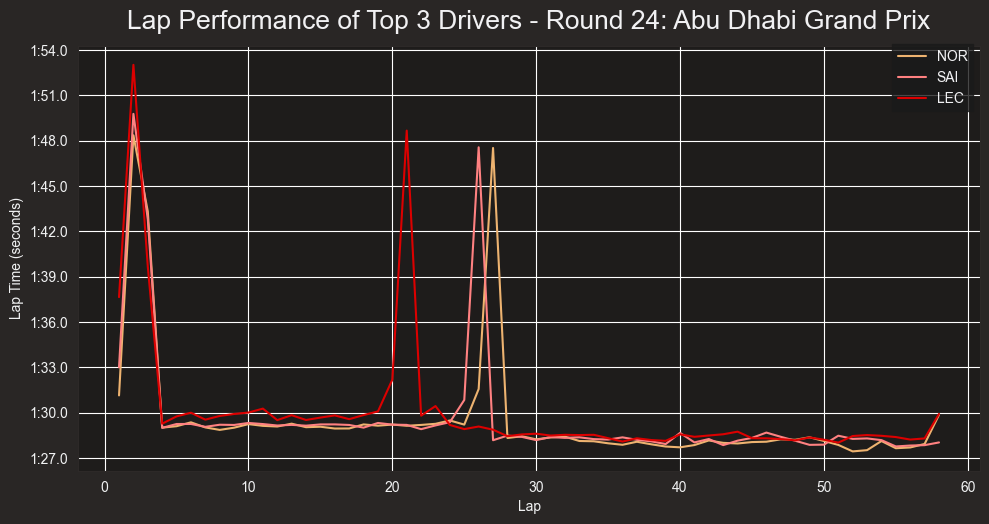

In [33]:


f1plot.setup_mpl(misc_mpl_mods=False)
for round_number, session in cached_sessions.items():
    results = session.results
    
    # Getting top 3 drivers based on final positions
    top_3_drivers = results.nsmallest(3, 'Position')['Abbreviation'].tolist()
    
    fig, ax = plt.subplots(figsize=(10, 5))
    
    for driver in top_3_drivers:
        driver_laps = session.laps.pick_driver(driver)
        
        if not driver_laps.empty:
            abb = driver_laps['Driver'].iloc[0]
            color = f1plot.driver_color(abb)
            
            # Plotting the lap time throughout the race
            ax.plot(driver_laps['LapNumber'], driver_laps['LapTime'], label=abb, color=color)
    
    ax.set_xlabel('Lap')
    ax.set_ylabel('Lap Time (seconds)')
    
   
    ax.legend(bbox_to_anchor=(1.0, 1.02))
    plt.tight_layout()
    plt.title(f"Lap Performance of Top 3 Drivers - Round {round_number}: {round_to_track[round_number]}")
    plt.show()

#### Tyre Stints 

In [34]:
all_stints = []

# Iterate through all cached sessions
for round_number, session in cached_sessions.items():
    laps = session.laps.copy()
    laps['Race'] = round_to_track[round_number]  # Add race name using mapping

    # Extract and group stint data
    stints = laps[['Race', 'Driver', 'Stint', 'Compound', 'LapNumber']]
    stints = stints.groupby(['Race', 'Driver', 'Stint', 'Compound']).count().reset_index()
    stints = stints.rename(columns={'LapNumber': 'StintLength'})

    # Store in list
    all_stints.append(stints)
    # Combine all stints data into a single DataFrame
all_stints_df = pd.concat(all_stints, ignore_index=True)


In [35]:
all_stints_df

,Race,Driver,Stint,Compound,StintLength
0,Bahrain Grand Prix,ALB,1.0,SOFT,15
1,Bahrain Grand Prix,ALB,2.0,HARD,21
2,Bahrain Grand Prix,ALB,3.0,HARD,20
3,Bahrain Grand Prix,ALO,1.0,SOFT,15
4,Bahrain Grand Prix,ALO,2.0,HARD,26
...,...,...,...,...,...
1297,Abu Dhabi Grand Prix,VER,1.0,MEDIUM,29
1298,Abu Dhabi Grand Prix,VER,2.0,HARD,29
1299,Abu Dhabi Grand Prix,ZHO,1.0,MEDIUM,12
1300,Abu Dhabi Grand Prix,ZHO,2.0,HARD,27


In [ ]:
compound_colors = {
    'SOFT': 'Red',
    'MEDIUM': 'Yellow',
    'HARD': 'White',
    'WET': 'Blue',
    'INTERMEDIATE': 'Green'
}

In [36]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import pandas as pd


compound_colors = {
    'SOFT': 'Red',
    'MEDIUM': 'Yellow',
    'HARD': 'White',
    'WET': 'Blue',
    'INTERMEDIATE': 'Green'
}


for round_number, session in cached_sessions.items():
    results = session.results
    
  
    top_3_drivers = results.nsmallest(3, 'Position')['Abbreviation'].tolist()
    
    
    fig = make_subplots(rows=2, cols=1, shared_xaxes=True, vertical_spacing=0.1,
                        subplot_titles=("Lap Performance", "Stint Lengths by Compound"),
                        row_heights=[0.7, 0.3])

   
    legend_shapes = {}

    # Plot lap times for top 3 drivers
    for driver in top_3_drivers:
        driver_laps = session.laps.pick_driver(driver)
        
        if not driver_laps.empty:
            abb = driver_laps['Driver'].iloc[0]
            color = f1plot.driver_color(abb)
            
            # Add trace for lap times with driver name in legend
            fig.add_trace(
                go.Scatter(
                    x=driver_laps['LapNumber'],
                    y=driver_laps['LapTime'].dt.total_seconds(),  # Convert LapTime to total seconds
                    mode='lines+markers',
                    name=f"{abb} (Lap Times)", 
                    line=dict(color=color, width=2),
                    showlegend=True
                ),
                row=1, col=1
            )
            # Store for custom legend
            legend_shapes[abb] = color

    # Filter stints data for the current race
    race_stints = all_stints_df[all_stints_df['Race'] == round_to_track[round_number]]
    top_3_race_stints = race_stints[race_stints['Driver'].isin(top_3_drivers)]
    
    previous_stint_end = {}

    # Plot stint lengths with tire compounds
    for _, row in top_3_race_stints.iterrows():
        driver = row['Driver']
        if driver not in previous_stint_end:
            previous_stint_end[driver] = 0

        # Add bar for stint length with compound color and label
        fig.add_trace(
            go.Bar(
                x=[row['StintLength']],
                y=[f"{driver} ({row['Compound']})"],  # Label with driver and compound
                orientation='h',
                marker=dict(color=compound_colors[row['Compound']]),
                name=f"{driver} - {row['Compound']}", 
                showlegend=True
            ),
            row=2, col=1
        )
        previous_stint_end[driver] += row['StintLength']

    
    fig.update_layout(
        title=f"Driver Race Performance - Round {round_number}: {round_to_track[round_number]}",
        template='plotly_dark',
        legend_title='Legend',
        legend=dict(
            orientation="v",
            yanchor="top",
            y=1.1,  # Adjust position to avoid overlapping
            xanchor="left",
            x=1.1,
            title_font_size=14,
            font_size=12
        ),
        showlegend=True,  # Ensure legend is visible
        height=900,  # Increase height for better visibility
        margin=dict(l=50, r=50, t=100, b=50)  # Adjust margins for better spacing
    )

   
    fig.update_xaxes(title_text="Lap Number", row=1, col=1, title_font_size=14)
    fig.update_yaxes(title_text="Lap Time (seconds)", row=1, col=1, title_font_size=14)
    fig.update_xaxes(title_text="Stint Length (Laps)", row=2, col=1, title_font_size=14)
    fig.update_yaxes(title_text="Driver & Tire Compound", row=2, col=1, title_font_size=14)

    # Add annotations for tire compounds in the stint chart
    for driver in top_3_drivers:
        driver_stints = top_3_race_stints[top_3_race_stints['Driver'] == driver]
        for _, row in driver_stints.iterrows():
            fig.add_annotation(
                x=row['StintLength'] / 2,  # Center of the bar
                y=f"{driver} ({row['Compound']})",
                xref="x2", yref="y2",
                text=f"{row['Compound']}",  # Show compound name
                showarrow=False,
                font=dict(size=12, color="white"),
                bgcolor=compound_colors[row['Compound']],
                opacity=0.7
            )

   
    fig.show()

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\plotting\_plotting.py:151: FutureWarning:

The function `driver_color` is deprecated and will be removed in a future version. Use `fastf1.plotting.get_driver_color` instead.



c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\plotting\_plotting.py:151: FutureWarning:

The function `driver_color` is deprecated and will be removed in a future version. Use `fastf1.plotting.get_driver_color` instead.



c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\plotting\_plotting.py:151: FutureWarning:

The function `driver_color` is deprecated and will be removed in a future version. Use `fastf1.plotting.get_driver_color` instead.



c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\plotting\_plotting.py:151: FutureWarning:

The function `driver_color` is deprecated and will be removed in a future version. Use `fastf1.plotting.get_driver_color` instead.



c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\plotting\_plotting.py:151: FutureWarning:

The function `driver_color` is deprecated and will be removed in a future version. Use `fastf1.plotting.get_driver_color` instead.



c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\plotting\_plotting.py:151: FutureWarning:

The function `driver_color` is deprecated and will be removed in a future version. Use `fastf1.plotting.get_driver_color` instead.



c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\plotting\_plotting.py:151: FutureWarning:

The function `driver_color` is deprecated and will be removed in a future version. Use `fastf1.plotting.get_driver_color` instead.



c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\plotting\_plotting.py:151: FutureWarning:

The function `driver_color` is deprecated and will be removed in a future version. Use `fastf1.plotting.get_driver_color` instead.



c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\plotting\_plotting.py:151: FutureWarning:

The function `driver_color` is deprecated and will be removed in a future version. Use `fastf1.plotting.get_driver_color` instead.



c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\plotting\_plotting.py:151: FutureWarning:

The function `driver_color` is deprecated and will be removed in a future version. Use `fastf1.plotting.get_driver_color` instead.



c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\plotting\_plotting.py:151: FutureWarning:

The function `driver_color` is deprecated and will be removed in a future version. Use `fastf1.plotting.get_driver_color` instead.



c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\plotting\_plotting.py:151: FutureWarning:

The function `driver_color` is deprecated and will be removed in a future version. Use `fastf1.plotting.get_driver_color` instead.



c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\plotting\_plotting.py:151: FutureWarning:

The function `driver_color` is deprecated and will be removed in a future version. Use `fastf1.plotting.get_driver_color` instead.



c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\plotting\_plotting.py:151: FutureWarning:

The function `driver_color` is deprecated and will be removed in a future version. Use `fastf1.plotting.get_driver_color` instead.



c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\plotting\_plotting.py:151: FutureWarning:

The function `driver_color` is deprecated and will be removed in a future version. Use `fastf1.plotting.get_driver_color` instead.



c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\plotting\_plotting.py:151: FutureWarning:

The function `driver_color` is deprecated and will be removed in a future version. Use `fastf1.plotting.get_driver_color` instead.



c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\plotting\_plotting.py:151: FutureWarning:

The function `driver_color` is deprecated and will be removed in a future version. Use `fastf1.plotting.get_driver_color` instead.



c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\plotting\_plotting.py:151: FutureWarning:

The function `driver_color` is deprecated and will be removed in a future version. Use `fastf1.plotting.get_driver_color` instead.



c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\plotting\_plotting.py:151: FutureWarning:

The function `driver_color` is deprecated and will be removed in a future version. Use `fastf1.plotting.get_driver_color` instead.



c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\plotting\_plotting.py:151: FutureWarning:

The function `driver_color` is deprecated and will be removed in a future version. Use `fastf1.plotting.get_driver_color` instead.



c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\plotting\_plotting.py:151: FutureWarning:

The function `driver_color` is deprecated and will be removed in a future version. Use `fastf1.plotting.get_driver_color` instead.



c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\plotting\_plotting.py:151: FutureWarning:

The function `driver_color` is deprecated and will be removed in a future version. Use `fastf1.plotting.get_driver_color` instead.



c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\plotting\_plotting.py:151: FutureWarning:

The function `driver_color` is deprecated and will be removed in a future version. Use `fastf1.plotting.get_driver_color` instead.



c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\plotting\_plotting.py:151: FutureWarning:

The function `driver_color` is deprecated and will be removed in a future version. Use `fastf1.plotting.get_driver_color` instead.



 ## Teammate Performance Analysis

#### Function to analyze teammate head to head race battles

In [37]:
          
def get_teammate_battles():
    battles = []
    for round_number in range(1, len(schedule)):
        session = fastf1.get_session(2024, round_number, 'R')
        session.load()
        results = session.results

        for team in results['TeamName'].unique():
            team_drivers = results[results['TeamName'] == team]
            
            if len(team_drivers) == 2:
                try:
                    drivers = team_drivers[['Abbreviation', 'Position', 'Points']].sort_values('Position')
                    driver1, pos1, points1 = drivers.iloc[0]['Abbreviation'], drivers.iloc[0]['Position'], drivers.iloc[0]['Points']
                    driver2, pos2, points2 = drivers.iloc[1]['Abbreviation'], drivers.iloc[1]['Position'], drivers.iloc[1]['Points']
                    
                    team_name = team_drivers['TeamName'].iloc[0]
                    
                    battles.append({
                        'Round': round_number,
                        'Track': round_to_track[round_number],
                        'Driver1': driver1,
                        'Driver2': driver2,
                        'Team': team_name,
                        'Position1': pos1,
                        'Position2': pos2,
                        'Points1': points1,
                        'Points2': points2
                    })
                except Exception as e:
                    print(f"Error in {team} {round_number} {e}")
    return pd.DataFrame(battles)


In [38]:
teammate_battles = get_teammate_battles()

core           INFO 	Loading data for Bahrain Grand Prix - Race [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
Request for URL https://ergast.com/api/f1/2024/1/results.json failed; using cached response
Traceback (most recent call last):
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 286, in _resend
    response = self._send_and_cache(request, actions, cached_response, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 254, in _send_and_cache
    response = super().send(request, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\req.py", line 134, in send
    lim.limit()
  File "c:\Users\Admin\Desktop\F1 2024 S

In [39]:
unique_teams = teammate_battles['Team'].unique()
print(unique_teams)

['Red Bull Racing' 'Ferrari' 'Mercedes' 'McLaren' 'Aston Martin'
 'Kick Sauber' 'Haas F1 Team' 'RB' 'Williams' 'Alpine']


In [40]:
team_colors = {
    'Red Bull Racing':'#3671C6',
    'Ferrari': '#E8002D',
    'Mercedes':'#27F4D2',
    'McLaren':'#FF8000',
    'Aston Martin':'#229971',
    'Alpine':'#FF87BC',
    'Kick Sauber': '#52E252',
    'Haas F1 Team':'#B6BABD',
    'RB':'#6692FF',
    'Williams':'#64C4FF'
}

#### Race Finish Comparisions

In [41]:
import plotly.graph_objects as go




unique_teams = teammate_battles['Team'].unique()


for team_name in unique_teams:
    
    team_data = teammate_battles[teammate_battles['Team'] == team_name]
    
    if not team_data.empty:
        
        fig = go.Figure()

        
        fig.add_trace(
            go.Scatter(
                x=team_data['Track'],  
                y=team_data['Position1'],  
                mode='lines+markers',
                name=team_data['Driver1'].iloc[0],  
                marker=dict(size=10),
                text=team_data['Driver1'],
                hovertemplate='<b>Round</b>: %{customdata[0]}<br><b>Track</b>: %{x}<br><b>Driver</b>: %{text}<br><b>Position</b>: %{y}',
                customdata=team_data[['Round', 'Driver1']]
            )
        )

        
        fig.add_trace(
            go.Scatter(
                x=team_data['Track'], 
                y=team_data['Position2'],  
                mode='lines+markers',
                name=team_data['Driver2'].iloc[0], 
                marker=dict(size=10),
                text=team_data['Driver2'],
                hovertemplate='<b>Round</b>: %{customdata[0]}<br><b>Track</b>: %{x}<br><b>Driver</b>: %{text}<br><b>Position</b>: %{y}',
                customdata=team_data[['Round', 'Driver2']]
            )
        )

        
        fig.update_layout(
            title=f'Teammate Performance Comparison for {team_name}',
            xaxis_title='Track',
            yaxis_title='Finishing Position',
            legend_title='Drivers',
            legend=dict(
                orientation="v",
                yanchor="top",
                y=1.05,
                xanchor="left",
                x=1.05
            ),
            template='plotly_dark',
            yaxis=dict(
                autorange="reversed",  
                tickmode='linear',     
                dtick=1       #setting position interval to 1          
            )
        )


        
        fig.show()
    else:
        print(f"No data available for {team_name}.")

#### updated code with substituted and replaced drivers handled

In [42]:
def get_teammate_battles():
    battles = []

    # Special driver replacements (subs = temporary, replacements = full-time switch)
    subs = {
        "Ferrari": {2: "BEA"},  # Bearman for Sainz in Round 2
        "Haas F1 Team": {20: "BEA", 21: "BEA"},  # Bearman for Magnussen
        "Alpine F1 Team": {24: "DOO"},  # Doohan for Ocon in Round 24
    }
    replacements = {
        "RB": {round_num: "LAW" for round_num in range(18, 25)}  # Lawson replaced Ricciardo
    }

    for round_number in range(1, len(schedule)):
        session = fastf1.get_session(2024, round_number, 'R')
        session.load()
        results = session.results

        for team in results['TeamName'].unique():
            team_drivers = results[results['TeamName'] == team]

            if len(team_drivers) == 2:
                try:
                    drivers = team_drivers[['Abbreviation', 'Position', 'Points']].sort_values('Position')
                    driver1, pos1, points1 = drivers.iloc[0]['Abbreviation'], drivers.iloc[0]['Position'], drivers.iloc[0]['Points']
                    driver2, pos2, points2 = drivers.iloc[1]['Abbreviation'], drivers.iloc[1]['Position'], drivers.iloc[1]['Points']

                    team_name = team_drivers['TeamName'].iloc[0]

                    # Handle temporary substitutions
                    if team_name in subs and round_number in subs[team_name]:
                        sub_driver = subs[team_name][round_number]
                        if driver1 in subs[team_name].values():
                            driver1 = sub_driver
                        else:
                            driver2 = sub_driver

                    # Handle full-time replacements (LAW replacing RIC)
                    if team_name in replacements and round_number in replacements[team_name]:
                        new_driver = replacements[team_name][round_number]
                        if driver1 == "RIC":
                            driver1 = new_driver
                        elif driver2 == "RIC":
                            driver2 = new_driver

                    battles.append({
                        'Round': round_number,
                        'Track': round_to_track[round_number],
                        'Driver1': driver1,
                        'Driver2': driver2,
                        'Team': team_name,
                        'Position1': pos1,
                        'Position2': pos2,
                        'Points1': points1,
                        'Points2': points2
                    })
                except Exception as e:
                    print(f"Error in {team} Round {round_number}: {e}")

    return pd.DataFrame(battles)


In [43]:
teammate_battles_new = get_teammate_battles()

core           INFO 	Loading data for Bahrain Grand Prix - Race [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
Request for URL https://ergast.com/api/f1/2024/1/results.json failed; using cached response
Traceback (most recent call last):
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 286, in _resend
    response = self._send_and_cache(request, actions, cached_response, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 254, in _send_and_cache
    response = super().send(request, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\req.py", line 134, in send
    lim.limit()
  File "c:\Users\Admin\Desktop\F1 2024 S

req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for lap_count
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
Request for URL https://ergast.com/api/f1/2024/1/laps/1.json failed; using cached response
Traceback (most recent call last):
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 286, in _resend
    response = self._send_and_cache(request, actions, cached_response, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 254, in _send_and_cache
    response = super().send(request, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File

In [44]:
import plotly.graph_objects as go

unique_teams = teammate_battles_new['Team'].unique()

for team_name in unique_teams:
    team_data = teammate_battles_new[teammate_battles_new['Team'] == team_name]
    
    if not team_data.empty:
        fig = go.Figure()

        # Get unique drivers to correctly label traces
        unique_drivers = set(team_data['Driver1']).union(set(team_data['Driver2']))

        for driver in unique_drivers:
            driver_data = team_data[(team_data['Driver1'] == driver) | (team_data['Driver2'] == driver)]
            
            # Ensure the correct position column is selected for each driver
            driver_positions = []
            driver_tracks = []
            for _, row in driver_data.iterrows():
                if row['Driver1'] == driver:
                    driver_positions.append(row['Position1'])
                else:
                    driver_positions.append(row['Position2'])
                driver_tracks.append(row['Track'])

            # Plot each driver as a separate trace
            fig.add_trace(
                go.Scatter(
                    x=driver_tracks,
                    y=driver_positions,
                    mode='lines+markers',
                    name=driver,
                    marker=dict(size=10),
                    text=[driver] * len(driver_tracks),
                    hovertemplate='<b>Round</b>: %{customdata[0]}<br><b>Track</b>: %{x}<br><b>Driver</b>: %{text}<br><b>Position</b>: %{y}',
                    customdata=list(zip(driver_data['Round'], [driver] * len(driver_tracks)))
                )
            )

        fig.update_layout(
            title=f'Teammate Performance Comparison for {team_name}',
            xaxis_title='Track',
            yaxis_title='Finishing Position',
            legend_title='Drivers',
            legend=dict(
                orientation="v",
                yanchor="top",
                y=1.05,
                xanchor="left",
                x=1.05
            ),
            template='plotly_dark',
            yaxis=dict(
                autorange="reversed",  
                tickmode='linear',     
                dtick=1               
            )
        )

        fig.show()
    else:
        print(f"No data available for {team_name}.")


#### Function to analyze teammate battles in Quali

In [45]:
def get_teammate_battles_quali():
    battles = [ ]
    for round_number in range(1, len(schedule)):
        session = fastf1.get_session(2024,round_number,'Q')
        session.load()
        results = session.results

        for team in results['TeamName'].unique():
            team_drivers = results[results['TeamName']==team]
            
            if len(team_drivers)==2:
                try:
                    drivers = team_drivers[['Abbreviation','Position']].sort_values('Position')
                    driver1,pos1 = drivers.iloc[0]['Abbreviation'],drivers.iloc[0]['Position']
                    driver2,pos2 = drivers.iloc[1]['Abbreviation'],drivers.iloc[1]['Position']
                    # driver3,pos3 = drivers.iloc[2]['Abbreviation'],drivers.iloc[2]['Position']
                    team_name = team_drivers['TeamName'].iloc[0]

                    battles.append({
                        'Round':round_number,
                        'Track' : round_to_track[round_number],
                        'Driver1':driver1,
                        'Driver2':driver2,
                        'Team': team_name,
                        'Position1':pos1,
                        'Position2':pos2,
                        
                    }
                    )
                except Exception as e :
                    print(f"Error in {team} {round_number} {e}")
    return pd.DataFrame(battles)

In [46]:
teammate_battles_q = get_teammate_battles_quali()
teammate_battles_q

core           INFO 	Loading data for Bahrain Grand Prix - Qualifying [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
Request for URL https://ergast.com/api/f1/2024/1/qualifying.json failed; using cached response
Traceback (most recent call last):
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 286, in _resend
    response = self._send_and_cache(request, actions, cached_response, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 254, in _send_and_cache
    response = super().send(request, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\req.py", line 134, in send
    lim.limit()
  File "c:\Users\Admin\Desktop\

,Round,Track,Driver1,Driver2,Team,Position1,Position2
0,1,Bahrain Grand Prix,VER,PER,Red Bull Racing,1.0,5.0
1,1,Bahrain Grand Prix,LEC,SAI,Ferrari,2.0,4.0
2,1,Bahrain Grand Prix,RUS,HAM,Mercedes,3.0,9.0
3,1,Bahrain Grand Prix,ALO,STR,Aston Martin,6.0,12.0
4,1,Bahrain Grand Prix,NOR,PIA,McLaren,7.0,8.0
...,...,...,...,...,...,...,...
234,24,Abu Dhabi Grand Prix,RUS,HAM,Mercedes,7.0,18.0
235,24,Abu Dhabi Grand Prix,ALO,STR,Aston Martin,8.0,13.0
236,24,Abu Dhabi Grand Prix,BOT,ZHO,Kick Sauber,9.0,17.0
237,24,Abu Dhabi Grand Prix,TSU,LAW,RB,11.0,12.0



#### Updated Function for analyzing quali battles

In [47]:
def get_teammate_battles_quali():
    battles = []
    
    # Special driver replacements (subs = temporary, replacements = full-time switch)
    subs = {
        "Ferrari": {2: "BEA"},  # Bearman for Sainz in Round 2 Saudi 
        "Haas F1 Team": {20: "BEA", 21: "BEA"},  # Bearman for Magnussen in Rounds 20 and 21
        "Alpine F1 Team": {24: "DOO"},  # Doohan for Ocon in Round 24
    }
    replacements = {
        "RB": {round_num: "LAW" for round_num in range(19, 25)}  # Lawson replaced Ricciardo after round 18 
    }
    
    for round_number in range(1, len(schedule)):
        session = fastf1.get_session(2024, round_number, 'Q')
        session.load()
        results = session.results

        for team in results['TeamName'].unique():
            team_drivers = results[results['TeamName'] == team]
            
            if len(team_drivers) == 2:
                try:
                    drivers = team_drivers[['Abbreviation', 'Position']].sort_values('Position')
                    driver1, pos1 = drivers.iloc[0]['Abbreviation'], drivers.iloc[0]['Position']
                    driver2, pos2 = drivers.iloc[1]['Abbreviation'], drivers.iloc[1]['Position']
                    team_name = team_drivers['TeamName'].iloc[0]

                    # Handle temporary substitutions
                    if team_name in subs and round_number in subs[team_name]:
                        sub_driver = subs[team_name][round_number]
                        if driver1 in subs[team_name].values():
                            driver1 = sub_driver
                        else:
                            driver2 = sub_driver

                    # Handle full-time replacements (LAW replacing RIC)
                    if team_name in replacements and round_number in replacements[team_name]:
                        new_driver = replacements[team_name][round_number]
                        if driver1 == "RIC":
                            driver1 = new_driver
                        elif driver2 == "RIC":
                            driver2 = new_driver

                    battles.append({
                        'Round': round_number,
                        'Track': round_to_track[round_number],
                        'Driver1': driver1,
                        'Driver2': driver2,
                        'Team': team_name,
                        'Position1': pos1,
                        'Position2': pos2,
                    })

                except Exception as e:
                    print(f"Error in {team} {round_number}: {e}")

    return pd.DataFrame(battles)


#### Quali Position Comparisons

In [48]:
import plotly.graph_objects as go

unique_teams = teammate_battles_q['Team'].unique()

for team_name in unique_teams:
    
    team_data = teammate_battles_q[teammate_battles_q['Team'] == team_name]

    if not team_data.empty:
        
        fig = go.Figure()

        # Get unique drivers for the team, considering subs
        all_drivers = set(team_data['Driver1']).union(set(team_data['Driver2']))

        # Define special cases where substitutes were used
        subs = {
            "Ferrari": {2: "BEA"},  # Round 2: Bearman for Sainz
            "Haas": {17: "BEA", 18: "BEA"},  # Rounds 17-18: Bearman for Magnussen
            "Alpine": {24: "DOO"}  # Round 22: Doohan for Ocon
            # "RB":{19:"LAW",20:"LAW",21:"LAW",22:"LAW",23:"LAW",24:"LAW"}
        }

        for driver in all_drivers:
            driver_data = team_data[(team_data['Driver1'] == driver) | (team_data['Driver2'] == driver)]
            driver_data = driver_data.sort_values(by='Round')

            # Get rounds, tracks, and qualifying positions for each driver
            rounds = driver_data['Round']
            tracks = driver_data['Track']
            positions = driver_data.apply(
                lambda row: row['Position1'] if row['Driver1'] == driver else row['Position2'], axis=1
            )

            # Handle special cases (substitutes)
            driver_rounds = list(rounds)
            driver_tracks = list(tracks)
            driver_positions = list(positions)

            # Create a new trace for any substitute rounds
            sub_rounds = subs.get(team_name, {})

            # Remove rounds where the driver was absent
            filtered_rounds = []
            filtered_tracks = []
            filtered_positions = []
            
            for i in range(len(driver_rounds)):
                round_num = driver_rounds[i]
                if round_num in sub_rounds and sub_rounds[round_num] != driver:
                    continue  # Skip this round for the original driver
                filtered_rounds.append(driver_rounds[i])
                filtered_tracks.append(driver_tracks[i])
                filtered_positions.append(driver_positions[i])

            # Plot main driver's qualifying data
            fig.add_trace(
                go.Scatter(
                    x=filtered_tracks,
                    y=filtered_positions,
                    mode='lines+markers',
                    name=driver,
                    marker=dict(size=10),
                    hovertemplate='<b>Track</b>: %{x}<br><b>Driver</b>: %{text}<br><b>Position</b>: %{y}',
                    text=[driver] * len(filtered_tracks),
                )
            )

            # Add substitute drivers as separate traces
            for sub_round, sub_driver in sub_rounds.items():
                sub_data = team_data[team_data['Round'] == sub_round]
                sub_track = sub_data['Track'].values[0]
                sub_position = (
                    sub_data['Position1'].values[0] if sub_data['Driver1'].values[0] == sub_driver else sub_data['Position2'].values[0]
                )

                fig.add_trace(
                    go.Scatter(
                        x=[sub_track],
                        y=[sub_position],
                        mode='markers',
                        name=sub_driver,
                        marker=dict(size=12, symbol="diamond"),
                        hovertemplate=f"<b>Track</b>: {sub_track}<br><b>Driver</b>: {sub_driver}<br><b>Position</b>: {sub_position}",
                    )
                )

        fig.update_layout(
            title=f'Teammate Quali Comparison for {team_name}',
            xaxis_title='Track',
            yaxis_title='Qualifying Position',
            legend_title='Drivers',
            template='plotly_dark',
            yaxis=dict(
                autorange="reversed",
                tickmode='linear',
                dtick=1
            ),
            xaxis=dict(tickangle=-45),
        )

        fig.show()

    else:
        print(f"No data available for {team_name}.")


#### Point Progression Comparison

In [49]:

teammate_battles['Cumulative_Points1'] = 0
teammate_battles['Cumulative_Points2'] = 0


cumulative_points = {}

# Calculating cumulative points for each driver
for index, row in teammate_battles.iterrows():
    driver1 = row['Driver1']
    driver2 = row['Driver2']
    points1 = row['Points1']
    points2 = row['Points2']
    
    # Updating cumulative points for Driver1
    if driver1 in cumulative_points:
        cumulative_points[driver1] += points1
    else:
        cumulative_points[driver1] = points1
    
    # Updating cumulative points for Driver2
    if driver2 in cumulative_points:
        cumulative_points[driver2] += points2
    else:
        cumulative_points[driver2] = points2
    
    # Updating the DataFrame with the new cumulative points
    teammate_battles.at[index, 'Cumulative_Points1'] = cumulative_points[driver1]
    teammate_battles.at[index, 'Cumulative_Points2'] = cumulative_points[driver2]



#### Teammate Points Progression throughout the season

In [50]:
import plotly.graph_objects as go


unique_teams = teammate_battles['Team'].unique()


for team_name in unique_teams:
 
    team_data = teammate_battles[teammate_battles['Team'] == team_name]
    
    if not team_data.empty:
    
        fig = go.Figure()


        fig.add_trace(
            go.Scatter(
                x=team_data['Track'], 
                y=team_data['Cumulative_Points1'],  
                mode='lines+markers',
                name=team_data['Driver1'].iloc[0], 
                marker=dict(size=10),
                text=team_data['Driver1'],
                hovertemplate='<b>Track</b>: %{x}<br><b>Driver</b>: %{text}<br><b>Cumulative Points</b>: %{y}',
                customdata=team_data[['Round', 'Driver1']]
            )
        )

        
        fig.add_trace(
            go.Scatter(
                x=team_data['Track'], 
                y=team_data['Cumulative_Points2'], 
                mode='lines+markers',
                name=team_data['Driver2'].iloc[0],  
                marker=dict(size=10),
                text=team_data['Driver2'],
                hovertemplate='<b>Track</b>: %{x}<br><b>Driver</b>: %{text}<br><b>Cumulative Points</b>: %{y}',
                customdata=team_data[['Round', 'Driver2']]
            )
        )

        
        fig.update_layout(
            title=f'Cumulative Points Progression for {team_name}',
            xaxis_title='Track',
            yaxis_title='Cumulative Points',
            legend_title='Drivers',
            legend=dict(
                orientation="v",
                yanchor="top",
                y=1.05,
                xanchor="left",
                x=1.05
            ),
            template='plotly_dark'
        )

        # Show the plot
        fig.show()
    else:
        print(f"No data available for {team_name}.")

#### Function to analyze car development progression

In [51]:
def get_car_progression():
    progression = []
    for round_number in range(1, len(schedule)):
        session = fastf1.get_session(2024, round_number, 'R')
        session.load()
        results = session.results

        
        team_avg_position = results.groupby('TeamName')['Position'].mean().reset_index()
        team_avg_position['Round'] = round_number
        team_avg_position['Track'] = round_to_track[round_number]

        for _, row in team_avg_position.iterrows():
            progression.append({
                'Round': row['Round'],
                'Track': row['Track'],
                'Team': row['TeamName'],
                'AvgPosition': row['Position']
            })

    return pd.DataFrame(progression)

In [52]:
car_progression = get_car_progression()

core           INFO 	Loading data for Bahrain Grand Prix - Race [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info


Request for URL https://ergast.com/api/f1/2024/1/results.json failed; using cached response
Traceback (most recent call last):
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 286, in _resend
    response = self._send_and_cache(request, actions, cached_response, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 254, in _send_and_cache
    response = super().send(request, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\req.py", line 134, in send
    lim.limit()
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\req.py", line 104, in limit
    raise RateLimitExceededError(self._info)
fastf1.req.RateLimitExceededError: ergast.com: 200 calls/h
req   

In [53]:
unique_teams

array(['Red Bull Racing', 'Ferrari', 'Mercedes', 'McLaren',
       'Aston Martin', 'Kick Sauber', 'Haas F1 Team', 'RB', 'Williams',
       'Alpine'], dtype=object)

#### Average Finishing Positions of each time 

In [54]:
for team_name in unique_teams:
    # Filter the data for the current team
    team_data = car_progression[car_progression['Team'] == team_name]
    
    if not team_data.empty:
        fig = px.line(
            team_data,
            x='Track',  
            y='AvgPosition',
            hover_data=['Round'],
            title=f'Average Finishing Position Progression for {team_name}',
            template='plotly_dark'
        )

        fig.update_layout(
            xaxis_title='Track',
            yaxis_title='Average Finishing Position',
            legend_title='Teams',
            legend=dict(
                orientation="v",
                yanchor="top",
                y=1.05,
                xanchor="left",
                x=1.05
            ),
            yaxis=dict(autorange="reversed") 
        )

        
        fig.show()
    else:
        print(f"No data available for {team_name}.")

## Track based Comparisions

#### Creating a dictionary for track types and track characteristics

In [55]:
track_characteristics = {
    'Bahrain Grand Prix': {'TrackType': 'Permanent', 'TrackCharacteristics': 'mix of high-speed straights and slow corners'},
    'Saudi Arabian Grand Prix': {'TrackType': 'Street', 'TrackCharacteristics': 'High-speed street circuit'},
    'Australian Grand Prix': {'TrackType': 'Street', 'TrackCharacteristics': 'semi-street circuit medium to high-speed corners'},
    'Japanese Grand Prix': {'TrackType': 'Permanent', 'TrackCharacteristics': 'high-speed corners'},
    'Miami Grand Prix': {'TrackType': 'Permanent', 'TrackCharacteristics': 'mix of high-speed sections and tight corners'},
    'Canadian Grand Prix': {'TrackType': 'Street', 'TrackCharacteristics': 'street circuit high-speed straights and slow corners'},
    'Spanish Grand Prix': {'TrackType': 'Permanent', 'TrackCharacteristics': 'high-speed corners'},
    'Austrian Grand Prix': {'TrackType': 'Permanent', 'TrackCharacteristics': 'combination of high-speed straights and medium-speed corners'},
    'British Grand Prix': {'TrackType': 'Permanent', 'TrackCharacteristics': 'high-speed corners'},
    'Hungarian Grand Prix': {'TrackType': 'Permanent', 'TrackCharacteristics': 'slow to medium-speed corners'},
    'Belgian Grand Prix': {'TrackType': 'Permanent', 'TrackCharacteristics': 'elevation changes and high-speed corners, including the iconic Eau Rouge and Raidillon'},
    'Dutch Grand Prix': {'TrackType': 'Permanent', 'TrackCharacteristics': 'mix of high-speed and medium-speed corners; Turn 7 is a key point, taken at nearly 300 kph'},
    'Italian Grand Prix': {'TrackType': 'Permanent', 'TrackCharacteristics': 'high-speed straights and chicanes, making it one of the fastest tracks on the calendar'},
    'Singapore Grand Prix': {'TrackType': 'Street', 'TrackCharacteristics': 'street circuit slow corners'},
    'United States Grand Prix': {'TrackType': 'Permanent', 'TrackCharacteristics': 'mix of high-speed sections and technical corners'},
    'Mexican Grand Prix': {'TrackType': 'Permanent', 'TrackCharacteristics': 'combination of slow corners and high-speed chicanes'},
    'Brazilian Grand Prix': {'TrackType': 'Permanent', 'TrackCharacteristics': 'mix of high-speed and medium-speed corners'},
    'Las Vegas Grand Prix': {'TrackType': 'Street', 'TrackCharacteristics': 'street circuit with high-speed straights and challenging corners'},
    'Qatar Grand Prix': {'TrackType': 'Permanent', 'TrackCharacteristics': 'mix of medium and high-speed corners'},
    'Abu Dhabi Grand Prix': {'TrackType': 'Permanent', 'TrackCharacteristics': 'long straights with a series of technical corners, especially in the final sector'},
    'Chinese Grand Prix': {'TrackType':'Permanent','TrackCharacteristics': 'mix of high-speed straights and technical corners'}
}

In [56]:

schedule['TrackType'] = schedule['EventName'].map(lambda x: track_characteristics[x]['TrackType'] if x in track_characteristics else None)
schedule['TrackCharacteristics'] = schedule['EventName'].map(lambda x: track_characteristics[x]['TrackCharacteristics'] if x in track_characteristics else None)


schedule

,RoundNumber,Country,Location,OfficialEventName,EventDate,EventName,EventFormat,Session1,Session1Date,Session1DateUtc,...,Session3DateUtc,Session4,Session4Date,Session4DateUtc,Session5,Session5Date,Session5DateUtc,F1ApiSupport,TrackType,TrackCharacteristics
0,0,Bahrain,Sakhir,FORMULA 1 ARAMCO PRE-SEASON TESTING 2024,2024-02-23,Pre-Season Testing,testing,Practice 1,2024-02-21 10:00:00+03:00,2024-02-21 07:00:00,...,2024-02-23 07:00:00,None,NaT,NaT,None,NaT,NaT,True,None,None
1,1,Bahrain,Sakhir,FORMULA 1 GULF AIR BAHRAIN GRAND PRIX 2024,2024-03-02,Bahrain Grand Prix,conventional,Practice 1,2024-02-29 14:30:00+03:00,2024-02-29 11:30:00,...,2024-03-01 12:30:00,Qualifying,2024-03-01 19:00:00+03:00,2024-03-01 16:00:00,Race,2024-03-02 18:00:00+03:00,2024-03-02 15:00:00,True,Permanent,mix of high-speed straights and slow corners
2,2,Saudi Arabia,Jeddah,FORMULA 1 STC SAUDI ARABIAN GRAND PRIX 2024,2024-03-09,Saudi Arabian Grand Prix,conventional,Practice 1,2024-03-07 16:30:00+03:00,2024-03-07 13:30:00,...,2024-03-08 13:30:00,Qualifying,2024-03-08 20:00:00+03:00,2024-03-08 17:00:00,Race,2024-03-09 20:00:00+03:00,2024-03-09 17:00:00,True,Street,High-speed street circuit
3,3,Australia,Melbourne,FORMULA 1 ROLEX AUSTRALIAN GRAND PRIX 2024,2024-03-24,Australian Grand Prix,conventional,Practice 1,2024-03-22 12:30:00+11:00,2024-03-22 01:30:00,...,2024-03-23 01:30:00,Qualifying,2024-03-23 16:00:00+11:00,2024-03-23 05:00:00,Race,2024-03-24 15:00:00+11:00,2024-03-24 04:00:00,True,Street,semi-street circuit medium to high-speed corners
4,4,Japan,Suzuka,FORMULA 1 MSC CRUISES JAPANESE GRAND PRIX 2024,2024-04-07,Japanese Grand Prix,conventional,Practice 1,2024-04-05 11:30:00+09:00,2024-04-05 02:30:00,...,2024-04-06 02:30:00,Qualifying,2024-04-06 15:00:00+09:00,2024-04-06 06:00:00,Race,2024-04-07 14:00:00+09:00,2024-04-07 05:00:00,True,Permanent,high-speed corners
5,5,China,Shanghai,FORMULA 1 LENOVO CHINESE GRAND PRIX 2024,2024-04-21,Chinese Grand Prix,sprint_qualifying,Practice 1,2024-04-19 11:30:00+08:00,2024-04-19 03:30:00,...,2024-04-20 03:00:00,Qualifying,2024-04-20 15:00:00+08:00,2024-04-20 07:00:00,Race,2024-04-21 15:00:00+08:00,2024-04-21 07:00:00,True,Permanent,mix of high-speed straights and technical corners
6,6,United States,Miami,FORMULA 1 CRYPTO.COM MIAMI GRAND PRIX 2024,2024-05-05,Miami Grand Prix,sprint_qualifying,Practice 1,2024-05-03 12:30:00-04:00,2024-05-03 16:30:00,...,2024-05-04 16:00:00,Qualifying,2024-05-04 16:00:00-04:00,2024-05-04 20:00:00,Race,2024-05-05 16:00:00-04:00,2024-05-05 20:00:00,True,Permanent,mix of high-speed sections and tight corners
7,7,Italy,Imola,FORMULA 1 MSC CRUISES GRAN PREMIO DEL MADE IN ...,2024-05-19,Emilia Romagna Grand Prix,conventional,Practice 1,2024-05-17 13:30:00+02:00,2024-05-17 11:30:00,...,2024-05-18 10:30:00,Qualifying,2024-05-18 16:00:00+02:00,2024-05-18 14:00:00,Race,2024-05-19 15:00:00+02:00,2024-05-19 13:00:00,True,None,None
8,8,Monaco,Monaco,FORMULA 1 GRAND PRIX DE MONACO 2024,2024-05-26,Monaco Grand Prix,conventional,Practice 1,2024-05-24 13:30:00+02:00,2024-05-24 11:30:00,...,2024-05-25 10:30:00,Qualifying,2024-05-25 16:00:00+02:00,2024-05-25 14:00:00,Race,2024-05-26 15:00:00+02:00,2024-05-26 13:00:00,True,None,None
9,9,Canada,Montréal,FORMULA 1 AWS GRAND PRIX DU CANADA 2024,2024-06-09,Canadian Grand Prix,conventional,Practice 1,2024-06-07 13:30:00-04:00,2024-06-07 17:30:00,...,2024-06-08 16:30:00,Qualifying,2024-06-08 16:00:00-04:00,2024-06-08 20:00:00,Race,2024-06-09 14:00:00-04:00,2024-06-09 18:00:00,True,Street,street circuit high-speed straights and slow c...


In [57]:
def get_track_specific_strengths():
    strengths = []
    for round_number in range(1, len(schedule)):
        session = fastf1.get_session(2024, round_number, 'R')
        session.load()
        results = session.results
        if results.empty:
            print(f"No results available for Round {round_number}.")
            continue
        
        
        track_name = round_to_track[round_number]
        track_type = schedule.loc[round_number , 'TrackType']
        track_characteristics = schedule.loc[round_number , 'TrackCharacteristics']
        
        
        team_avg_position = results.groupby('TeamName')['Position'].mean().reset_index()
        driver_avg_position = results.groupby('Abbreviation')['Position'].mean().reset_index()
        
        # for team strengths
        for _, row in team_avg_position.iterrows():
            strengths.append({
                'Round': round_number,
                'Track': track_name,
                'TrackType': track_type,
                'TrackCharacteristics': track_characteristics,
                'Team': row['TeamName'],
                'AvgPosition': row['Position']
            })
        
        # for driver strengths
        for _, row in driver_avg_position.iterrows():
            strengths.append({
                'Round': round_number,
                'Track': track_name,
                'TrackType': track_type,
                'TrackCharacteristics': track_characteristics,
                'Driver': row['Abbreviation'],
                'AvgPosition': row['Position']
            })
    
    return pd.DataFrame(strengths)

In [58]:
strengths_df = get_track_specific_strengths()

core           INFO 	Loading data for Bahrain Grand Prix - Race [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
Request for URL https://ergast.com/api/f1/2024/1/results.json failed; using cached response
Traceback (most recent call last):
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 286, in _resend
    response = self._send_and_cache(request, actions, cached_response, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 254, in _send_and_cache
    response = super().send(request, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\req.py", line 134, in send
    lim.limit()
  File "c:\Users\Admin\Desktop\F1 2024 S

In [59]:
strengths_df.loc[strengths_df['Track']=='Abu Dhabi Grand Prix']

,Round,Track,TrackType,TrackCharacteristics,Team,AvgPosition,Driver
689,24,Abu Dhabi Grand Prix,Permanent,long straights with a series of technical corn...,Alpine,11.0,NaN
690,24,Abu Dhabi Grand Prix,Permanent,long straights with a series of technical corn...,Aston Martin,11.5,NaN
691,24,Abu Dhabi Grand Prix,Permanent,long straights with a series of technical corn...,Ferrari,2.5,NaN
692,24,Abu Dhabi Grand Prix,Permanent,long straights with a series of technical corn...,Haas F1 Team,12.0,NaN
693,24,Abu Dhabi Grand Prix,Permanent,long straights with a series of technical corn...,Kick Sauber,15.5,NaN
694,24,Abu Dhabi Grand Prix,Permanent,long straights with a series of technical corn...,McLaren,5.5,NaN
695,24,Abu Dhabi Grand Prix,Permanent,long straights with a series of technical corn...,Mercedes,4.5,NaN
696,24,Abu Dhabi Grand Prix,Permanent,long straights with a series of technical corn...,RB,14.5,NaN
697,24,Abu Dhabi Grand Prix,Permanent,long straights with a series of technical corn...,Red Bull Racing,13.0,NaN
698,24,Abu Dhabi Grand Prix,Permanent,long straights with a series of technical corn...,Williams,15.0,NaN


In [61]:
team_strengths = strengths_df[strengths_df['Team'].notna()]
driver_strengths = strengths_df[strengths_df['Driver'].notna()]

In [62]:

driver_strengths

,Round,Track,TrackType,TrackCharacteristics,Team,AvgPosition,Driver
10,1,Bahrain Grand Prix,Permanent,mix of high-speed straights and slow corners,NaN,15.0,ALB
11,1,Bahrain Grand Prix,Permanent,mix of high-speed straights and slow corners,NaN,9.0,ALO
12,1,Bahrain Grand Prix,Permanent,mix of high-speed straights and slow corners,NaN,19.0,BOT
13,1,Bahrain Grand Prix,Permanent,mix of high-speed straights and slow corners,NaN,18.0,GAS
14,1,Bahrain Grand Prix,Permanent,mix of high-speed straights and slow corners,NaN,7.0,HAM
...,...,...,...,...,...,...,...
714,24,Abu Dhabi Grand Prix,Permanent,long straights with a series of technical corn...,NaN,2.0,SAI
715,24,Abu Dhabi Grand Prix,Permanent,long straights with a series of technical corn...,NaN,14.0,STR
716,24,Abu Dhabi Grand Prix,Permanent,long straights with a series of technical corn...,NaN,12.0,TSU
717,24,Abu Dhabi Grand Prix,Permanent,long straights with a series of technical corn...,NaN,6.0,VER


In [63]:
team_strengths

,Round,Track,TrackType,TrackCharacteristics,Team,AvgPosition,Driver
0,1,Bahrain Grand Prix,Permanent,mix of high-speed straights and slow corners,Alpine,17.5,NaN
1,1,Bahrain Grand Prix,Permanent,mix of high-speed straights and slow corners,Aston Martin,9.5,NaN
2,1,Bahrain Grand Prix,Permanent,mix of high-speed straights and slow corners,Ferrari,3.5,NaN
3,1,Bahrain Grand Prix,Permanent,mix of high-speed straights and slow corners,Haas F1 Team,14.0,NaN
4,1,Bahrain Grand Prix,Permanent,mix of high-speed straights and slow corners,Kick Sauber,15.0,NaN
...,...,...,...,...,...,...,...
694,24,Abu Dhabi Grand Prix,Permanent,long straights with a series of technical corn...,McLaren,5.5,NaN
695,24,Abu Dhabi Grand Prix,Permanent,long straights with a series of technical corn...,Mercedes,4.5,NaN
696,24,Abu Dhabi Grand Prix,Permanent,long straights with a series of technical corn...,RB,14.5,NaN
697,24,Abu Dhabi Grand Prix,Permanent,long straights with a series of technical corn...,Red Bull Racing,13.0,NaN


#### Driver average position based on  track types 

In [64]:

driver_strengths = strengths_df[strengths_df['Driver'].notna()]

driver_avg_positions = driver_strengths.groupby(['Driver', 'TrackType'])['AvgPosition'].mean().reset_index()


driver_table = driver_avg_positions.pivot(index='Driver', columns='TrackType', values='AvgPosition').reset_index()
driver_table.columns.name = None 


driver_table.rename(columns={'Permanent': 'Permanent Track Avg Position', 'Street': 'Street Circuit Avg Position'}, inplace=True)


driver_table

,Driver,Permanent Track Avg Position,Street Circuit Avg Position
0,ALB,14.142857,15.60
1,ALO,9.857143,7.60
2,BEA,NaN,7.00
3,BOT,16.285714,15.60
4,COL,15.000000,12.50
5,DOO,15.000000,NaN
6,GAS,12.785714,15.80
7,HAM,6.571429,7.80
8,HUL,11.571429,9.40
9,LAW,13.333333,16.00


#### Average Team Position based on track type 

In [ ]:

team_strengths = strengths_df[strengths_df['Team'].notna()]


team_avg_positions = team_strengths.groupby(['Team', 'TrackType'])['AvgPosition'].mean().reset_index()


team_table = team_avg_positions.pivot(index='Team', columns='TrackType', values='AvgPosition').reset_index()
team_table.columns.name = None  


team_table.rename(columns={'Permanent': 'Permanent Track Avg Position', 'Street': 'Street Circuit Avg Position'}, inplace=True)


team_table

,Team,Permanent Track Avg Position,Street Circuit Avg Position
0,Alpine,13.535714,14.8
1,Aston Martin,11.642857,9.9
2,Ferrari,4.392857,6.7
3,Haas F1 Team,12.571429,11.2
4,Kick Sauber,16.035714,15.4
5,McLaren,5.071429,4.3
6,Mercedes,7.107143,7.0
7,RB,13.678571,12.7
8,Red Bull Racing,5.535714,7.3
9,Williams,15.428571,14.8


In [65]:
cached_sessions_q = {}
for round_number in range(1, 25):  # Ensuring all 24 rounds
    try:
        session_q = fastf1.get_session(2024, round_number, 'Q')
        session_q.load()
        cached_sessions_q[round_number] = session_q
        print(f"Loaded Round {round_number}: {session_q.event['EventName']}")  # Debug print
    except Exception as e:
        print(f"Skipping Round {round_number} due to error: {e}")



logger      WARNING 	Failed to load schedule from FastF1 backend!
req            INFO 	Using cached data for season_schedule


Skipping Round 1 due to error: Invalid round: 1


core           INFO 	Loading data for Saudi Arabian Grand Prix - Qualifying [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
Request for URL https://ergast.com/api/f1/2024/2/qualifying.json failed; using cached response
Traceback (most recent call last):
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 286, in _resend
    response = self._send_and_cache(request, actions, cached_response, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 254, in _send_and_cache
    response = super().send(request, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\req.py", line 134, in send
    lim.limit()
  File "c:\Users\Admin\De

Loaded Round 2: Saudi Arabian Grand Prix


req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 19 drivers: ['1', '55', '11', '4', '16', '81', '63', '22', '18', '14', '44', '23', '77', '20', '31', '27', '10', '3', '24']


Loaded Round 3: Australian Grand Prix


core           INFO 	Loading data for Japanese Grand Prix - Qualifying [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
Request for URL https://ergast.com/api/f1/2024/4/qualifying.json failed; using cached response
Traceback (most recent call last):
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 286, in _resend
    response = self._send_and_cache(request, actions, cached_response, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 254, in _send_and_cache
    response = super().send(request, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\req.py", line 134, in send
    lim.limit()
  File "c:\Users\Admin\Desktop

Loaded Round 4: Japanese Grand Prix


req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['1', '11', '14', '4', '81', '16', '55', '63', '27', '77', '18', '3', '31', '23', '10', '24', '20', '44', '22', '2']
core           INFO 	Loading data for Miami Grand Prix - Qualifying [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
Request for URL https://ergast.com/api/f1/2024/6/qualifying.json failed; using cached response
Traceback (most recent call last):
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py"

Loaded Round 5: Chinese Grand Prix


req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['1', '16', '55', '11', '4', '81', '63', '44', '27', '22', '18', '10', '31', '23', '14', '77', '2', '3', '20', '24']
core           INFO 	Loading data for Emilia Romagna Grand Prix - Qualifying [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
Request for URL https://ergast.com/api/f1/2024/7/qualifying.json failed; using cached response
Traceback (most recent call last):
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 286, in _resend
    response = self._send_and_cache(request, actions, cached_response, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^

Loaded Round 6: Miami Grand Prix


core        WARNING 	Driver  2: Lap timing integrity check failed for 1 lap(s)
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['1', '81', '4', '16', '55', '63', '22', '44', '3', '27', '11', '31', '18', '23', '10', '77', '24', '20', '14', '2']
core           INFO 	Loading data for Monaco Grand Prix - Qualifying [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
Request for URL https://ergast.com/api/f1/2024/8/qualifying.json failed; using cached response
Traceback (most recent call last):
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 286, in _resend
    response = self._send_and_cache(request, actions, cached_respons

Loaded Round 7: Emilia Romagna Grand Prix


req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
core        WARNING 	Driver  3: Lap timing integrity check failed for 1 lap(s)
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['16', '81', '55', '4', '63', '1', '44', '22', '23', '10', '31', '27', '3', '18', '20', '14', '2', '11', '77', '24']
core           INFO 	Loading data for Canadian Grand Prix - Qualifying [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
Request for URL https://ergast.com/api/f1/2024/9/qualifying.json failed; using cached response
Traceback (most recent call last):
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_

Loaded Round 8: Monaco Grand Prix


req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['63', '1', '4', '81', '3', '14', '44', '22', '18', '23', '16', '55', '2', '20', '10', '11', '77', '31', '27', '24']
core           INFO 	Loading data for Spanish Grand Prix - Qualifying [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
Request for URL https://ergast.com/api/f1/2024/10/qualifying.json failed; using cached response
Traceback (most recent call last):
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 286, in _resend
    response = self._send_and_cache(req

Loaded Round 9: Canadian Grand Prix


req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['4', '1', '44', '63', '16', '55', '10', '11', '31', '81', '14', '77', '27', '18', '24', '20', '22', '3', '23', '2']
core           INFO 	Loading data for Austrian Grand Prix - Qualifying [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
Request for URL https://ergast.com/api/f1/2024/11/qualifying.json failed; using cached response
Traceback (most recent call last):
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 286, in _resend
    response = self._send_and_cache(request, actions, cached_response, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^

Loaded Round 10: Spanish Grand Prix


req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['1', '4', '63', '55', '44', '16', '81', '11', '27', '31', '3', '20', '10', '22', '14', '23', '18', '77', '2', '24']
core           INFO 	Loading data for British Grand Prix - Qualifying [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
Request for URL https://ergast.com/api/f1/2024/12/qualifying.json failed; using cached response
Traceback (most recent call last):
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 286, in _resend
    response = self._send_and_cache(request, actions, cached_response, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^

Loaded Round 11: Austrian Grand Prix


req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['63', '44', '4', '1', '81', '27', '55', '18', '23', '14', '16', '2', '22', '24', '3', '77', '20', '31', '11', '10']
core           INFO 	Loading data for Hungarian Grand Prix - Qualifying [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
Request for URL https://ergast.com/api/f1/2024/13/qualifying.json failed; using cached response
Traceback (most recent call last):
  File "c:\Users\Admin\Desktop\F1 2024 

Loaded Round 12: British Grand Prix


req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['4', '81', '1', '55', '44', '16', '14', '18', '3', '22', '27', '77', '23', '2', '20', '11', '63', '24', '31', '10']
core           INFO 	Loading data for Belgian Grand Prix - Qualifying [v3.4.4]
req            INFO 	Using cached data for session_info


Loaded Round 13: Hungarian Grand Prix


req            INFO 	Using cached data for driver_info
Request for URL https://ergast.com/api/f1/2024/14/qualifying.json failed; using cached response
Traceback (most recent call last):
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 286, in _resend
    response = self._send_and_cache(request, actions, cached_response, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 254, in _send_and_cache
    response = super().send(request, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\req.py", line 134, in send
    lim.limit()
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\req.py", line 104, in limit
    raise RateLimitExceededError(self._info)
fastf1

Loaded Round 14: Belgian Grand Prix


core           INFO 	Loading data for Dutch Grand Prix - Qualifying [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
Request for URL https://ergast.com/api/f1/2024/15/qualifying.json failed; using cached response
Traceback (most recent call last):
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 286, in _resend
    response = self._send_and_cache(request, actions, cached_response, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 254, in _send_and_cache
    response = super().send(request, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\req.py", line 134, in send
    lim.limit()
  File "c:\Users\Admin\Desktop\F

Loaded Round 15: Dutch Grand Prix


req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['4', '81', '63', '16', '55', '44', '1', '11', '23', '27', '14', '3', '20', '10', '31', '22', '18', '43', '77', '24']
core           INFO 	Loading data for Azerbaijan Grand Prix - Qualifying [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
Request for URL https://ergast.com/api/f1/2024/17/qualifying.json failed; using cached response
Traceback (most recent call last):
  File "c:\Users\Admin\Desktop\F1 202

Loaded Round 16: Italian Grand Prix


req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['16', '81', '55', '11', '63', '1', '44', '14', '43', '23', '50', '22', '27', '18', '3', '4', '77', '24', '31', '10']
core           INFO 	Loading data for Singapore Grand Prix - Qualifying [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
Request for URL https://ergast.com/api/f1/2024/18/qualifying.json failed; using cached response
Traceback (most recent call last):
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 286, in _resend
    response = self._send_and_cache(request, actions, cached_response, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^

Loaded Round 17: Azerbaijan Grand Prix


req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['4', '1', '44', '63', '81', '27', '14', '22', '16', '55', '23', '43', '11', '20', '31', '3', '18', '10', '77', '24']
core           INFO 	Loading data for United States Grand Prix - Qualifying [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
Request for URL https://ergast.com/api/f1/2024/19/qualifying.json failed; using cached response
Traceb

Loaded Round 18: Singapore Grand Prix


core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['4', '1', '55', '16', '81', '63', '10', '14', '20', '11', '22', '27', '31', '18', '30', '23', '43', '77', '44', '24']
core           INFO 	Loading data for Mexico City Grand Prix - Qualifying [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
Request for URL https://ergast.com/api/f1/2024/20/qualifying.json failed; using cached response
Traceback (most recent call last):
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 286, in _resend
    response = self._send_and_cache(request, actions, cached_response, **kwargs)
           

Loaded Round 19: United States Grand Prix


req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['55', '1', '4', '16', '63', '44', '20', '10', '23', '27', '22', '30', '14', '18', '77', '43', '81', '11', '31', '24']
core           INFO 	Loading data for São Paulo Grand Prix - Qualifying [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
Request for URL https://ergast.com/api/f1/2024/21/qualifying.json failed; using cached response
Traceback (most recent call last):
  File "c:\Users\Admin\Desktop\F1 202

Loaded Round 20: Mexico City Grand Prix


req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['4', '63', '22', '31', '30', '16', '23', '81', '14', '18', '77', '1', '11', '55', '10', '44', '50', '43', '27', '24']
core           INFO 	Loading data for Las Vegas Grand Prix - Qualifying [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
Request for URL https://ergast.com/api/f1/2024/22/qualifying.json failed; using cached response
Traceback (most recent call last):
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\sess

Loaded Round 21: São Paulo Grand Prix


req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['63', '55', '10', '16', '1', '4', '22', '81', '27', '44', '31', '20', '24', '43', '30', '11', '14', '23', '77', '18']
core           INFO 	Loading data for Qatar Grand Prix - Qualifying [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
Request for URL https://ergast.com/api/f1/2024/23/qualifying.json failed; using cached response
Traceback (mo

Loaded Round 22: Las Vegas Grand Prix


req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['1', '63', '4', '81', '16', '44', '55', '14', '11', '20', '10', '24', '77', '22', '18', '23', '30', '27', '43', '31']
core           INFO 	Loading data for Abu Dhabi Grand Prix - Qualifying [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
Request for URL https://ergast.com/api/f1/2024/24/qualifying.json failed; using cached response
Traceback (most recent call last):
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 286, in _resend
    response = self._send_and_cache(request, actions, cached_response, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^

Loaded Round 23: Qatar Grand Prix


core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['4', '81', '55', '27', '1', '10', '63', '14', '77', '11', '22', '30', '18', '16', '20', '23', '24', '44', '43', '61']


Loaded Round 24: Abu Dhabi Grand Prix


core           INFO 	Loading data for Bahrain Grand Prix - Qualifying [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
Request for URL https://ergast.com/api/f1/2024/1/qualifying.json failed; using cached response
Traceback (most recent call last):
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 286, in _resend
    response = self._send_and_cache(request, actions, cached_response, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 254, in _send_and_cache
    response = super().send(request, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\req.py", line 134, in send
    lim.limit()
  File "c:\Users\Admin\Desktop\

Processing Pre-Season Testing (Round 0)
Error processing Pre-Season Testing (Round 0): Cannot get testing event by round number!
Processing Bahrain Grand Prix (Round 1)


req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['1', '16', '63', '55', '11', '14', '4', '81', '44', '27', '22', '18', '23', '3', '20', '77', '24', '2', '31', '10']
c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\utils.py:89: FutureWarning:

`utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.



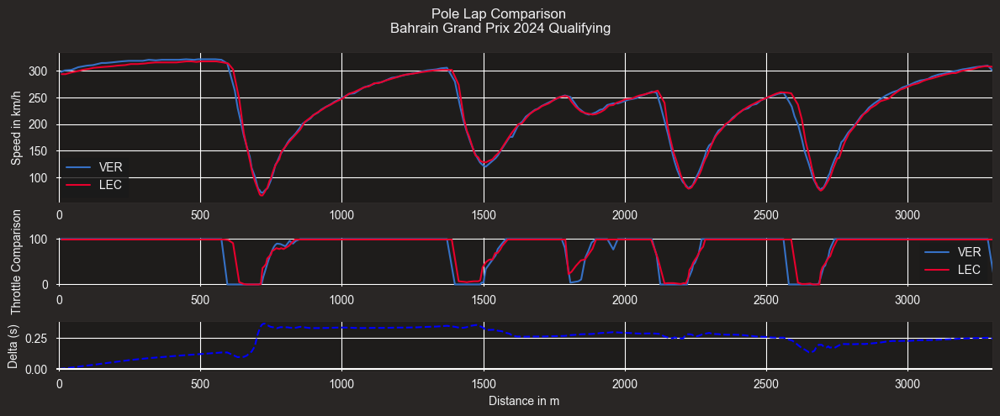

core           INFO 	Loading data for Saudi Arabian Grand Prix - Qualifying [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
Request for URL https://ergast.com/api/f1/2024/2/qualifying.json failed; using cached response
Traceback (most recent call last):
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 286, in _resend
    response = self._send_and_cache(request, actions, cached_response, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 254, in _send_and_cache
    response = super().send(request, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\req.py", line 134, in send
    lim.limit()
  File "c:\Users\Admin\De

Processing Saudi Arabian Grand Prix (Round 2)


req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['1', '16', '11', '14', '81', '4', '63', '44', '22', '18', '38', '23', '20', '3', '27', '77', '31', '10', '2', '24']
c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\utils.py:89: FutureWarning:

`utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.



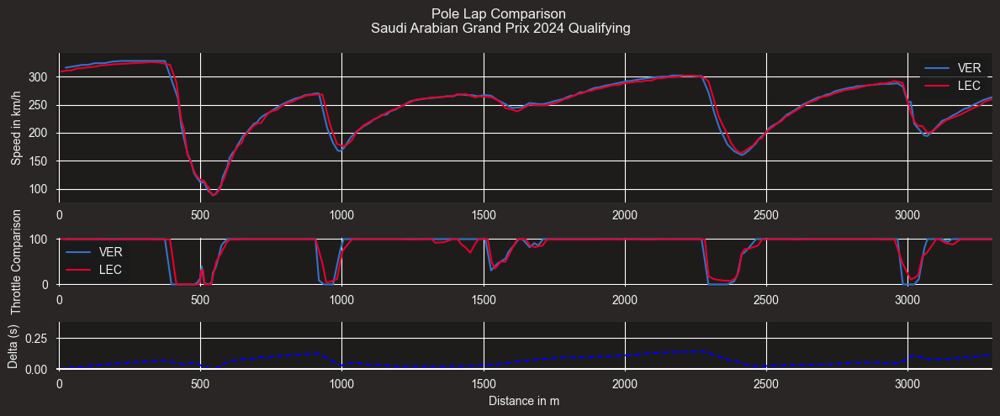

core           INFO 	Loading data for Australian Grand Prix - Qualifying [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
Request for URL https://ergast.com/api/f1/2024/3/qualifying.json failed; using cached response
Traceback (most recent call last):
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 286, in _resend
    response = self._send_and_cache(request, actions, cached_response, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 254, in _send_and_cache
    response = super().send(request, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\req.py", line 134, in send
    lim.limit()
  File "c:\Users\Admin\Deskt

Processing Australian Grand Prix (Round 3)


req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 19 drivers: ['1', '55', '11', '4', '16', '81', '63', '22', '18', '14', '44', '23', '77', '20', '31', '27', '10', '3', '24']
c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\utils.py:89: FutureWarning:

`utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.



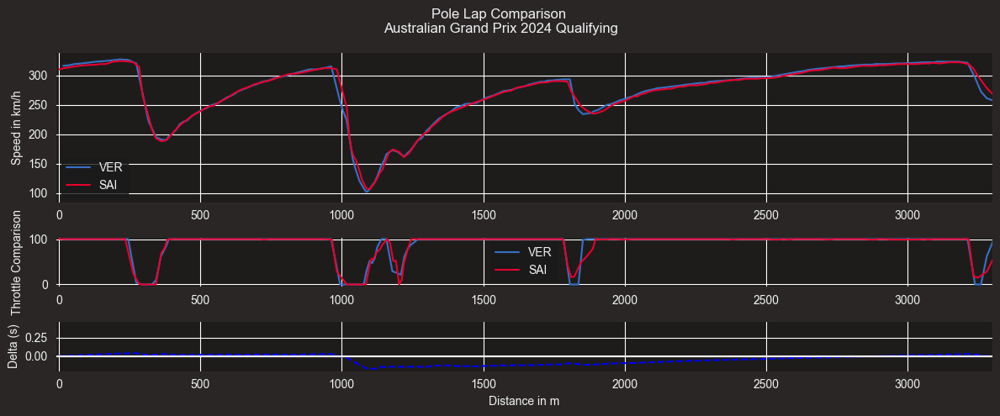

core           INFO 	Loading data for Japanese Grand Prix - Qualifying [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
Request for URL https://ergast.com/api/f1/2024/4/qualifying.json failed; using cached response
Traceback (most recent call last):
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 286, in _resend
    response = self._send_and_cache(request, actions, cached_response, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 254, in _send_and_cache
    response = super().send(request, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\req.py", line 134, in send
    lim.limit()
  File "c:\Users\Admin\Desktop

Processing Japanese Grand Prix (Round 4)


req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['1', '11', '4', '55', '14', '81', '44', '16', '63', '22', '3', '27', '77', '23', '31', '18', '10', '20', '2', '24']
c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\utils.py:89: FutureWarning:

`utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.



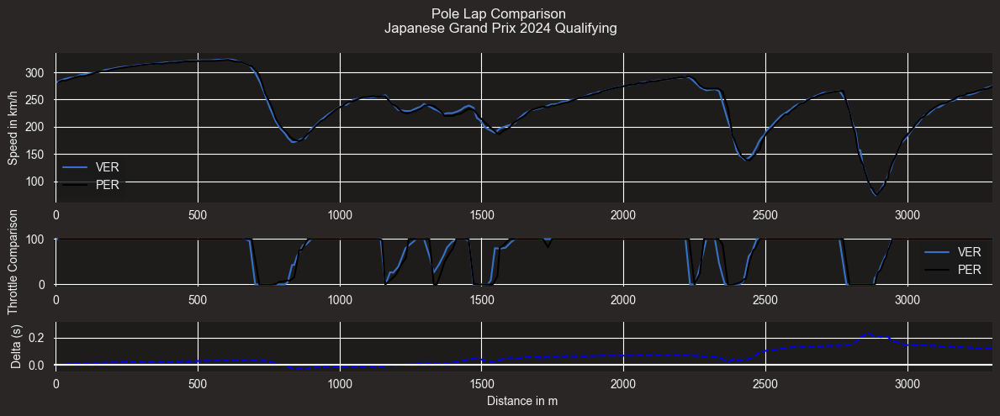

core           INFO 	Loading data for Chinese Grand Prix - Qualifying [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
Request for URL https://ergast.com/api/f1/2024/5/qualifying.json failed; using cached response
Traceback (most recent call last):
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 286, in _resend
    response = self._send_and_cache(request, actions, cached_response, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 254, in _send_and_cache
    response = super().send(request, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\req.py", line 134, in send
    lim.limit()
  File "c:\Users\Admin\Desktop\

Processing Chinese Grand Prix (Round 5)


req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['1', '11', '14', '4', '81', '16', '55', '63', '27', '77', '18', '3', '31', '23', '10', '24', '20', '44', '22', '2']
c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\utils.py:89: FutureWarning:

`utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.



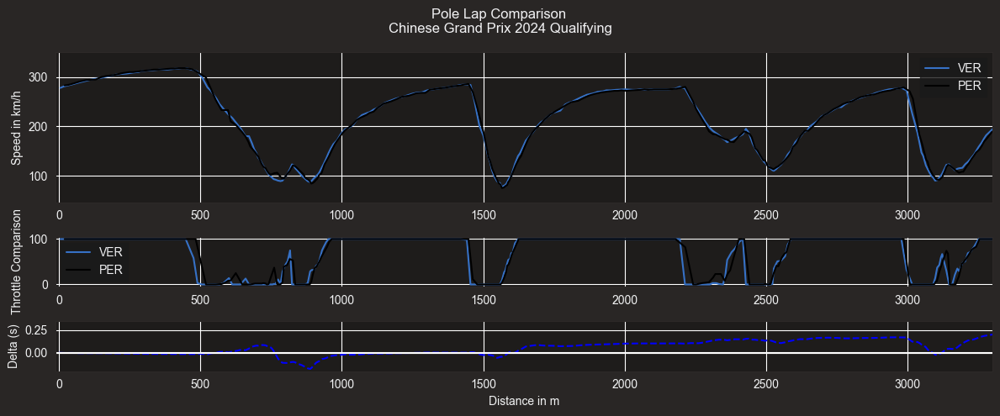

core           INFO 	Loading data for Miami Grand Prix - Qualifying [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
Request for URL https://ergast.com/api/f1/2024/6/qualifying.json failed; using cached response
Traceback (most recent call last):
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 286, in _resend
    response = self._send_and_cache(request, actions, cached_response, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 254, in _send_and_cache
    response = super().send(request, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\req.py", line 134, in send
    lim.limit()
  File "c:\Users\Admin\Desktop\F1

Processing Miami Grand Prix (Round 6)


req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['1', '16', '55', '11', '4', '81', '63', '44', '27', '22', '18', '10', '31', '23', '14', '77', '2', '3', '20', '24']
c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\utils.py:89: FutureWarning:

`utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.



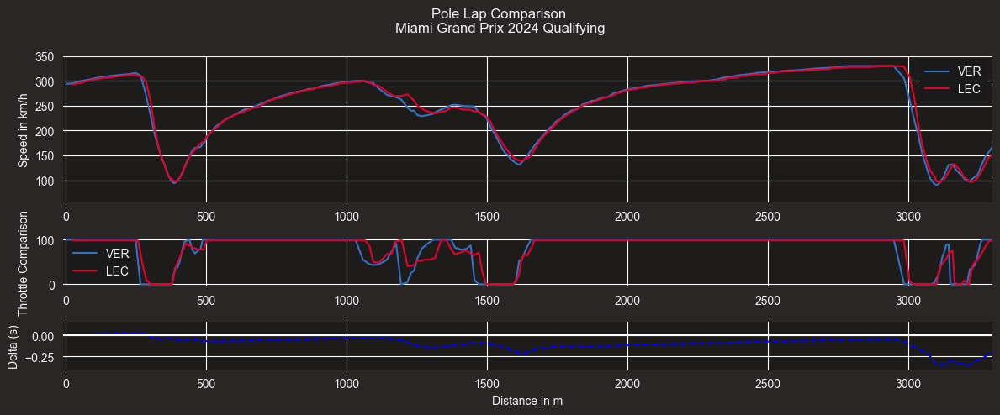

core           INFO 	Loading data for Emilia Romagna Grand Prix - Qualifying [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
Request for URL https://ergast.com/api/f1/2024/7/qualifying.json failed; using cached response
Traceback (most recent call last):
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 286, in _resend
    response = self._send_and_cache(request, actions, cached_response, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 254, in _send_and_cache
    response = super().send(request, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\req.py", line 134, in send
    lim.limit()
  File "c:\Users\Admin\D

Processing Emilia Romagna Grand Prix (Round 7)


core        WARNING 	Driver  2: Lap timing integrity check failed for 1 lap(s)
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['1', '81', '4', '16', '55', '63', '22', '44', '3', '27', '11', '31', '18', '23', '10', '77', '24', '20', '14', '2']
c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\utils.py:89: FutureWarning:

`utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.



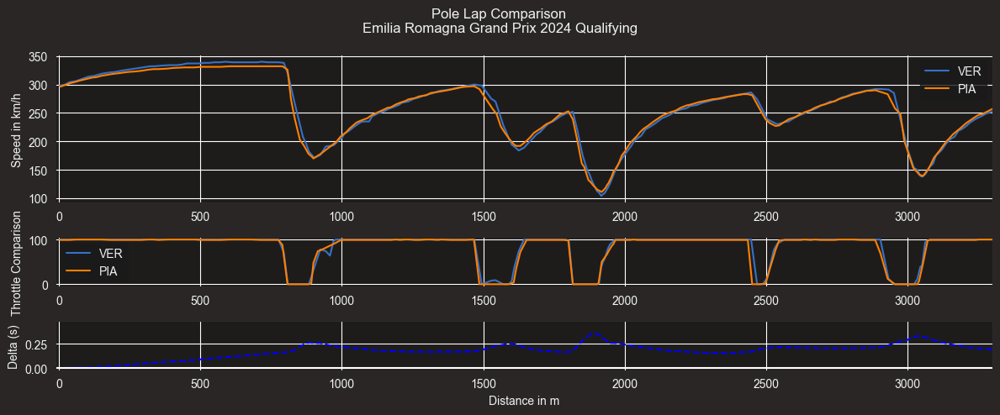

core           INFO 	Loading data for Monaco Grand Prix - Qualifying [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
Request for URL https://ergast.com/api/f1/2024/8/qualifying.json failed; using cached response
Traceback (most recent call last):
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 286, in _resend
    response = self._send_and_cache(request, actions, cached_response, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 254, in _send_and_cache
    response = super().send(request, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\req.py", line 134, in send
    lim.limit()
  File "c:\Users\Admin\Desktop\F

Processing Monaco Grand Prix (Round 8)


core        WARNING 	Driver  3: Lap timing integrity check failed for 1 lap(s)
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['16', '81', '55', '4', '63', '1', '44', '22', '23', '10', '31', '27', '3', '18', '20', '14', '2', '11', '77', '24']
c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\utils.py:89: FutureWarning:

`utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.



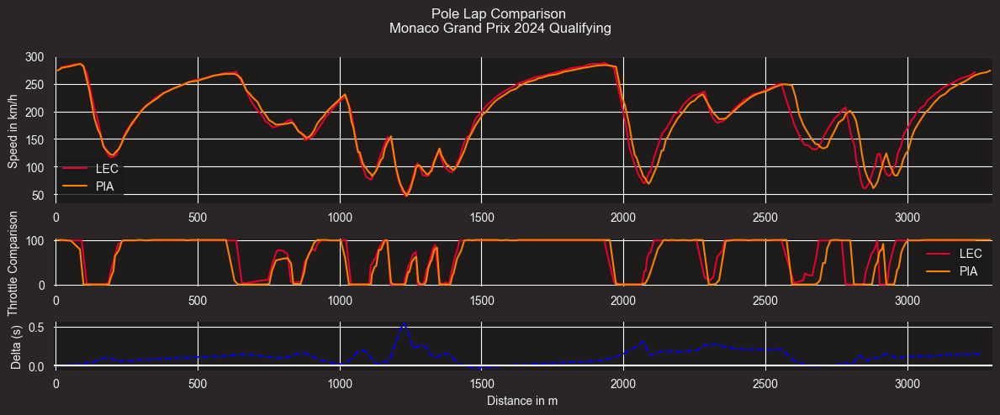

Processing Canadian Grand Prix (Round 9)


core           INFO 	Loading data for Canadian Grand Prix - Qualifying [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
Request for URL https://ergast.com/api/f1/2024/9/qualifying.json failed; using cached response
Traceback (most recent call last):
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 286, in _resend
    response = self._send_and_cache(request, actions, cached_response, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 254, in _send_and_cache
    response = super().send(request, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\req.py", line 134, in send
    lim.limit()
  File "c:\Users\Admin\Desktop

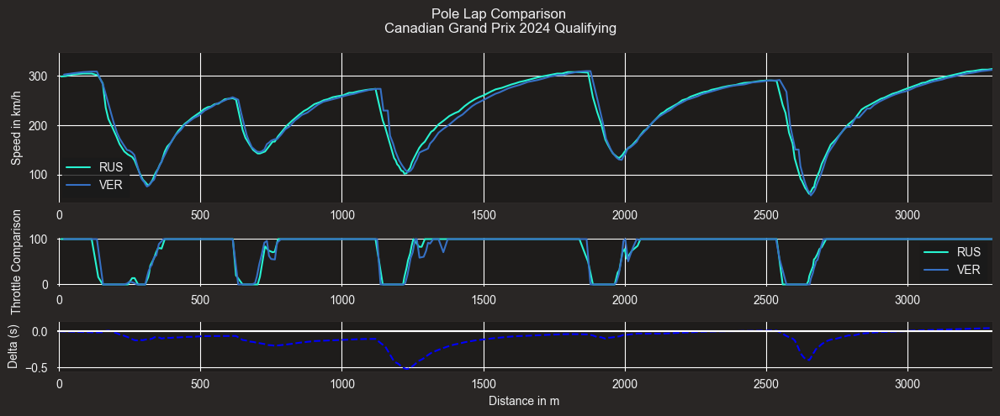

core           INFO 	Loading data for Spanish Grand Prix - Qualifying [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
Request for URL https://ergast.com/api/f1/2024/10/qualifying.json failed; using cached response
Traceback (most recent call last):
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 286, in _resend
    response = self._send_and_cache(request, actions, cached_response, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 254, in _send_and_cache
    response = super().send(request, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\req.py", line 134, in send
    lim.limit()
  File "c:\Users\Admin\Desktop

Processing Spanish Grand Prix (Round 10)


req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['4', '1', '44', '63', '16', '55', '10', '11', '31', '81', '14', '77', '27', '18', '24', '20', '22', '3', '23', '2']
c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\utils.py:89: Future

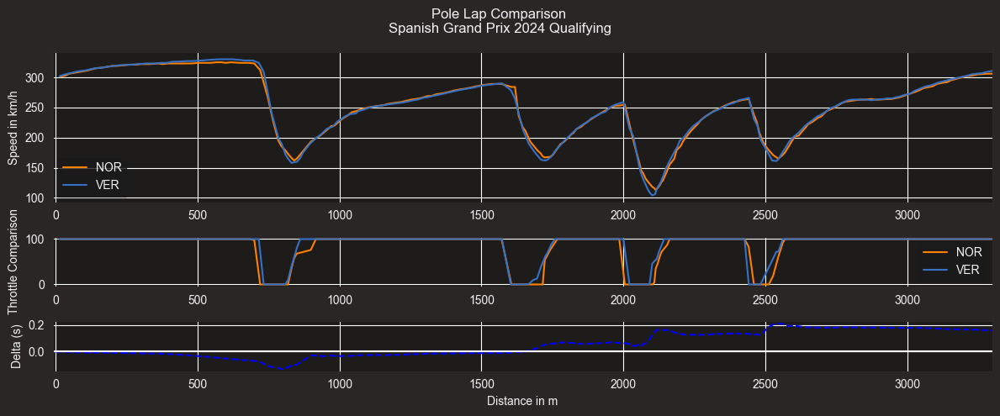

core           INFO 	Loading data for Austrian Grand Prix - Qualifying [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
Request for URL https://ergast.com/api/f1/2024/11/qualifying.json failed; using cached response
Traceback (most recent call last):
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 286, in _resend
    response = self._send_and_cache(request, actions, cached_response, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 254, in _send_and_cache
    response = super().send(request, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\req.py", line 134, in send
    lim.limit()
  File "c:\Users\Admin\Deskto

Processing Austrian Grand Prix (Round 11)


req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['1', '4', '63', '55', '44', '16', '81', '11', '27', '31', '3', '20', '10', '22', '14', '23', '18', '77', '2', '24']
c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\utils.py:89: FutureWarning:

`utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa ten

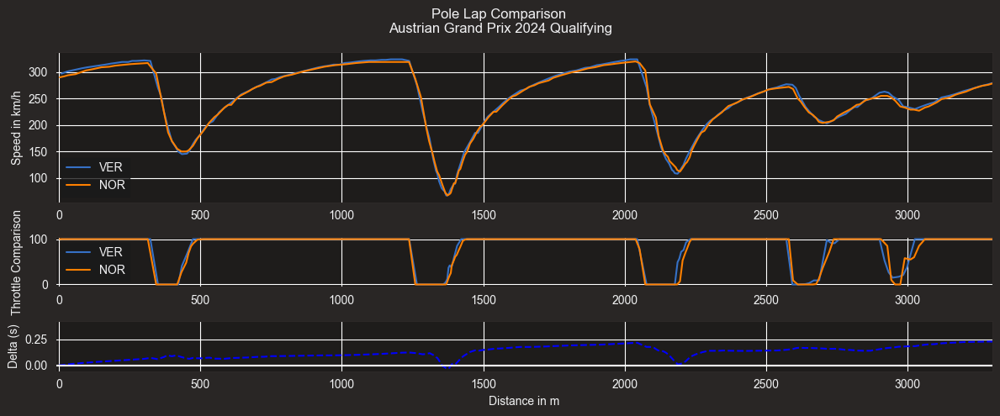

Processing British Grand Prix (Round 12)


core           INFO 	Loading data for British Grand Prix - Qualifying [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
Request for URL https://ergast.com/api/f1/2024/12/qualifying.json failed; using cached response
Traceback (most recent call last):
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 286, in _resend
    response = self._send_and_cache(request, actions, cached_response, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 254, in _send_and_cache
    response = super().send(request, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\req.py", line 134, in send
    lim.limit()
  File "c:\Users\Admin\Desktop

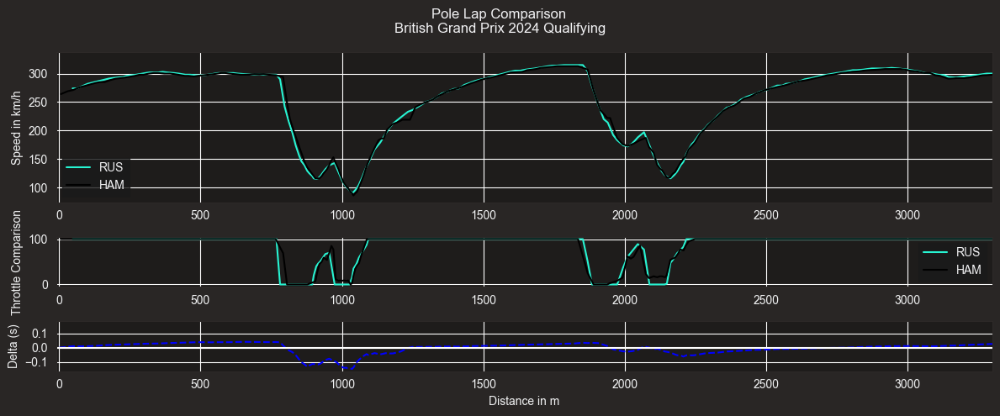

core           INFO 	Loading data for Hungarian Grand Prix - Qualifying [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
Request for URL https://ergast.com/api/f1/2024/13/qualifying.json failed; using cached response
Traceback (most recent call last):
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 286, in _resend
    response = self._send_and_cache(request, actions, cached_response, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 254, in _send_and_cache
    response = super().send(request, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\req.py", line 134, in send
    lim.limit()
  File "c:\Users\Admin\Deskt

Processing Hungarian Grand Prix (Round 13)


req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['4', '81', '1', '55', '44', '16', '14', '18', '3', '22', '27', '77', '23', '2', '20', '11', '63', '24', '31', '10']
c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\utils.py:89: FutureWarning:

`utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.



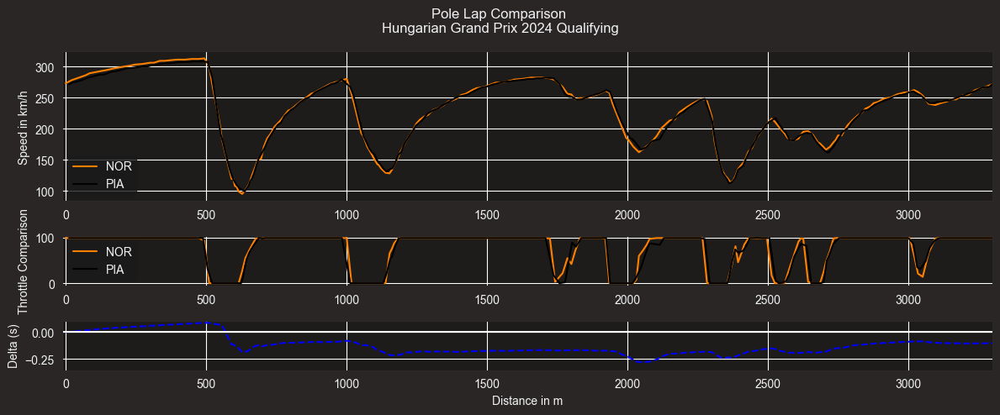

Processing Belgian Grand Prix (Round 14)


core           INFO 	Loading data for Belgian Grand Prix - Qualifying [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
Request for URL https://ergast.com/api/f1/2024/14/qualifying.json failed; using cached response
Traceback (most recent call last):
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 286, in _resend
    response = self._send_and_cache(request, actions, cached_response, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 254, in _send_and_cache
    response = super().send(request, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\req.py", line 134, in send
    lim.limit()
  File "c:\Users\Admin\Desktop

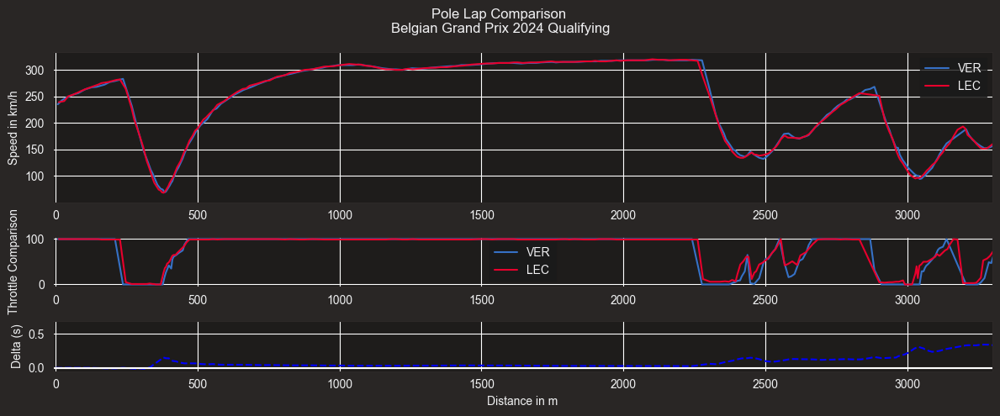

core           INFO 	Loading data for Dutch Grand Prix - Qualifying [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
Request for URL https://ergast.com/api/f1/2024/15/qualifying.json failed; using cached response
Traceback (most recent call last):
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 286, in _resend
    response = self._send_and_cache(request, actions, cached_response, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 254, in _send_and_cache
    response = super().send(request, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\req.py", line 134, in send
    lim.limit()
  File "c:\Users\Admin\Desktop\F

Processing Dutch Grand Prix (Round 15)


req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
core        WARNING 	No lap data for driver 2
core        WARNING 	Failed to perform lap accuracy check - all laps marked as inaccurate (driver 2)
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['4', '1', '81', '63', '11', '16', '14', '18', '10', '55', '44', '22', '27', '20', '3', '31', '77', '24', '23', '2']
c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be remove

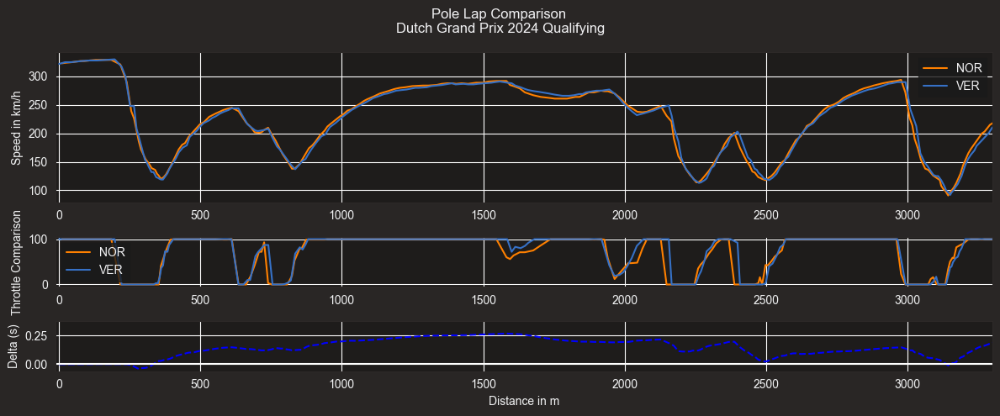

core           INFO 	Loading data for Italian Grand Prix - Qualifying [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
Request for URL https://ergast.com/api/f1/2024/16/qualifying.json failed; using cached response
Traceback (most recent call last):
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 286, in _resend
    response = self._send_and_cache(request, actions, cached_response, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 254, in _send_and_cache
    response = super().send(request, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\req.py", line 134, in send
    lim.limit()
  File "c:\Users\Admin\Desktop

Processing Italian Grand Prix (Round 16)


req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['4', '81', '63', '16', '55', '44', '1', '11', '23', '27', '14', '3', '20', '10', '31', '22', '18', '43', '77', '24']
c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\utils.py:89: Futur

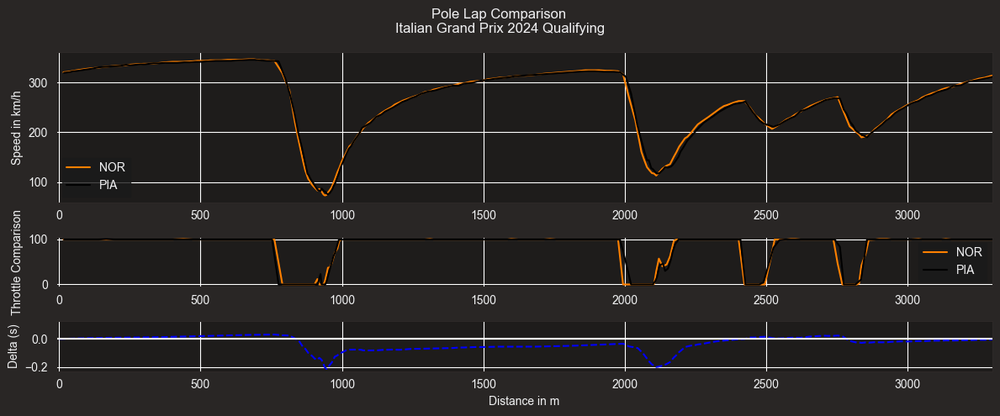

Processing Azerbaijan Grand Prix (Round 17)


core           INFO 	Loading data for Azerbaijan Grand Prix - Qualifying [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
Request for URL https://ergast.com/api/f1/2024/17/qualifying.json failed; using cached response
Traceback (most recent call last):
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 286, in _resend
    response = self._send_and_cache(request, actions, cached_response, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 254, in _send_and_cache
    response = super().send(request, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\req.py", line 134, in send
    lim.limit()
  File "c:\Users\Admin\Desk

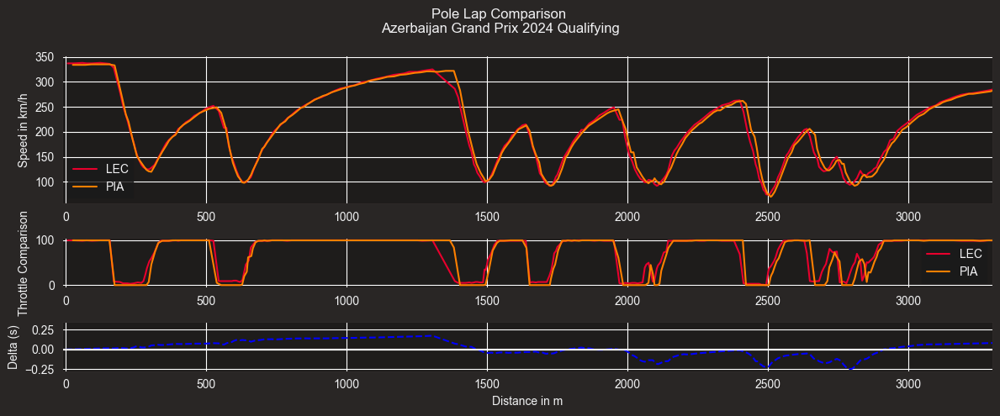

Processing Singapore Grand Prix (Round 18)


core           INFO 	Loading data for Singapore Grand Prix - Qualifying [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
Request for URL https://ergast.com/api/f1/2024/18/qualifying.json failed; using cached response
Traceback (most recent call last):
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 286, in _resend
    response = self._send_and_cache(request, actions, cached_response, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 254, in _send_and_cache
    response = super().send(request, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\req.py", line 134, in send
    lim.limit()
  File "c:\Users\Admin\Deskt

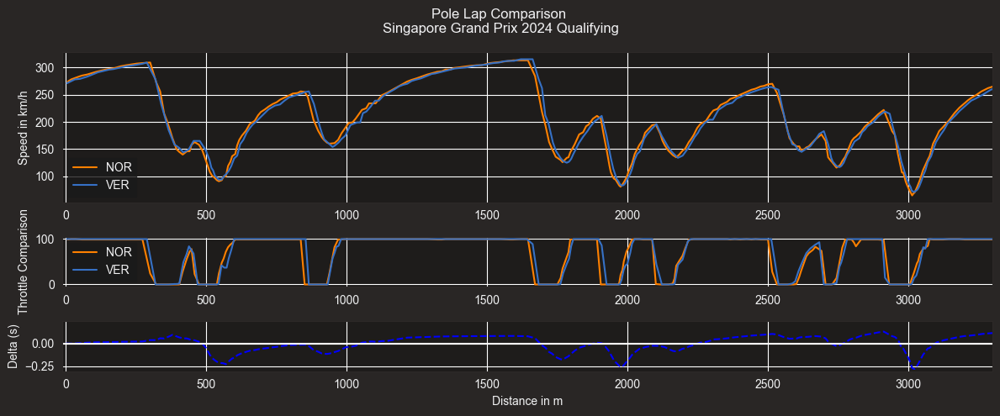

Processing United States Grand Prix (Round 19)


core           INFO 	Loading data for United States Grand Prix - Qualifying [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
Request for URL https://ergast.com/api/f1/2024/19/qualifying.json failed; using cached response
Traceback (most recent call last):
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 286, in _resend
    response = self._send_and_cache(request, actions, cached_response, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 254, in _send_and_cache
    response = super().send(request, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\req.py", line 134, in send
    lim.limit()
  File "c:\Users\Admin\D

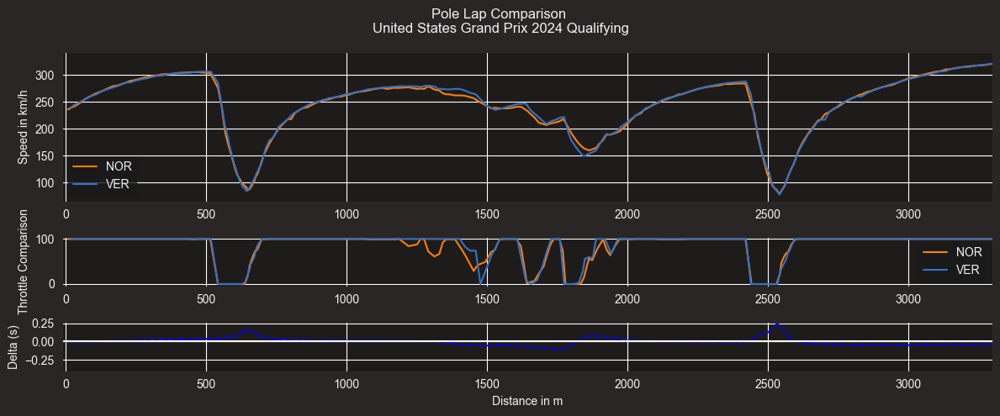

core           INFO 	Loading data for Mexico City Grand Prix - Qualifying [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
Request for URL https://ergast.com/api/f1/2024/20/qualifying.json failed; using cached response
Traceback (most recent call last):
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 286, in _resend
    response = self._send_and_cache(request, actions, cached_response, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 254, in _send_and_cache
    response = super().send(request, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\req.py", line 134, in send
    lim.limit()
  File "c:\Users\Admin\Des

Processing Mexico City Grand Prix (Round 20)


req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['55', '1', '4', '16', '63', '44', '20', '10', '23', '27', '22', '30', '14', '18', '77', '43', '81', '11', '31', '24']
c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\utils.py:89: Futu

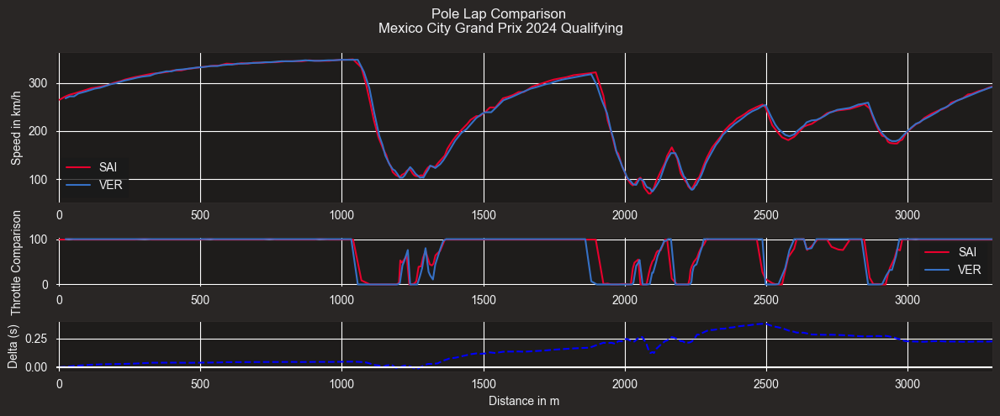

core           INFO 	Loading data for São Paulo Grand Prix - Qualifying [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
Request for URL https://ergast.com/api/f1/2024/21/qualifying.json failed; using cached response
Traceback (most recent call last):
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 286, in _resend
    response = self._send_and_cache(request, actions, cached_response, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 254, in _send_and_cache
    response = super().send(request, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\req.py", line 134, in send
    lim.limit()
  File "c:\Users\Admin\Deskt

Processing São Paulo Grand Prix (Round 21)


req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['4', '63', '22', '31', '30', '16', '23', '81', '14', '18', '77', '1', '11', '55', '10', '44', '50', '43', '27', '24']
c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\utils.py:89: FutureWarning:

`utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.



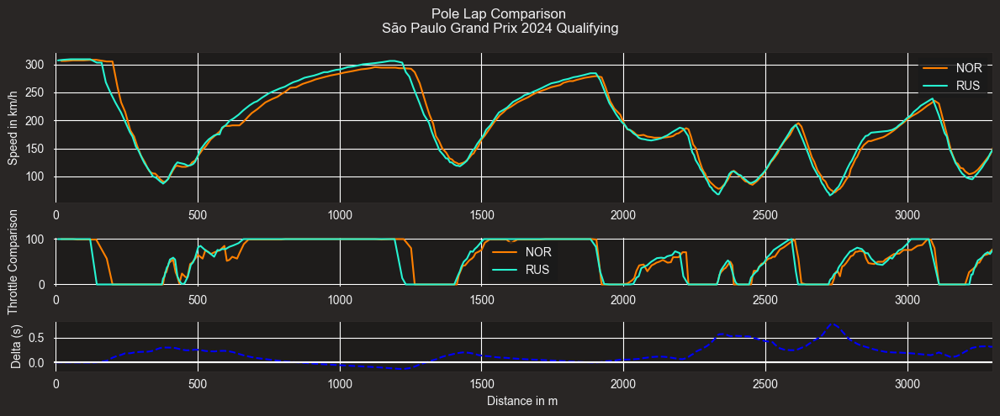

core           INFO 	Loading data for Las Vegas Grand Prix - Qualifying [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
Request for URL https://ergast.com/api/f1/2024/22/qualifying.json failed; using cached response
Traceback (most recent call last):
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 286, in _resend
    response = self._send_and_cache(request, actions, cached_response, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 254, in _send_and_cache
    response = super().send(request, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\req.py", line 134, in send
    lim.limit()
  File "c:\Users\Admin\Deskt

Processing Las Vegas Grand Prix (Round 22)


req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['63', '55', '10', '16', '1', '4', '22', '81', '27', '44', '31', '20', '24', '43', '30', '11', '14', '23', '77', '18']
c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\utils.py:89: FutureWarning:

`utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.



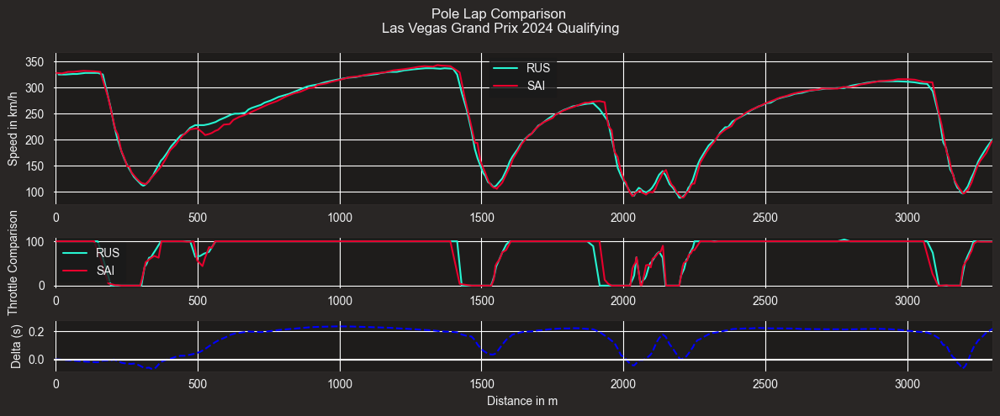

core           INFO 	Loading data for Qatar Grand Prix - Qualifying [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
Request for URL https://ergast.com/api/f1/2024/23/qualifying.json failed; using cached response
Traceback (most recent call last):
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 286, in _resend
    response = self._send_and_cache(request, actions, cached_response, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 254, in _send_and_cache
    response = super().send(request, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\req.py", line 134, in send
    lim.limit()
  File "c:\Users\Admin\Desktop\F

Processing Qatar Grand Prix (Round 23)


req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['1', '63', '4', '81', '16', '44', '55', '14', '11', '20', '10', '24', '77', '22', '18', '23', '30', '27', '43', '31']
c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\utils.py:89: FutureWarning:

`utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.



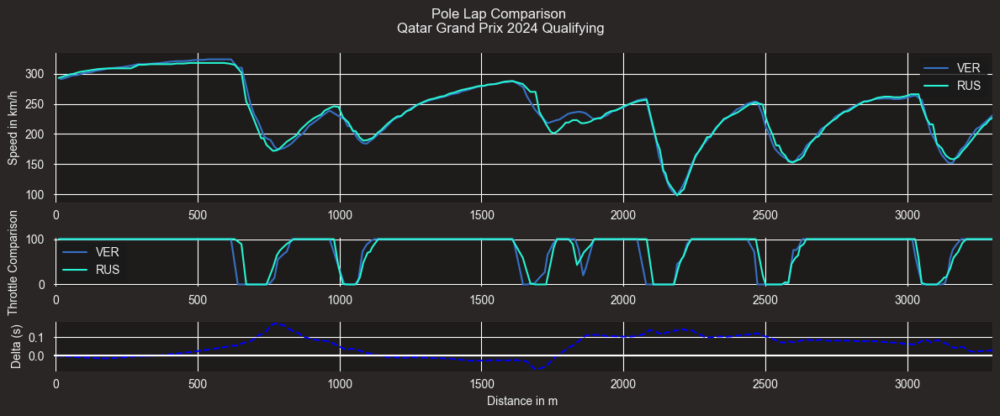

core           INFO 	Loading data for Abu Dhabi Grand Prix - Qualifying [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
Request for URL https://ergast.com/api/f1/2024/24/qualifying.json failed; using cached response
Traceback (most recent call last):
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 286, in _resend
    response = self._send_and_cache(request, actions, cached_response, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\requests_cache\session.py", line 254, in _send_and_cache
    response = super().send(request, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\req.py", line 134, in send
    lim.limit()
  File "c:\Users\Admin\Deskt

Processing Abu Dhabi Grand Prix (Round 24)


req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['4', '81', '55', '27', '1', '10', '63', '14', '77', '11', '22', '30', '18', '16', '20', '23', '24', '44', '43', '61']
c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\utils.py:89: FutureWarning:

`utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.



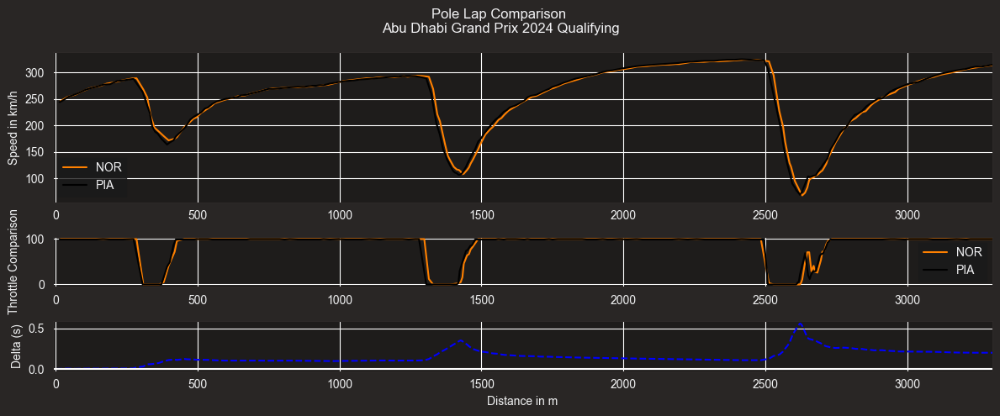

In [66]:
import fastf1
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

fastf1.Cache.enable_cache('cache')  # Ensure caching is disabled if needed

# Custom team colors
team_colors = {
    'Red Bull Racing': '#3671C6',
    'Ferrari': '#E8002D',
    'Mercedes': '#27F4D2',
    'McLaren': '#FF8000',
    'Aston Martin': '#229971',
    'Alpine': '#FF87BC',
    'Kick Sauber': '#52E252',
    'Haas F1 Team': '#B6BABD',
    'RB': '#6692FF',
    'Williams': '#64C4FF'
}

# Load 2024 schedule
schedule = fastf1.get_event_schedule(2024)

# Loop through each round
for round_number in schedule['RoundNumber']:
    try:
        event_name = schedule.loc[schedule['RoundNumber'] == round_number, 'EventName'].values[0]
        print(f"Processing {event_name} (Round {round_number})")

        # Fetch session data
        session_q = fastf1.get_session(2024, round_number, 'Q')
        session_q.load()

        # Validate session data
        if session_q.results is None or session_q.laps is None:
            print(f"Skipping {event_name} (Round {round_number}) due to missing data.")
            continue

        results = session_q.results

        # Get top 2 drivers based on Q3 time
        top_2_drivers = results.nsmallest(2, 'Position')[['Abbreviation', 'Q3']].dropna().values.tolist()
        if len(top_2_drivers) < 2:
            print(f"Not enough data found for {event_name} (Round {round_number}). Skipping...")
            continue

        driver1, driver1_q3_time = top_2_drivers[0]
        driver2, driver2_q3_time = top_2_drivers[1]

        # Get team names for the drivers
        driver1_team = results.loc[results['Abbreviation'] == driver1, 'TeamName'].values[0]
        driver2_team = results.loc[results['Abbreviation'] == driver2, 'TeamName'].values[0]

        # Get team colors
        driver1_color = team_colors.get(driver1_team, 'black')
        driver2_color = 'black' if driver1_team == driver2_team else team_colors.get(driver2_team, 'black')

        # Get the fastest lap for each driver
        driver1_lap = session_q.laps.pick_driver(driver1)[session_q.laps.pick_driver(driver1)['LapTime'] == driver1_q3_time].iloc[0]
        driver2_lap = session_q.laps.pick_driver(driver2)[session_q.laps.pick_driver(driver2)['LapTime'] == driver2_q3_time].iloc[0]

        # Get telemetry data
        driver1_tel = driver1_lap.get_car_data().add_distance()
        driver2_tel = driver2_lap.get_car_data().add_distance()

        # Create a subplot with 3 plots
        fig, ax = plt.subplots(3, 1, gridspec_kw={'height_ratios': [3, 1, 1]}, figsize=(12, 5))
        plt.suptitle(f"Pole Lap Comparison \n{event_name} {session_q.event.year} Qualifying")

        # Plot 1: Speed comparison
        ax[0].plot(driver1_tel['Distance'], driver1_tel['Speed'], color=driver1_color, label=driver1)
        ax[0].plot(driver2_tel['Distance'], driver2_tel['Speed'], color=driver2_color, label=driver2)
        ax[0].set_ylabel('Speed in km/h')
        ax[0].legend()

        # Plot 2: Throttle comparison
        ax[1].plot(driver1_tel['Distance'], driver1_tel['Throttle'], color=driver1_color, label=driver1)
        ax[1].plot(driver2_tel['Distance'], driver2_tel['Throttle'], color=driver2_color, label=driver2)
        ax[1].set_ylabel('Throttle Comparison')
        ax[1].legend()

        # Get delta time between drivers
        delta_time, ref_tel, compare_tel = fastf1.utils.delta_time(driver1_lap, driver2_lap)

        # Plot 3: Delta time comparison
        ax[2].plot(ref_tel['Distance'], delta_time, 'b--')
        ax[2].axhline(0, color='white')
        ax[2].set_ylabel('Delta (s)')

        # Set figure layout
        ax[2].set_xlabel('Distance in m')
        ax[0].set_xlim([-10.5, 3300])
        ax[1].set_xlim([-10.5, 3300])
        ax[2].set_xlim([-10.5, 3300])
        plt.tight_layout()

        # Show the plots
        plt.show()

    except Exception as e:
        print(f"Error processing {event_name} (Round {round_number}): {e}")


# Sector Wise Comparisions for Pole Lap in each round

logger      WARNING 	Failed to load schedule from FastF1 backend!


Processing Pre-Season Testing (Round 0)


req            INFO 	Using cached data for season_schedule


Error processing Pre-Season Testing (Round 0): Cannot get testing event by round number!
Processing Bahrain Grand Prix (Round 1)


core           INFO 	Loading data for Bahrain Grand Prix - Qualifying [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['1', '16', '63', '55', '11', '14', '4', '81', '44', '27', '22', '18', '23', '3', '20', '77', '24', '2', '31', '10']
c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

p

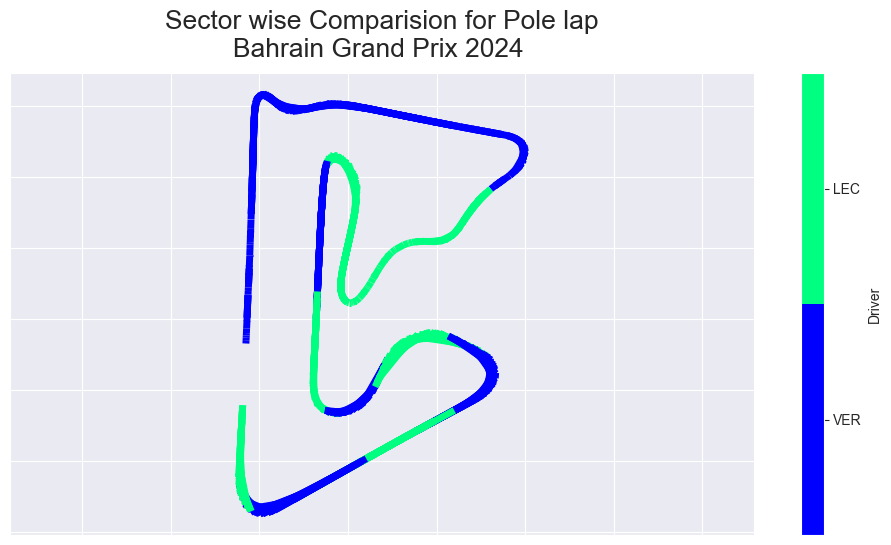

core           INFO 	Loading data for Saudi Arabian Grand Prix - Qualifying [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info


Processing Saudi Arabian Grand Prix (Round 2)


req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['1', '16', '11', '14', '81', '4', '63', '44', '22', '18', '38', '23', '20', '3', '27', '77', '31', '10', '2', '24']
c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: Futur

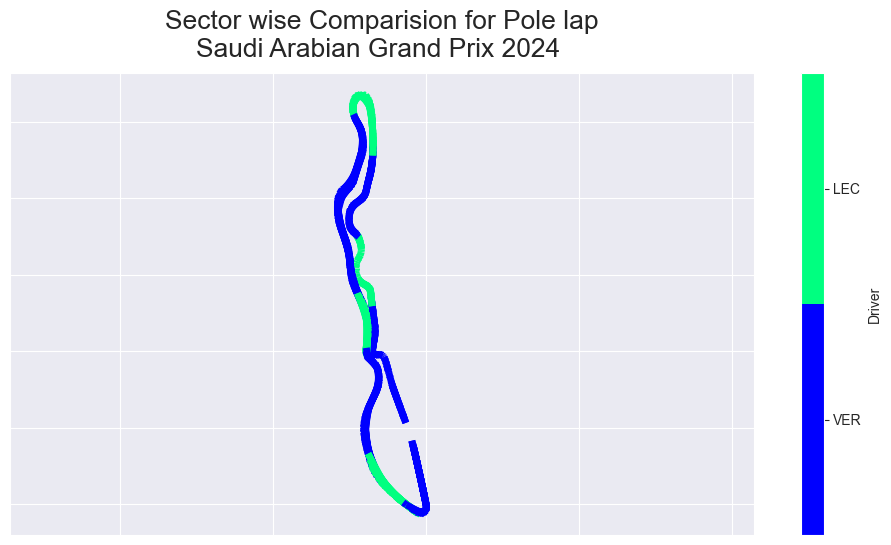

core           INFO 	Loading data for Australian Grand Prix - Qualifying [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info


Processing Australian Grand Prix (Round 3)


req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 19 drivers: ['1', '55', '11', '4', '16', '81', '63', '22', '18', '14', '44', '23', '77', '20', '31', '27', '10', '3', '24']
c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarn

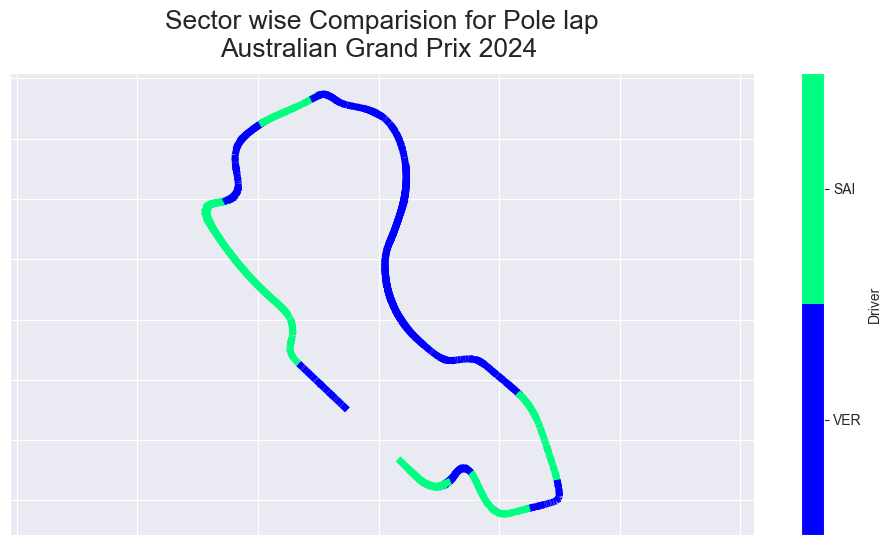

core           INFO 	Loading data for Japanese Grand Prix - Qualifying [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info


Processing Japanese Grand Prix (Round 4)


req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['1', '11', '4', '55', '14', '81', '44', '16', '63', '22', '3', '27', '77', '23', '31', '18', '10', '20', '2', '24']
c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: Futur

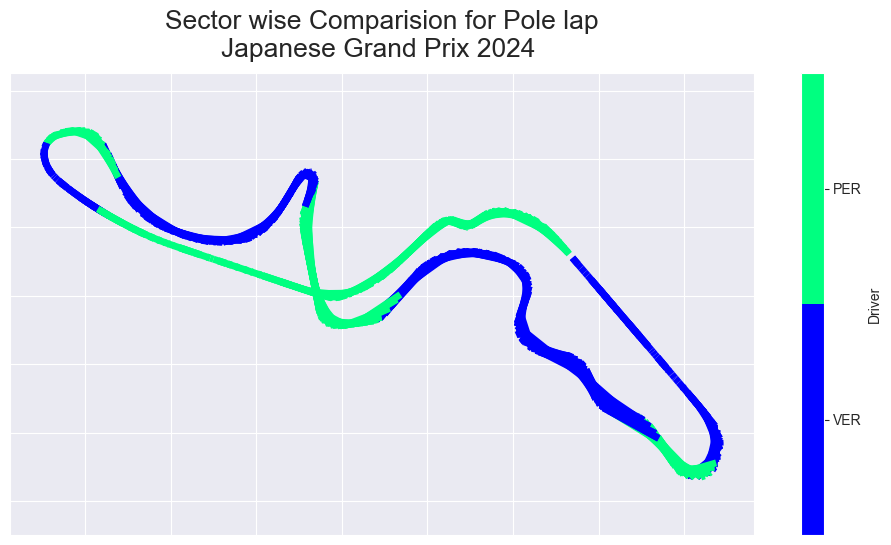

core           INFO 	Loading data for Chinese Grand Prix - Qualifying [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info


Processing Chinese Grand Prix (Round 5)


req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['1', '11', '14', '4', '81', '16', '55', '63', '27', '77', '18', '3', '31', '23', '10', '24', '20', '44', '22', '2']
c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: Futur

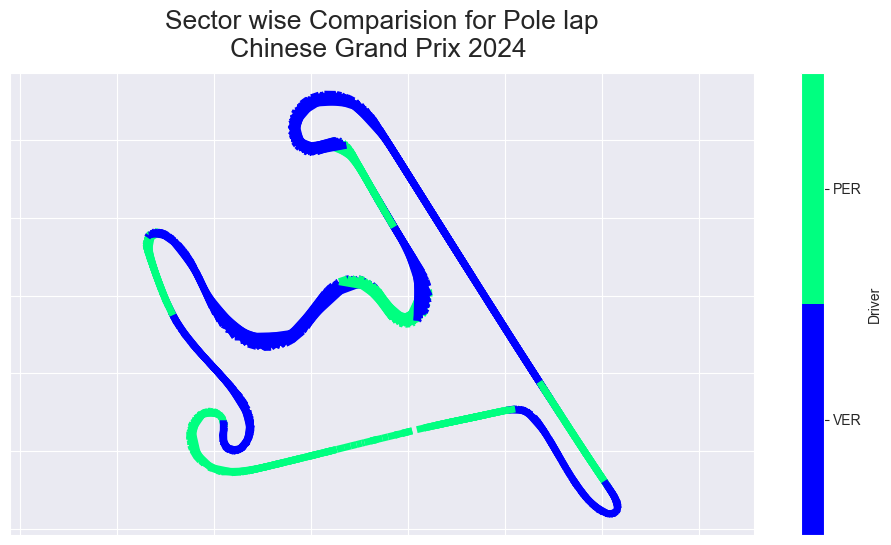

core           INFO 	Loading data for Miami Grand Prix - Qualifying [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info


Processing Miami Grand Prix (Round 6)


req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['1', '16', '55', '11', '4', '81', '63', '44', '27', '22', '18', '10', '31', '23', '14', '77', '2', '3', '20', '24']
c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: Futur

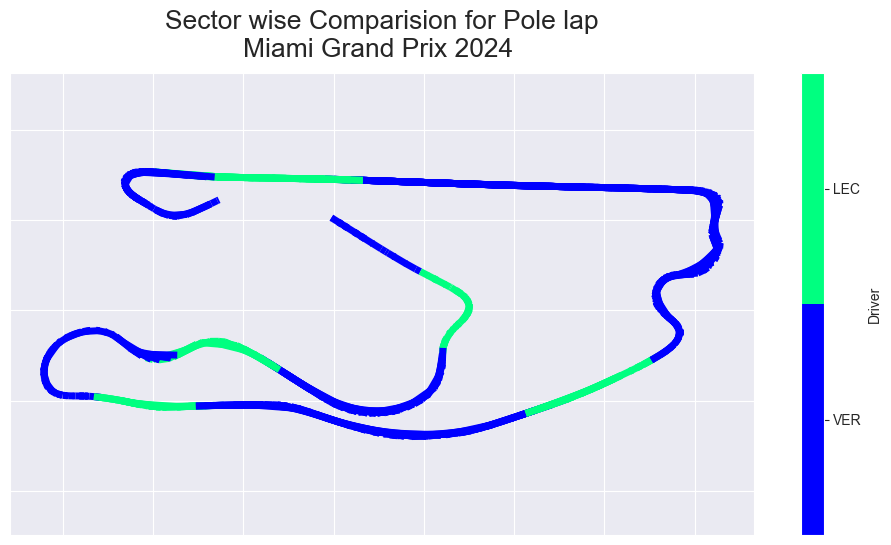

core           INFO 	Loading data for Emilia Romagna Grand Prix - Qualifying [v3.4.4]


Processing Emilia Romagna Grand Prix (Round 7)


req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
core        WARNING 	Driver  2: Lap timing integrity check failed for 1 lap(s)
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['1', '81', '4', '16', '55', '63', '22', '44', '3', '27', '11', '31', '18', '23', '10', '77', '24', '20', '14', '2']
c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

p

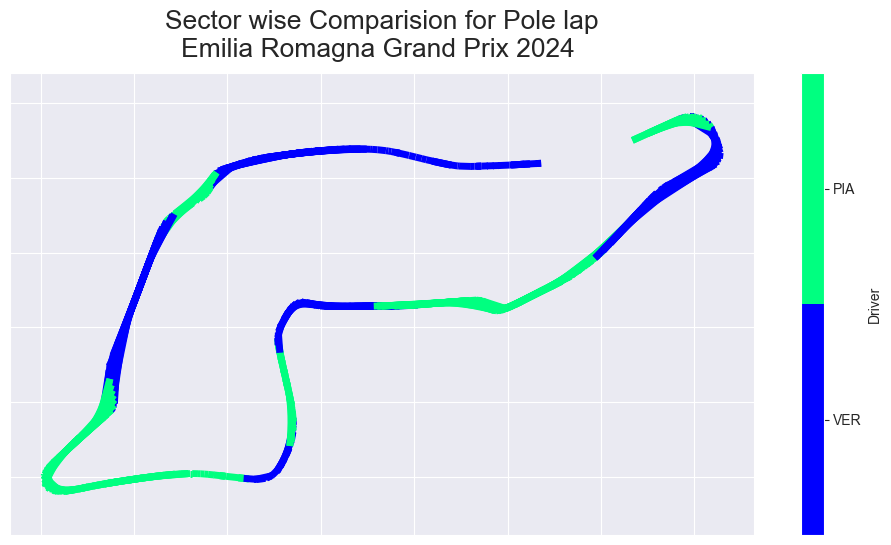

core           INFO 	Loading data for Monaco Grand Prix - Qualifying [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
Request for URL https://ergast.com/api/f1/2024/8/qualifying.json failed; using cached response
Traceback (most recent call last):
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\urllib3\connectionpool.py", line 787, in urlopen
    response = self._make_request(
               ^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\urllib3\connectionpool.py", line 534, in _make_request
    response = conn.getresponse()
               ^^^^^^^^^^^^^^^^^^
  File "c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\urllib3\connection.py", line 516, in getresponse
    httplib_response = super().getresponse()
                       ^^^^^^^^^^^^^^^^^^^^^
  File "C:\Program Files\Python312\Lib\http\client.py", line 14

Processing Monaco Grand Prix (Round 8)


req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
core        WARNING 	Driver  3: Lap timing integrity check failed for 1 lap(s)
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['16', '81', '55', '4', '63', '1', '44', '22', '23', '10', '31', '27', '3', '18', '20', '14', '2', '11', '77', '24']
c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Des

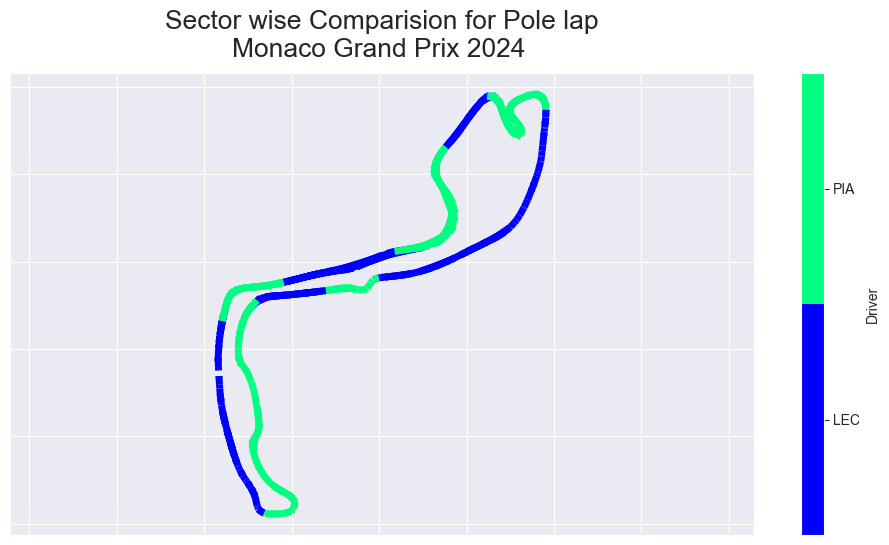

core           INFO 	Loading data for Canadian Grand Prix - Qualifying [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info


Processing Canadian Grand Prix (Round 9)


req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['63', '1', '4', '81', '3', '14', '44', '22', '18', '23', '16', '55', '2', '20', '10', '11', '77', '31', '27', '24']
c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: Futur

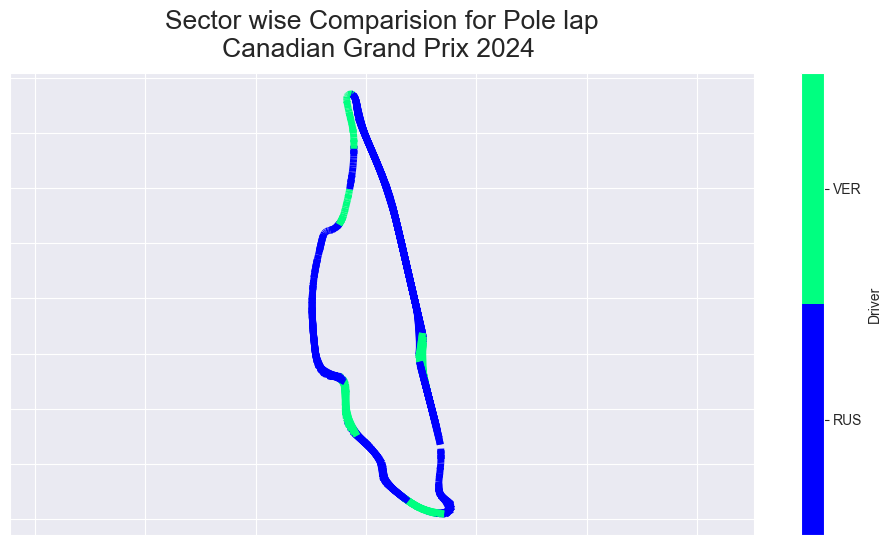

core           INFO 	Loading data for Spanish Grand Prix - Qualifying [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info


Processing Spanish Grand Prix (Round 10)


req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['4', '1', '44', '63', '16', '55', '10', '11', '31', '81', '14', '77', '27', '18', '24', '20', '22', '3', '23', '2']
c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: Futur

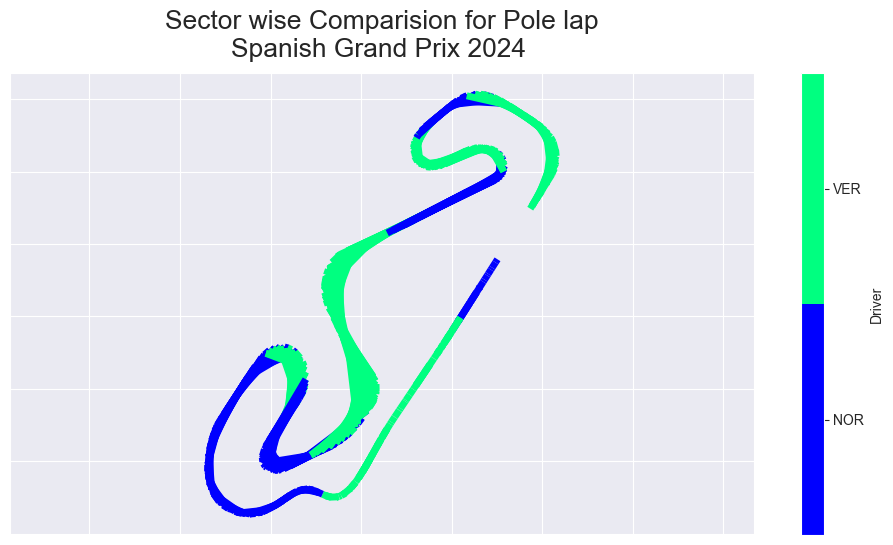

core           INFO 	Loading data for Austrian Grand Prix - Qualifying [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info


Processing Austrian Grand Prix (Round 11)


req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['1', '4', '63', '55', '44', '16', '81', '11', '27', '31', '3', '20', '10', '22', '14', '23', '18', '77', '2', '24']
c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: Futur

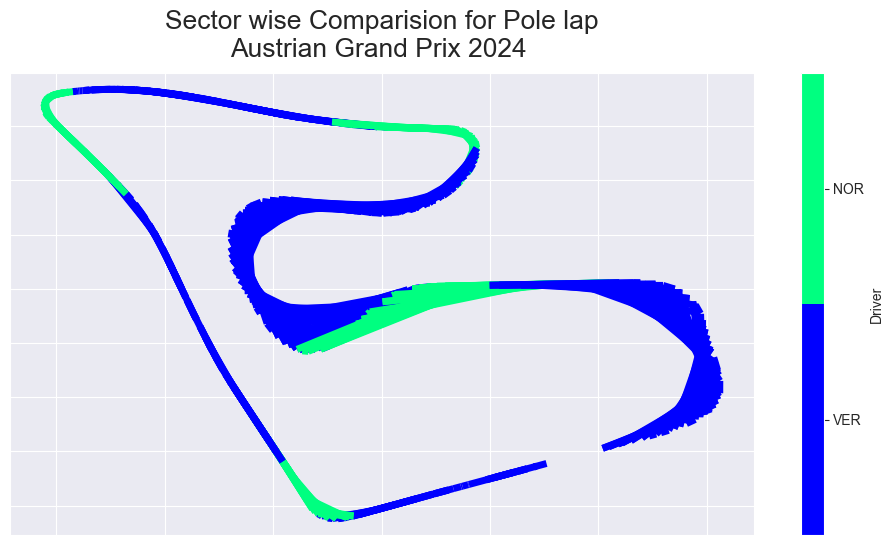

core           INFO 	Loading data for British Grand Prix - Qualifying [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info


Processing British Grand Prix (Round 12)


req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['63', '44', '4', '1', '81', '27', '55', '18', '23', '14', '16', '2', '22', '24', '3', '77', '20', '31', '11', '10']
c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: Futur

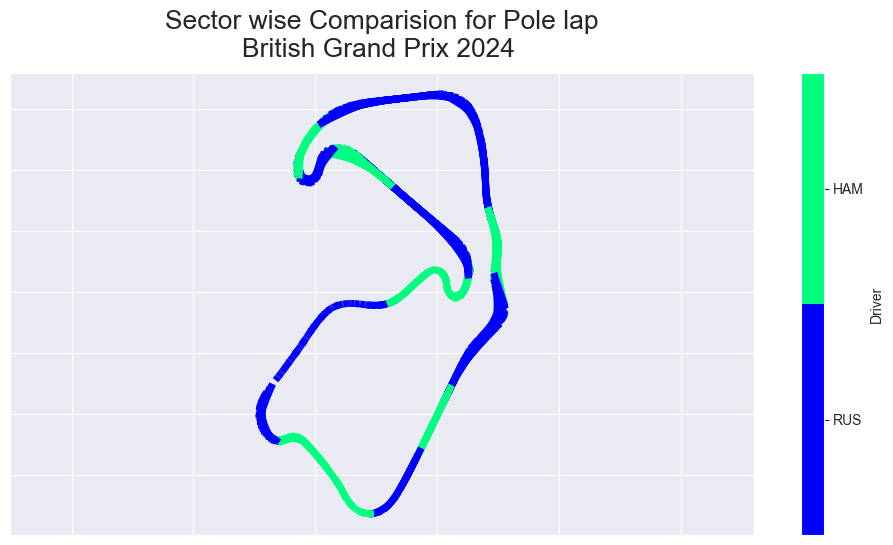

core           INFO 	Loading data for Hungarian Grand Prix - Qualifying [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info


Processing Hungarian Grand Prix (Round 13)


req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['4', '81', '1', '55', '44', '16', '14', '18', '3', '22', '27', '77', '23', '2', '20', '11', '63', '24', '31', '10']
c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: Futur

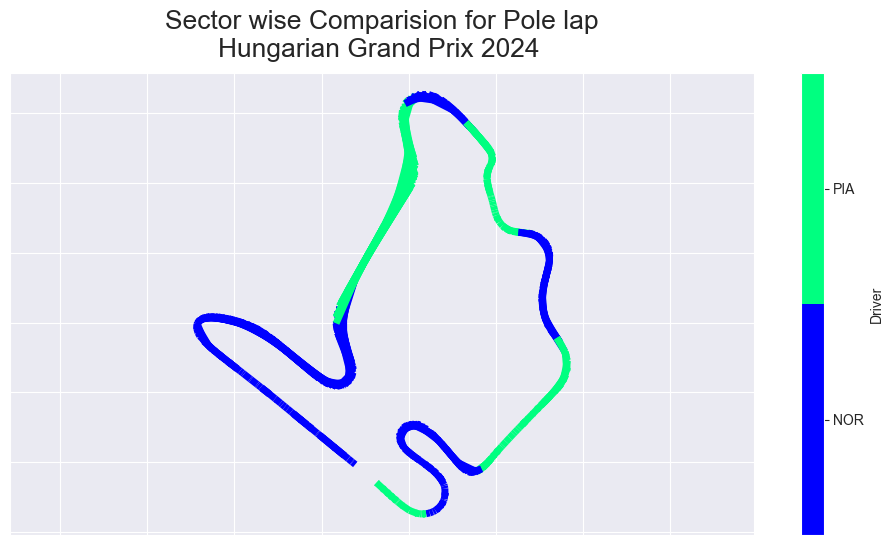

core           INFO 	Loading data for Belgian Grand Prix - Qualifying [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info


Processing Belgian Grand Prix (Round 14)


req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['1', '16', '11', '44', '4', '81', '63', '55', '14', '31', '23', '10', '3', '77', '18', '27', '20', '22', '2', '24']
c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: Futur

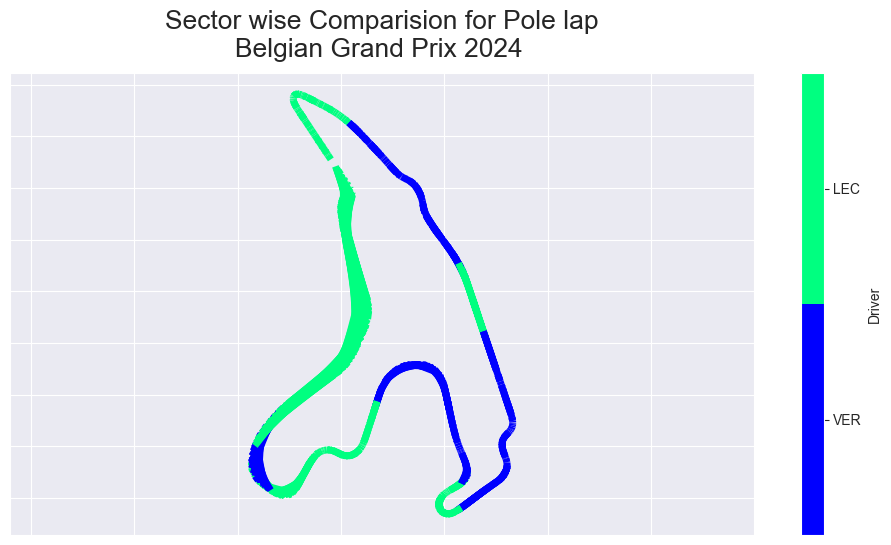

core           INFO 	Loading data for Dutch Grand Prix - Qualifying [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info


Processing Dutch Grand Prix (Round 15)


req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
core        WARNING 	No lap data for driver 2
core        WARNING 	Failed to perform lap accuracy check - all laps marked as inaccurate (driver 2)
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['4', '1', '81', '63', '11', '16', '14', '18', '10', '55', '44', '22', '27', '20', '3', '31', '77', '24', '23', '2']
c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be remove

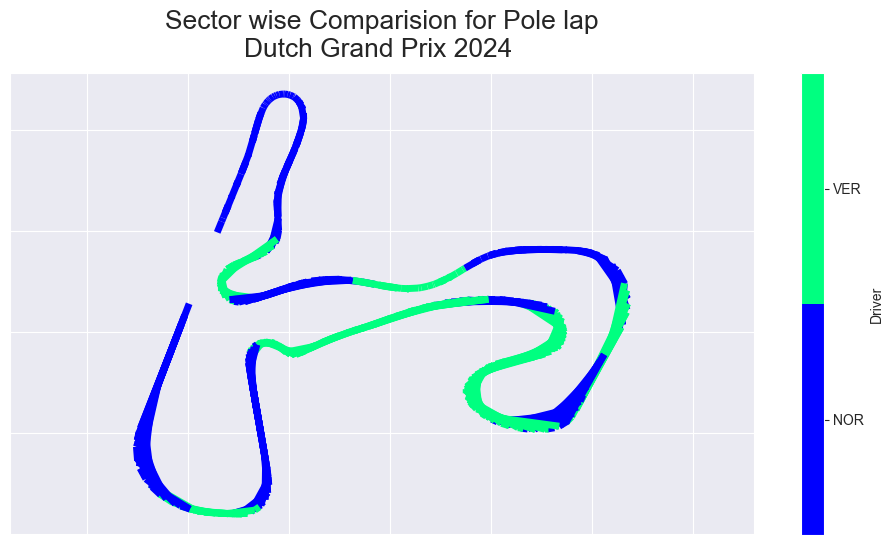

core           INFO 	Loading data for Italian Grand Prix - Qualifying [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info


Processing Italian Grand Prix (Round 16)


req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['4', '81', '63', '16', '55', '44', '1', '11', '23', '27', '14', '3', '20', '10', '31', '22', '18', '43', '77', '24']
c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: Futu

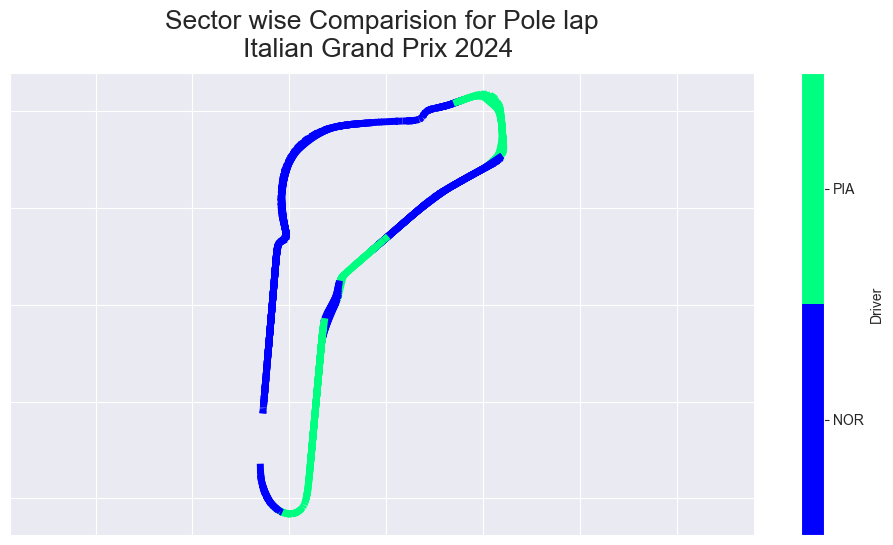

core           INFO 	Loading data for Azerbaijan Grand Prix - Qualifying [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info


Processing Azerbaijan Grand Prix (Round 17)


req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['16', '81', '55', '11', '63', '1', '44', '14', '43', '23', '50', '22', '27', '18', '3', '4', '77', '24', '31', '10']
c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: Futu

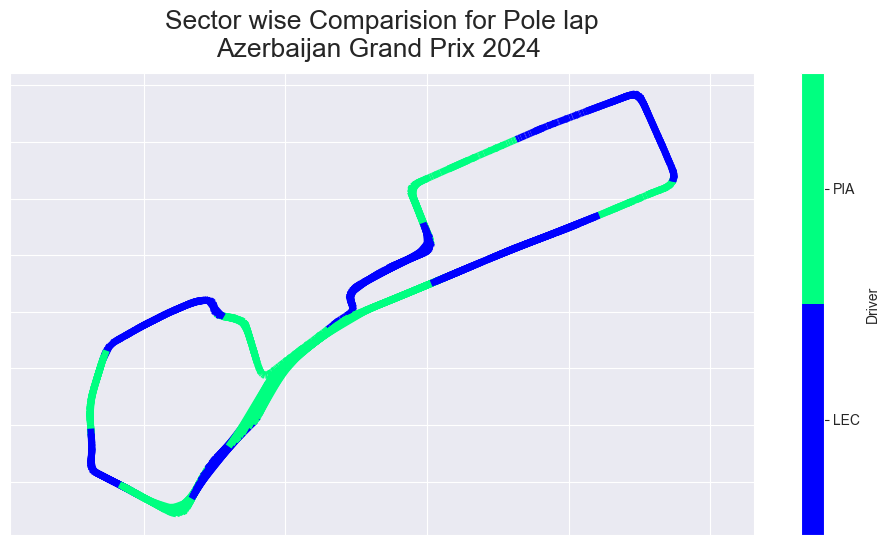

core           INFO 	Loading data for Singapore Grand Prix - Qualifying [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info


Processing Singapore Grand Prix (Round 18)


req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['4', '1', '44', '63', '81', '27', '14', '22', '16', '55', '23', '43', '11', '20', '31', '3', '18', '10', '77', '24']
c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: Futu

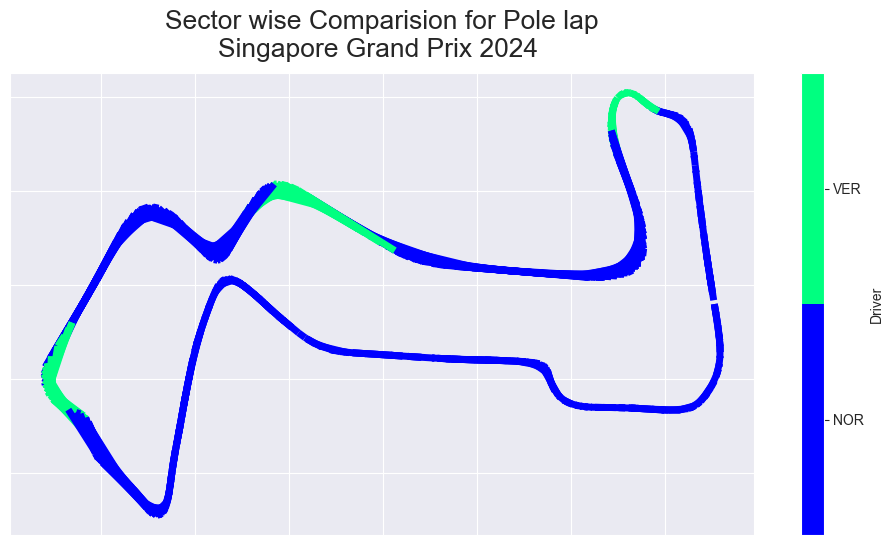

core           INFO 	Loading data for United States Grand Prix - Qualifying [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info


Processing United States Grand Prix (Round 19)


req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['4', '1', '55', '16', '81', '63', '10', '14', '20', '11', '22', '27', '31', '18', '30', '23', '43', '77', '44', '24']
c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: Fut

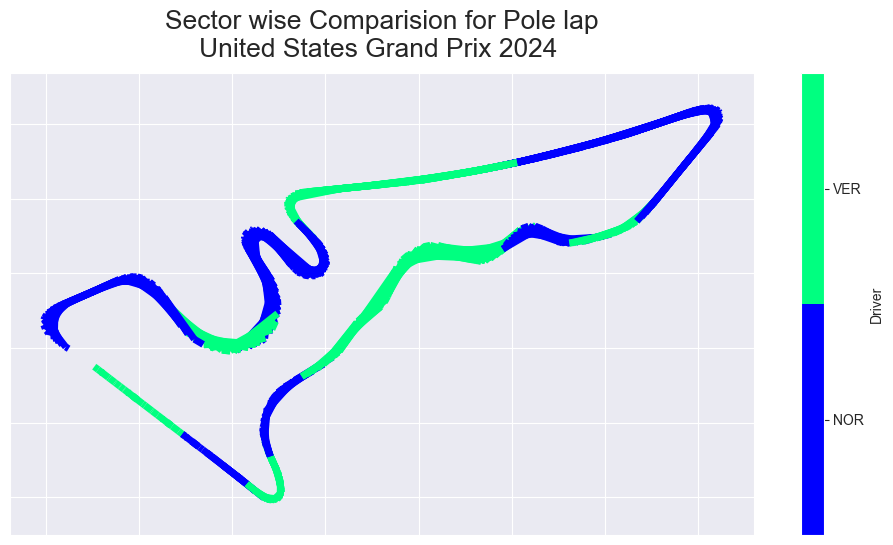

core           INFO 	Loading data for Mexico City Grand Prix - Qualifying [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info


Processing Mexico City Grand Prix (Round 20)


req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['55', '1', '4', '16', '63', '44', '20', '10', '23', '27', '22', '30', '14', '18', '77', '43', '81', '11', '31', '24']
c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: Fut

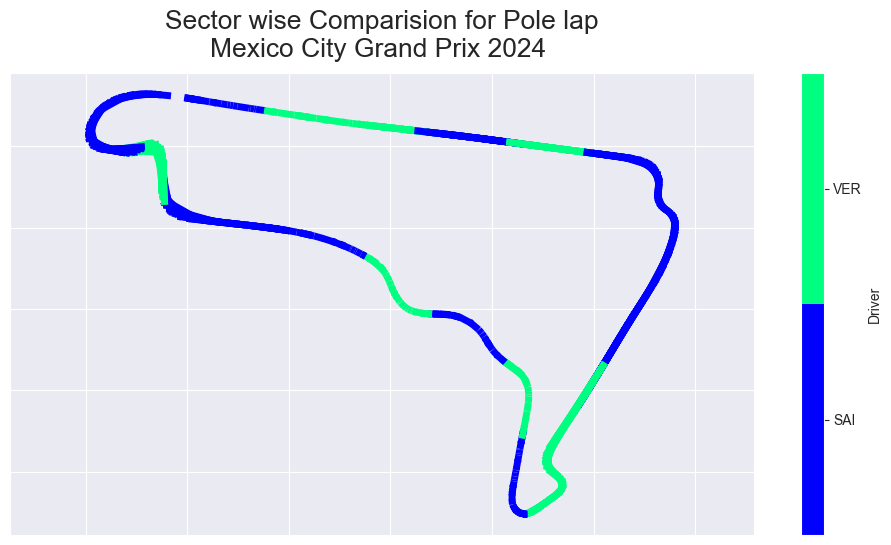

core           INFO 	Loading data for São Paulo Grand Prix - Qualifying [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info


Processing São Paulo Grand Prix (Round 21)


req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['4', '63', '22', '31', '30', '16', '23', '81', '14', '18', '77', '1', '11', '55', '10', '44', '50', '43', '27', '24']
c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: Fut

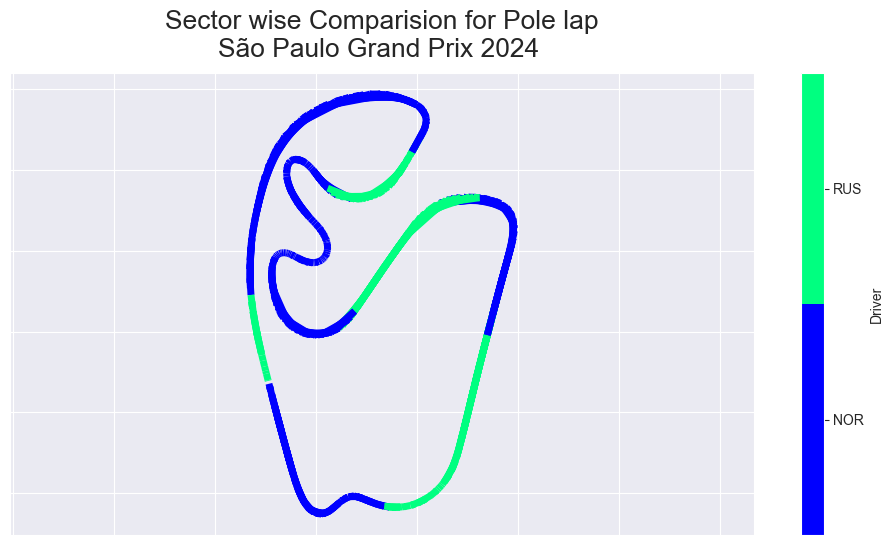

core           INFO 	Loading data for Las Vegas Grand Prix - Qualifying [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info


Processing Las Vegas Grand Prix (Round 22)


req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['63', '55', '10', '16', '1', '4', '22', '81', '27', '44', '31', '20', '24', '43', '30', '11', '14', '23', '77', '18']
c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: Fut

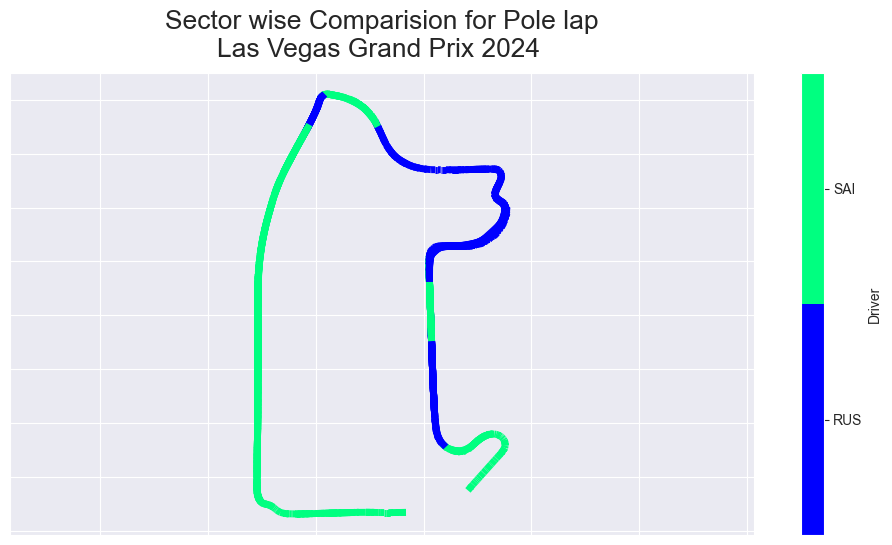

core           INFO 	Loading data for Qatar Grand Prix - Qualifying [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info


Processing Qatar Grand Prix (Round 23)


req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['1', '63', '4', '81', '16', '44', '55', '14', '11', '20', '10', '24', '77', '22', '18', '23', '30', '27', '43', '31']
c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: Fut

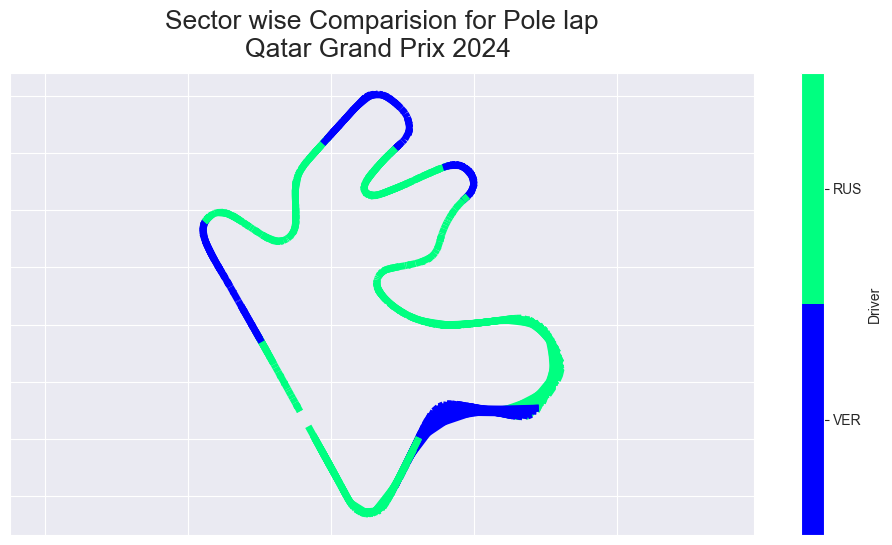

core           INFO 	Loading data for Abu Dhabi Grand Prix - Qualifying [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info


Processing Abu Dhabi Grand Prix (Round 24)


req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['4', '81', '55', '27', '1', '10', '63', '14', '77', '11', '22', '30', '18', '16', '20', '23', '24', '44', '43', '61']
c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: Fut

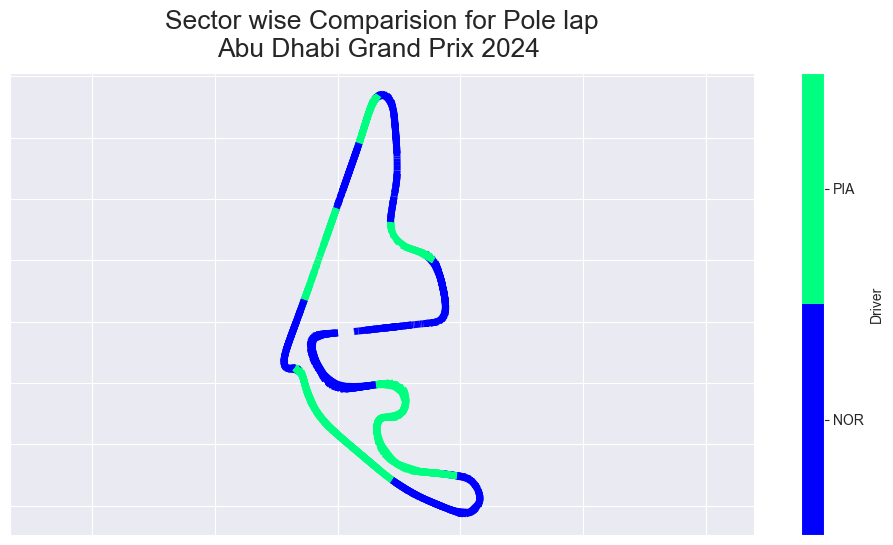

In [214]:

from matplotlib.collections import LineCollection


for round_number in schedule['RoundNumber']:
    try:
        event_name = schedule.loc[schedule['RoundNumber'] == round_number, 'EventName'].values[0]
        print(f"Processing {event_name} (Round {round_number})")

        
        session_q = fastf1.get_session(2024, round_number, 'Q')
        session_q.load()

        
        if session_q.results is None or session_q.laps is None:
            print(f"Skipping {event_name} (Round {round_number}) due to missing data.")
            continue

        results = session_q.results

        
        top_2_drivers = results.nsmallest(2, 'Position')['Abbreviation'].tolist()
        if len(top_2_drivers) < 2:
            print(f"Not enough drivers in {event_name} (Round {round_number}). Skipping...")
            continue

        driver1, driver2 = top_2_drivers

        
        driver1_team = results.loc[results['Abbreviation'] == driver1, 'TeamName'].values[0]
        driver2_team = results.loc[results['Abbreviation'] == driver2, 'TeamName'].values[0]

        
        driver1_color = team_colors.get(driver1_team, 'black')
        driver2_color = 'black' if driver1_team == driver2_team else team_colors.get(driver2_team, 'black')

        
        driver1_lap = session_q.laps.pick_driver(driver1).pick_fastest()
        driver2_lap = session_q.laps.pick_driver(driver2).pick_fastest()

        if driver1_lap is None or driver2_lap is None:
            print(f"Skipping {event_name} (Round {round_number}) due to missing lap data.")
            continue

        
        driver1_tel = driver1_lap.get_car_data().add_distance()
        driver2_tel = driver2_lap.get_car_data().add_distance()

        driver1_pos = driver1_lap.get_pos_data()
        driver2_pos = driver2_lap.get_pos_data()

        
        driver1_tel = pd.merge(driver1_tel, driver1_pos, left_index=True, right_index=True, how="inner")
        driver2_tel = pd.merge(driver2_tel, driver2_pos, left_index=True, right_index=True, how="inner")

        driver1_tel['Driver'] = driver1
        driver2_tel['Driver'] = driver2

        all_tel = pd.concat([driver1_tel, driver2_tel])

        # Divide track into minisectors
        num_minisectors = 21  # Adjustable
        total_distance = max(all_tel['Distance'])
        minisector_length = total_distance / num_minisectors

        all_tel['Minisector'] = all_tel['Distance'].apply(lambda dist: int((dist // minisector_length) + 1))

        # Find fastest driver in each minisector
        average_speed = all_tel.groupby(['Minisector', 'Driver'])['Speed'].mean().reset_index()
        fastest_driver = average_speed.loc[average_speed.groupby('Minisector')['Speed'].idxmax()]
        fastest_driver = fastest_driver[['Minisector', 'Driver']].rename(columns={'Driver': 'Fastest_Driver'})

        
        all_tel = all_tel.merge(fastest_driver, on=['Minisector']).sort_values(by=['Distance'])

        # Convert driver names to numeric values
        all_tel['Fastest_Driver_int'] = all_tel['Fastest_Driver'].map({driver1: 1, driver2: 2})

        x = all_tel['X'].values
        y = all_tel['Y'].values

        
        points = np.array([x, y]).T.reshape(-1, 1, 2)
        segments = np.concatenate([points[:-1], points[1:]], axis=1)
        fastest_driver_array = all_tel['Fastest_Driver_int'].to_numpy().astype(float)

        
        cmap = plt.get_cmap('winter', 2)
        lc_comp = LineCollection(segments, norm=plt.Normalize(1, cmap.N + 1), cmap=cmap)
        lc_comp.set_array(fastest_driver_array)
        lc_comp.set_linewidth(5)

        plt.figure(figsize=(12, 6))
        plt.gca().add_collection(lc_comp)
        plt.axis('equal')
        plt.tick_params(labelleft=False, left=False, labelbottom=False, bottom=False)

        cbar = plt.colorbar(mappable=lc_comp, label='Driver', boundaries=np.arange(1, 4))
        cbar.set_ticks([1.5, 2.5])
        cbar.set_ticklabels([driver1, driver2])

        plt.title(f"Sector wise Comparision for Pole lap\n{event_name} {session_q.event.year} ")
        plt.show()

    except Exception as e:
        print(f"Error processing {event_name} (Round {round_number}): {e}")


# Predictive Machine Learning Model 

In [156]:
import fastf1
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns

# Cache setup
CACHE_DIR = 'cache'
os.makedirs(CACHE_DIR, exist_ok=True)
fastf1.Cache.enable_cache(CACHE_DIR)

# Output directory
OUTPUT_DIR = 'f1_2024_new_ml_data'
os.makedirs(OUTPUT_DIR, exist_ok=True)

# Set dark theme for plots
plt.style.use('dark_background')
sns.set_style('darkgrid')

# Load season schedule
schedule = fastf1.get_event_schedule(2024)
round_to_track = {i+1: track for i, track in enumerate(schedule['EventName'][1:].tolist())}

# Track characteristics
def get_track_type(event_name):
    street_circuits = {'Saudi Arabian Grand Prix', 'Australian Grand Prix', 'Canadian Grand Prix',
                       'Singapore Grand Prix', 'Las Vegas Grand Prix'}
    return 'Street' if event_name in street_circuits else 'Permanent'

# Function to extract driver data
def extract_driver_data(session, session_type):
    session.load(telemetry=True, laps=True)
    results = session.results
    laps = session.laps
    
    telemetry_data = []
    for driver in results['Abbreviation']:
        driver_laps = laps.pick_driver(driver)
        if not driver_laps.empty:
            try:
                driver_tel = driver_laps.get_car_data().add_distance()
                driver_tel['Driver'] = driver
                telemetry_data.append(driver_tel[['Driver', 'Speed']])
            except Exception as e:
                print(f"Error processing telemetry for {driver}: {e}")
    
    if telemetry_data:
        all_tel = pd.concat(telemetry_data)
        avg_lap_speed = all_tel.groupby('Driver')['Speed'].mean().reset_index()
        avg_lap_speed.columns = ['Driver', 'AvgLapSpeed']
        driver_data = results[['Abbreviation', 'Position', 'TeamName']].copy()
        driver_data = driver_data.merge(avg_lap_speed, left_on='Abbreviation', right_on='Driver')
        driver_data['Weather'] = 'Wet' if laps['IsAccurate'].isna().sum() > 0 else 'Dry'
        return driver_data
    
    print(f"No {session_type} telemetry data")
    return None

# Function to process session data
def process_session(round_number, session_type, dataset):
    session = fastf1.get_session(2024, round_number, session_type)
    data = extract_driver_data(session, session_type)
    if data is not None:
        track = round_to_track[round_number]
        data['Round'] = round_number
        data['Track'] = track
        data['TrackType'] = get_track_type(track)
        dataset.append(data)

# Collect race, quali, and sprint data
race_dataset, quali_dataset, sprint_dataset = [], [], []
for round_number in range(1, len(schedule)):
    print(f"Processing Round {round_number}: {round_to_track[round_number]}")
    process_session(round_number, 'R', race_dataset)
    if 'Q' in schedule.EventFormat[round_number]:
        process_session(round_number, 'Q', quali_dataset)
    if 'S' in schedule.EventFormat[round_number]:
        process_session(round_number, 'S', sprint_dataset)

# Convert lists to DataFrames
race_df = pd.concat(race_dataset, ignore_index=True) if race_dataset else pd.DataFrame()
quali_df = pd.concat(quali_dataset, ignore_index=True) if quali_dataset else pd.DataFrame()
sprint_df = pd.concat(sprint_dataset, ignore_index=True) if sprint_dataset else pd.DataFrame()

# Rename position columns
race_df.rename(columns={'Position': 'FinalPosition'}, inplace=True)
quali_df.rename(columns={'Position': 'QualiPosition'}, inplace=True)
sprint_df.rename(columns={'Position': 'SprintPosition'}, inplace=True)

# Merge sprint data into race_df
if not sprint_df.empty:
    race_df = race_df.merge(sprint_df[['Round', 'Driver', 'SprintPosition']], on=['Round', 'Driver'], how='left')
    race_df['SprintPosition'].fillna(0, inplace=True)

# Save datasets
race_df.to_csv(os.path.join(OUTPUT_DIR, 'race_df.csv'), index=False)
if not quali_df.empty:
    quali_df.to_csv(os.path.join(OUTPUT_DIR, 'quali_df.csv'), index=False)

print("Data collection complete.")


core           INFO 	Loading data for Bahrain Grand Prix - Race [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info


Processing Round 1: Bahrain Grand Prix


req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for lap_count
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['1', '11', '55', '16', '63', '4', '44', '81', '14', '18', '24', '20', '3', '22', '23', '27', '31', '10', '77', '2']
c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analys

Processing Round 2: Saudi Arabian Grand Prix


req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for lap_count
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['1', '11', '16', '81', '14', '63', '38', '4', '44', '27', '23', '20', '31', '2', '22', '3', '77', '24', '18', '10']
c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analys

Processing Round 3: Australian Grand Prix


req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for lap_count
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 19 drivers: ['55', '16', '4', '81', '11', '18', '22', '14', '27', '20', '23', '3', '10', '77', '24', '31', '63', '44', '1']
c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analysis\my

Processing Round 4: Japanese Grand Prix


req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for lap_count
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['1', '11', '55', '16', '4', '14', '63', '81', '44', '22', '27', '18', '20', '77', '31', '10', '2', '24', '3', '23']
c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analys

Processing Round 5: Chinese Grand Prix


req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for lap_count
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['1', '4', '11', '16', '55', '63', '14', '81', '44', '27', '31', '23', '10', '24', '18', '20', '2', '3', '22', '77']
c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analys

Processing Round 6: Miami Grand Prix


req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for lap_count
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['4', '1', '16', '11', '55', '44', '22', '63', '14', '31', '27', '10', '81', '24', '3', '77', '18', '23', '20', '2']
c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analys

Processing Round 7: Emilia Romagna Grand Prix


req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for lap_count
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['1', '4', '16', '81', '55', '44', '63', '11', '18', '22', '27', '20', '3', '31', '24', '10', '2', '77', '14', '23']
c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analys

Processing Round 8: Monaco Grand Prix


req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for lap_count
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['16', '81', '55', '4', '63', '1', '44', '22', '23', '10', '14', '3', '77', '18', '2', '24', '31', '11', '27', '20']
c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analys

Processing Round 9: Canadian Grand Prix


req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for lap_count
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['1', '4', '63', '44', '81', '14', '18', '3', '10', '31', '27', '20', '77', '22', '24', '55', '23', '11', '16', '2']
c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analys

Processing Round 10: Spanish Grand Prix


req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for lap_count
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['1', '4', '44', '63', '16', '55', '81', '11', '10', '31', '27', '14', '24', '18', '3', '77', '20', '23', '22', '2']
c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analys

Processing Round 11: Austrian Grand Prix


core           INFO 	Loading data for Austrian Grand Prix - Race [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for lap_count
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['63', '81', '55', '44', '1', '27', '11', '20', '3', '10', '16', '31', '18', '22', '23', '77', '24', '14', '2', '4']
c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site

Processing Round 12: British Grand Prix


req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for lap_count
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['44', '1', '4', '81', '55', '27', '18', '14', '23', '22', '2', '20', '3', '16', '77', '31', '11', '24', '63', '10']
c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analys

Processing Round 13: Hungarian Grand Prix


req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for lap_count
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['81', '4', '44', '16', '1', '55', '11', '63', '22', '18', '14', '3', '27', '23', '20', '77', '2', '31', '24', '10']
c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analys

Processing Round 14: Belgian Grand Prix


req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for lap_count
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['44', '81', '16', '1', '4', '55', '11', '14', '31', '3', '18', '23', '10', '20', '77', '22', '2', '27', '24', '63']
c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analys

Processing Round 15: Dutch Grand Prix


core           INFO 	Loading data for Dutch Grand Prix - Race [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for lap_count
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['4', '1', '16', '81', '55', '11', '63', '44', '10', '14', '27', '3', '18', '23', '31', '2', '22', '20', '77', '24']
c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-pa

Processing Round 16: Italian Grand Prix


req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for lap_count
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['16', '81', '4', '55', '44', '1', '63', '11', '23', '20', '14', '43', '3', '31', '10', '77', '27', '24', '18', '22']
c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analy

Processing Round 17: Azerbaijan Grand Prix


req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for lap_count
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['81', '16', '63', '4', '1', '14', '23', '43', '44', '50', '27', '10', '3', '24', '31', '77', '11', '55', '18', '22']
c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analy

Processing Round 18: Singapore Grand Prix


req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for lap_count
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['4', '1', '81', '63', '16', '44', '55', '14', '27', '11', '43', '22', '31', '18', '24', '77', '10', '3', '20', '23']
c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Analy

Processing Round 19: United States Grand Prix


req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for lap_count
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['16', '55', '1', '4', '81', '63', '11', '27', '30', '43', '20', '10', '14', '22', '18', '23', '77', '31', '24', '44']
c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Anal

Processing Round 20: Mexico City Grand Prix


req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for lap_count
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['55', '4', '16', '44', '63', '1', '20', '81', '27', '10', '18', '43', '31', '77', '24', '30', '11', '14', '23', '22']
c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Anal

Processing Round 21: São Paulo Grand Prix


req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for lap_count
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
core        WARNING 	No lap data for driver 23
core        WARNING 	Failed to perform lap accuracy check - all laps marked as inaccurate (driver 23)
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['1', '31', '10', '63', '16', '4', '22', '81', '30', '44', '11', '50', '77', '14', '24', '55', '43', '23', '18', '27']
c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: Fut

Processing Round 22: Las Vegas Grand Prix


req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for lap_count
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
core        WARNING 	Driver 63: Lap timing integrity check failed for 2 lap(s)
core        WARNING 	Driver 44: Lap timing integrity check failed for 1 lap(s)
core        WARNING 	Driver 55: Lap timing integrity check failed for 1 lap(s)
core        WARNING 	Driver 16: Lap timing integrity check failed for 2 lap(s)
core        WARNING 	Driver  1: Lap timing integrity check failed for 1 lap(s)
core        WARNING 	Driver  4: Lap timing integrity check failed for 1 lap(s)
core        WARNING 	Driver 81: Lap timing integrity check failed for 1 lap(s)
core        WARNING 	Driver 30: Lap timing integrity check failed for 2 lap(s)
core        WARNING 

Processing Round 23: Qatar Grand Prix


req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for lap_count
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['1', '16', '81', '63', '10', '55', '14', '24', '20', '4', '77', '44', '22', '30', '23', '27', '11', '18', '43', '31']
c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Anal

Processing Round 24: Abu Dhabi Grand Prix


req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for lap_count
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['4', '55', '16', '44', '63', '1', '10', '27', '14', '81', '23', '22', '24', '18', '61', '20', '30', '77', '43', '11']
c:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\Lib\site-packages\fastf1\core.py:3022: FutureWarning:

pick_driver is deprecated and will be removed in a future release. Use pick_drivers instead.

c:\Users\Admin\Desktop\F1 2024 Season Anal

Data collection complete.


In [160]:
race_df.columns

Index(['Abbreviation', 'FinalPosition', 'TeamName', 'Driver', 'AvgLapSpeed',
       'Weather', 'Round', 'Track', 'TrackType'],
      dtype='object')

In [161]:
driver_table.columns

Index(['Driver', 'Permanent Track Avg Position',
       'Street Circuit Avg Position'],
      dtype='object')

In [163]:
team_strengths.columns

Index(['Round', 'Track', 'TrackType', 'TrackCharacteristics', 'Team',
       'AvgPosition', 'Driver'],
      dtype='object')

In [164]:
team_strengths.rename(columns={"Team": "TeamName"}, inplace=True)
team_strengths

C:\Users\Admin\AppData\Local\Temp\ipykernel_28552\750637413.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Round,Track,TrackType,TrackCharacteristics,TeamName,AvgPosition,Driver
0,1,Bahrain Grand Prix,Permanent,mix of high-speed straights and slow corners,Alpine,17.5,NaN
1,1,Bahrain Grand Prix,Permanent,mix of high-speed straights and slow corners,Aston Martin,9.5,NaN
2,1,Bahrain Grand Prix,Permanent,mix of high-speed straights and slow corners,Ferrari,3.5,NaN
3,1,Bahrain Grand Prix,Permanent,mix of high-speed straights and slow corners,Haas F1 Team,14.0,NaN
4,1,Bahrain Grand Prix,Permanent,mix of high-speed straights and slow corners,Kick Sauber,15.0,NaN
...,...,...,...,...,...,...,...
694,24,Abu Dhabi Grand Prix,Permanent,long straights with a series of technical corn...,McLaren,5.5,NaN
695,24,Abu Dhabi Grand Prix,Permanent,long straights with a series of technical corn...,Mercedes,4.5,NaN
696,24,Abu Dhabi Grand Prix,Permanent,long straights with a series of technical corn...,RB,14.5,NaN
697,24,Abu Dhabi Grand Prix,Permanent,long straights with a series of technical corn...,Red Bull Racing,13.0,NaN


In [165]:
team_strengths.columns

Index(['Round', 'Track', 'TrackType', 'TrackCharacteristics', 'TeamName',
       'AvgPosition', 'Driver'],
      dtype='object')

In [166]:
race_df_merged = race_df.merge(
    driver_table[['Driver', 'Permanent Track Avg Position', 'Street Circuit Avg Position']],
    on='Driver',
    how='left'
)

race_df_merged['AvgDriverFinish'] = race_df_merged.apply(
    lambda row: row['Permanent Track Avg Position'] if row['TrackType'] == 'Permanent' else row['Street Circuit Avg Position'],
    axis=1
)

race_df_merged = race_df_merged.merge(
    team_strengths[['TeamName', 'Track', 'AvgPosition']],
    on=['TeamName', 'Track'],
    how='left'
)
race_df_merged = race_df_merged.rename(columns={'AvgPosition': 'AvgTeamFinish'})

# Drop temporary columns if they exist
race_df_merged = race_df_merged.drop(columns=['Permanent Track Avg Position', 'Street Circuit Avg Position'], errors='ignore')

# Check the result
print("Merged race_df columns:", race_df_merged.columns.tolist())
print(race_df_merged.head())



Merged race_df columns: ['Abbreviation', 'FinalPosition', 'TeamName', 'Driver', 'AvgLapSpeed', 'Weather', 'Round', 'Track', 'TrackType', 'AvgDriverFinish', 'AvgTeamFinish']
  Abbreviation  FinalPosition         TeamName Driver  AvgLapSpeed Weather  \
0          VER            1.0  Red Bull Racing    VER   199.582529     Dry   
1          PER            2.0  Red Bull Racing    PER   198.535206     Dry   
2          SAI            3.0          Ferrari    SAI   199.382906     Dry   
3          LEC            4.0          Ferrari    LEC   198.398665     Dry   
4          RUS            5.0         Mercedes    RUS   198.004204     Dry   

   Round               Track  TrackType  AvgDriverFinish  AvgTeamFinish  
0      1  Bahrain Grand Prix  Permanent         2.857143            1.5  
1      1  Bahrain Grand Prix  Permanent         8.214286            1.5  
2      1  Bahrain Grand Prix  Permanent         4.357143            3.5  
3      1  Bahrain Grand Prix  Permanent         4.428571      

In [168]:
race_df_merged.info()

<class 'fastf1.core.SessionResults'>
RangeIndex: 478 entries, 0 to 477
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Abbreviation     478 non-null    object 
 1   FinalPosition    478 non-null    float64
 2   TeamName         478 non-null    object 
 3   Driver           478 non-null    object 
 4   AvgLapSpeed      478 non-null    float64
 5   Weather          478 non-null    object 
 6   Round            478 non-null    int64  
 7   Track            478 non-null    object 
 8   TrackType        478 non-null    object 
 9   AvgDriverFinish  476 non-null    float64
 10  AvgTeamFinish    478 non-null    float64
dtypes: float64(4), int64(1), object(6)
memory usage: 41.2+ KB


In [ ]:
cached_sessions_q

AttributeError: 'dict' object has no attribute 'sessions'

In [171]:
output_dir = 'f1_2024_new_data'
os.makedirs(output_dir, exist_ok=True)


quali_data = []
for round_number, session_q in cached_sessions_q.items():
    
    results = session_q.results
    
    
    track = session_q.event['EventName']
    
    
    for _, row in results.iterrows():
        driver_info = {
            'Round': round_number,
            'Track': track,
            'Driver': row['Abbreviation'],  
            'TeamName': row['TeamName'],
            'QualiPosition': row['Position'],
            'Weather': 'Dry' 
        }
        
        
        if hasattr(session_q, 'laps') and not session_q.laps.empty:
            wet_laps = session_q.laps['IsAccurate'].isna().sum() > 0
            driver_info['Weather'] = 'Wet' if wet_laps else 'Dry'
        
        quali_data.append(driver_info)


quali_df = pd.DataFrame(quali_data)
print("Initial quali_df columns:", quali_df.columns.tolist())
print(quali_df.head())

quali_df['AvgDriverQuali'] = quali_df.groupby('Driver')['QualiPosition'].transform('mean')

quali_df['AvgTeamQuali'] = quali_df.groupby('TeamName')['QualiPosition'].transform('mean')

# Check the updated DataFrame
print("Final quali_df columns:", quali_df.columns.tolist())
print(quali_df.head())



Initial quali_df columns: ['Round', 'Track', 'Driver', 'TeamName', 'QualiPosition', 'Weather']
   Round               Track Driver         TeamName  QualiPosition Weather
0      1  Bahrain Grand Prix    VER  Red Bull Racing            1.0     Dry
1      1  Bahrain Grand Prix    LEC          Ferrari            2.0     Dry
2      1  Bahrain Grand Prix    RUS         Mercedes            3.0     Dry
3      1  Bahrain Grand Prix    SAI          Ferrari            4.0     Dry
4      1  Bahrain Grand Prix    PER  Red Bull Racing            5.0     Dry
Final quali_df columns: ['Round', 'Track', 'Driver', 'TeamName', 'QualiPosition', 'Weather', 'AvgDriverQuali', 'AvgTeamQuali']
   Round               Track Driver         TeamName  QualiPosition Weather  \
0      1  Bahrain Grand Prix    VER  Red Bull Racing            1.0     Dry   
1      1  Bahrain Grand Prix    LEC          Ferrari            2.0     Dry   
2      1  Bahrain Grand Prix    RUS         Mercedes            3.0     Dry   
3     

In [172]:
quali_df

,Round,Track,Driver,TeamName,QualiPosition,Weather,AvgDriverQuali,AvgTeamQuali
0,1,Bahrain Grand Prix,VER,Red Bull Racing,1.0,Dry,2.916667,6.125000
1,1,Bahrain Grand Prix,LEC,Ferrari,2.0,Dry,5.333333,5.541667
2,1,Bahrain Grand Prix,RUS,Mercedes,3.0,Dry,5.166667,6.833333
3,1,Bahrain Grand Prix,SAI,Ferrari,4.0,Dry,5.521739,5.541667
4,1,Bahrain Grand Prix,PER,Red Bull Racing,5.0,Dry,9.333333,6.125000
...,...,...,...,...,...,...,...,...
474,24,Abu Dhabi Grand Prix,ALB,Williams,16.0,Dry,12.958333,14.893617
475,24,Abu Dhabi Grand Prix,ZHO,Kick Sauber,17.0,Dry,18.083333,16.645833
476,24,Abu Dhabi Grand Prix,HAM,Mercedes,18.0,Dry,8.500000,6.833333
477,24,Abu Dhabi Grand Prix,COL,Williams,19.0,Dry,15.777778,14.893617


In [173]:

quali_df.to_csv(os.path.join(output_dir, 'quali_df.csv'), index=False)
print(f"Saved quali_df with {len(quali_df)} rows to {os.path.join(output_dir, 'quali_df.csv')}")

Saved quali_df with 479 rows to f1_2024_new_data\quali_df.csv


In [ ]:

final_df = race_df_merged.merge(
    quali_df[['Round', 'Driver', 'QualiPosition', 'AvgDriverQuali', 'AvgTeamQuali', 'Weather']],
    on=['Round', 'Driver'],
    how='left',
    suffixes=('_race', '_quali')  # Handle potential Weather column conflict
)

# Handle missing QualiPosition (e.g., if a round failed to load quali data)
final_df['QualiPosition'] = final_df['QualiPosition'].fillna(final_df['QualiPosition'].median())

# Resolve Weather conflict: Use race weather if quali weather is NaN
final_df['Weather'] = final_df['Weather_race'].fillna(final_df['Weather_quali'])
final_df = final_df.drop(columns=['Weather_race', 'Weather_quali'], errors='ignore')

# Check the merged result
print("Final merged columns:", final_df.columns.tolist())
final_df.head()



Final merged columns: ['Abbreviation', 'FinalPosition', 'TeamName', 'Driver', 'AvgLapSpeed', 'Round', 'Track', 'TrackType', 'AvgDriverFinish', 'AvgTeamFinish', 'QualiPosition', 'AvgDriverQuali', 'AvgTeamQuali', 'Weather']


,Abbreviation,FinalPosition,TeamName,Driver,AvgLapSpeed,Round,Track,TrackType,AvgDriverFinish,AvgTeamFinish,QualiPosition,AvgDriverQuali,AvgTeamQuali,Weather
0,VER,1.0,Red Bull Racing,VER,199.582529,1,Bahrain Grand Prix,Permanent,2.857143,1.5,1.0,2.916667,6.125000,Dry
1,PER,2.0,Red Bull Racing,PER,198.535206,1,Bahrain Grand Prix,Permanent,8.214286,1.5,5.0,9.333333,6.125000,Dry
2,SAI,3.0,Ferrari,SAI,199.382906,1,Bahrain Grand Prix,Permanent,4.357143,3.5,4.0,5.521739,5.541667,Dry
3,LEC,4.0,Ferrari,LEC,198.398665,1,Bahrain Grand Prix,Permanent,4.428571,3.5,2.0,5.333333,5.541667,Dry
4,RUS,5.0,Mercedes,RUS,198.004204,1,Bahrain Grand Prix,Permanent,7.642857,6.0,3.0,5.166667,6.833333,Dry


In [176]:
import fastf1
import pandas as pd
import os

# Cache setup
cache_dir = 'cache'
os.makedirs(cache_dir, exist_ok=True)
fastf1.Cache.enable_cache(cache_dir)

# Output directory
output_dir = 'f1_2024_new_data'
os.makedirs(output_dir, exist_ok=True)

# Load sprint sessions into a dictionary
cached_sessions_s = {}
schedule = fastf1.get_event_schedule(2024)
print("Unique Event Formats:", schedule['EventFormat'].unique())  # Debug event formats

for round_number in range(1, 25):
    try:
        # Check if this round has a sprint session (case-insensitive check)
        event_format = schedule.EventFormat[round_number]
        if 'sprint' in event_format.lower():  # Updated condition
            session_s = fastf1.get_session(2024, round_number, 'S')
            session_s.load(telemetry=True, laps=True)
            cached_sessions_s[round_number] = session_s
            print(f"Loaded Sprint Round {round_number}: {session_s.event['EventName']}")
        else:
            print(f"No sprint in Round {round_number}: {schedule['EventName'][round_number]}")
    except Exception as e:
        print(f"Skipping Sprint Round {round_number} due to error: {e}")

# Extract sprint data from cached sessions
sprint_data = []
for round_number, session_s in cached_sessions_s.items():
    results = session_s.results
    track = session_s.event['EventName']
    
    for _, row in results.iterrows():
        driver_info = {
            'Round': round_number,
            'Track': track,
            'Driver': row['Abbreviation'],
            'TeamName': row['TeamName'],
            'SprintPosition': row['Position'],
            'Weather': 'Dry'
        }
        
        if hasattr(session_s, 'laps') and not session_s.laps.empty:
            wet_laps = session_s.laps['IsAccurate'].isna().sum() > 0
            driver_info['Weather'] = 'Wet' if wet_laps else 'Dry'
        
        sprint_data.append(driver_info)

# Create DataFrame with a fallback for empty data
if sprint_data:
    sprint_df = pd.DataFrame(sprint_data)
    print("Initial sprint_df columns:", sprint_df.columns.tolist())
    print(sprint_df.head())
    
    # Compute season averages
    sprint_df['AvgDriverSprint'] = sprint_df.groupby('Driver')['SprintPosition'].transform('mean')
    sprint_df['AvgTeamSprint'] = sprint_df.groupby('TeamName')['SprintPosition'].transform('mean')
    
    print("Final sprint_df columns:", sprint_df.columns.tolist())
    print(sprint_df.head())
else:
    sprint_df = pd.DataFrame(columns=['Round', 'Track', 'Driver', 'TeamName', 'SprintPosition', 'Weather', 'AvgDriverSprint', 'AvgTeamSprint'])
    print("No sprint data collected; created empty sprint_df with expected columns")

# Save to CSV
sprint_df.to_csv(os.path.join(output_dir, 'sprint_df.csv'), index=False)
print(f"Saved sprint_df with {len(sprint_df)} rows to {os.path.join(output_dir, 'sprint_df.csv')}")

core           INFO 	Loading data for Chinese Grand Prix - Sprint [v3.4.4]
req            INFO 	Using cached data for session_info


Unique Event Formats: ['testing' 'conventional' 'sprint_qualifying']
No sprint in Round 1: Bahrain Grand Prix
No sprint in Round 2: Saudi Arabian Grand Prix
No sprint in Round 3: Australian Grand Prix
No sprint in Round 4: Japanese Grand Prix


req            INFO 	Using cached data for driver_info
req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for lap_count
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	No cached data found for car_data. Loading data...
_api           INFO 	Fetching car data...
_api           INFO 	Parsing car data...
req            INFO 	Data has been written to cache!
req            INFO 	No cached data found for position_data. Loading data...
_api           INFO 	Fetching position data...
_api           INFO 	Parsing position data...
req            INFO 	Data has been written to cache!
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data fo

Loaded Sprint Round 5: Chinese Grand Prix


req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for lap_count
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['1', '16', '11', '3', '55', '81', '27', '22', '10', '2', '24', '63', '23', '77', '31', '44', '14', '20', '18', '4']
core           INFO 	Loading data for Austrian Grand Prix - Sprint [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info


Loaded Sprint Round 6: Miami Grand Prix
No sprint in Round 7: Emilia Romagna Grand Prix
No sprint in Round 8: Monaco Grand Prix
No sprint in Round 9: Canadian Grand Prix
No sprint in Round 10: Spanish Grand Prix


req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for lap_count
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	No cached data found for car_data. Loading data...
_api           INFO 	Fetching car data...
_api           INFO 	Parsing car data...
req            INFO 	Data has been written to cache!
req            INFO 	No cached data found for position_data. Loading data...
_api           INFO 	Fetching position data...
_api           INFO 	Parsing position data...
req            INFO 	Data has been written to cache!
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['1', '81', '4', '63', '55', '44', '16', 

Loaded Sprint Round 11: Austrian Grand Prix
No sprint in Round 12: British Grand Prix
No sprint in Round 13: Hungarian Grand Prix
No sprint in Round 14: Belgian Grand Prix
No sprint in Round 15: Dutch Grand Prix
No sprint in Round 16: Italian Grand Prix
No sprint in Round 17: Azerbaijan Grand Prix
No sprint in Round 18: Singapore Grand Prix


req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for lap_count
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	No cached data found for car_data. Loading data...
_api           INFO 	Fetching car data...
_api           INFO 	Parsing car data...
req            INFO 	Data has been written to cache!
req            INFO 	No cached data found for position_data. Loading data...
_api           INFO 	Fetching position data...
_api           INFO 	Parsing position data...
req            INFO 	Data has been written to cache!
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['1', '55', '4', '16', '63', '44', '20', 

Loaded Sprint Round 19: United States Grand Prix
No sprint in Round 20: Mexico City Grand Prix


req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for lap_count
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	No cached data found for car_data. Loading data...
_api           INFO 	Fetching car data...
_api           INFO 	Parsing car data...
req            INFO 	Data has been written to cache!
req            INFO 	No cached data found for position_data. Loading data...
_api           INFO 	Fetching position data...
_api           INFO 	Parsing position data...
req            INFO 	Data has been written to cache!
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['4', '81', '16', '1', '55', '63', '10', 

Loaded Sprint Round 21: São Paulo Grand Prix
No sprint in Round 22: Las Vegas Grand Prix


core           INFO 	Loading data for Qatar Grand Prix - Sprint [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for lap_count
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	No cached data found for car_data. Loading data...
_api           INFO 	Fetching car data...
_api           INFO 	Parsing car data...
_api        WARNING 	Driver  2: Car data is incomplete!
_api        WARNING 	Driver 40: Car data is incomplete!
_api        WARNING 	Driver 30: Car data is incomplete!
_api        WARNING 	Driver 43: Car data is incomplete!
req            INFO 	Data has been written to cache!
req            INFO 	No cached data 

Loaded Sprint Round 23: Qatar Grand Prix
No sprint in Round 24: Abu Dhabi Grand Prix
Initial sprint_df columns: ['Round', 'Track', 'Driver', 'TeamName', 'SprintPosition', 'Weather']
   Round               Track Driver         TeamName  SprintPosition Weather
0      5  Chinese Grand Prix    VER  Red Bull Racing             1.0     Dry
1      5  Chinese Grand Prix    HAM         Mercedes             2.0     Dry
2      5  Chinese Grand Prix    PER  Red Bull Racing             3.0     Dry
3      5  Chinese Grand Prix    LEC          Ferrari             4.0     Dry
4      5  Chinese Grand Prix    SAI          Ferrari             5.0     Dry
Final sprint_df columns: ['Round', 'Track', 'Driver', 'TeamName', 'SprintPosition', 'Weather', 'AvgDriverSprint', 'AvgTeamSprint']
   Round               Track Driver         TeamName  SprintPosition Weather  \
0      5  Chinese Grand Prix    VER  Red Bull Racing             1.0     Dry   
1      5  Chinese Grand Prix    HAM         Mercedes             

In [177]:
sprint_df 

,Round,Track,Driver,TeamName,SprintPosition,Weather,AvgDriverSprint,AvgTeamSprint
0,5,Chinese Grand Prix,VER,Red Bull Racing,1.0,Dry,2.666667,5.583333
1,5,Chinese Grand Prix,HAM,Mercedes,2.0,Dry,7.833333,7.083333
2,5,Chinese Grand Prix,PER,Red Bull Racing,3.0,Dry,8.500000,5.583333
3,5,Chinese Grand Prix,LEC,Ferrari,4.0,Dry,4.166667,4.250000
4,5,Chinese Grand Prix,SAI,Ferrari,5.0,Dry,4.333333,4.250000
...,...,...,...,...,...,...,...,...
115,23,Qatar Grand Prix,LAW,RB,16.0,Dry,13.666667,12.500000
116,23,Qatar Grand Prix,TSU,RB,17.0,Dry,13.333333,12.500000
117,23,Qatar Grand Prix,COL,Williams,18.0,Dry,14.000000,14.583333
118,23,Qatar Grand Prix,ZHO,Kick Sauber,19.0,Dry,15.833333,15.583333


In [217]:
final_df = final_df.merge(
    sprint_df[['Round', 'Driver', 'SprintPosition']],
    on=['Round', 'Driver'],
    how='left'
)
final_df['SprintPosition'] = final_df['SprintPosition'].fillna(0)

final_df

,Abbreviation,FinalPosition,TeamName,Driver,AvgLapSpeed,Round,Track,TrackType,AvgDriverFinish,AvgTeamFinish,QualiPosition,AvgDriverQuali,AvgTeamQuali,Weather,SprintPosition
0,VER,1.0,Red Bull Racing,VER,199.582529,1,Bahrain Grand Prix,Permanent,2.857143,1.5,1.0,2.916667,6.125000,Dry,0.0
1,PER,2.0,Red Bull Racing,PER,198.535206,1,Bahrain Grand Prix,Permanent,8.214286,1.5,5.0,9.333333,6.125000,Dry,0.0
2,SAI,3.0,Ferrari,SAI,199.382906,1,Bahrain Grand Prix,Permanent,4.357143,3.5,4.0,5.521739,5.541667,Dry,0.0
3,LEC,4.0,Ferrari,LEC,198.398665,1,Bahrain Grand Prix,Permanent,4.428571,3.5,2.0,5.333333,5.541667,Dry,0.0
4,RUS,5.0,Mercedes,RUS,198.004204,1,Bahrain Grand Prix,Permanent,7.642857,6.0,3.0,5.166667,6.833333,Dry,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
473,MAG,16.0,Haas F1 Team,MAG,203.307704,24,Abu Dhabi Grand Prix,Permanent,13.571429,12.0,15.0,14.272727,12.979167,Dry,0.0
474,LAW,17.0,RB,LAW,202.797403,24,Abu Dhabi Grand Prix,Permanent,13.333333,14.5,12.0,12.666667,12.104167,Dry,0.0
475,BOT,18.0,Kick Sauber,BOT,197.859891,24,Abu Dhabi Grand Prix,Permanent,16.285714,15.5,9.0,15.208333,16.645833,Dry,0.0
476,COL,19.0,Williams,COL,197.645319,24,Abu Dhabi Grand Prix,Permanent,15.000000,15.0,19.0,15.777778,14.893617,Dry,0.0


In [204]:
final_df.to_csv(os.path.join(output_dir, 'final_df.csv'), index=False)

#### Now that we have our final dataset we can move ahead with Preprocessing 

In [219]:
print(final_df.info())

<class 'fastf1.core.SessionResults'>
RangeIndex: 478 entries, 0 to 477
Data columns (total 15 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Abbreviation     478 non-null    object 
 1   FinalPosition    478 non-null    float64
 2   TeamName         478 non-null    object 
 3   Driver           478 non-null    object 
 4   AvgLapSpeed      478 non-null    float64
 5   Round            478 non-null    int64  
 6   Track            478 non-null    object 
 7   TrackType        478 non-null    object 
 8   AvgDriverFinish  476 non-null    float64
 9   AvgTeamFinish    478 non-null    float64
 10  QualiPosition    478 non-null    float64
 11  AvgDriverQuali   478 non-null    float64
 12  AvgTeamQuali     478 non-null    float64
 13  Weather          478 non-null    object 
 14  SprintPosition   478 non-null    float64
dtypes: float64(8), int64(1), object(6)
memory usage: 56.1+ KB
None


In [220]:

null_avg_driver_finish = final_df[final_df['AvgDriverFinish'].isnull()]
print("Rows with null AvgDriverFinish:")
print(null_avg_driver_finish[['Round', 'Track', 'Driver', 'TeamName', 'FinalPosition', 'QualiPosition', 'AvgDriverFinish']])

Rows with null AvgDriverFinish:
     Round                  Track Driver      TeamName  FinalPosition  \
328     17  Azerbaijan Grand Prix    BEA  Haas F1 Team           10.0   
410     21   São Paulo Grand Prix    BEA  Haas F1 Team           12.0   

     QualiPosition  AvgDriverFinish  
328           11.0              NaN  
410           17.0              NaN  


In [221]:

# Filter rows where AvgDriverFinish is null
null_avg_driver_finish = final_df[final_df['AvgDriverFinish'].isnull()]
print("Rows with null AvgDriverFinish:")
null_avg_driver_finish[['Round', 'Track', 'Driver', 'TeamName', 'FinalPosition', 'QualiPosition', 'AvgDriverFinish']]

Rows with null AvgDriverFinish:


,Round,Track,Driver,TeamName,FinalPosition,QualiPosition,AvgDriverFinish
328,17,Azerbaijan Grand Prix,BEA,Haas F1 Team,10.0,11.0,NaN
410,21,São Paulo Grand Prix,BEA,Haas F1 Team,12.0,17.0,NaN


#### Oliver bearman was a replacement driver for carlos sainz in the Saudi Arabian GP, and for Kevin Magnussen in Azerbaijaan and Brazil GPs where he finished 6th 10th and 12th respectively, making his Avg finish position 9.6 . We will fill the null values with 9.6 then 

In [222]:
final_df["AvgDriverFinish"].fillna(9.66, inplace=True)
final_df.isnull().sum()

C:\Users\Admin\AppData\Local\Temp\ipykernel_28552\2477428832.py:1: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





Abbreviation       0
FinalPosition      0
TeamName           0
Driver             0
AvgLapSpeed        0
Round              0
Track              0
TrackType          0
AvgDriverFinish    0
AvgTeamFinish      0
QualiPosition      0
AvgDriverQuali     0
AvgTeamQuali       0
Weather            0
SprintPosition     0
dtype: int64

In [223]:
final_df.drop('Weather', axis=1, inplace=True)
final_df.columns

Index(['Abbreviation', 'FinalPosition', 'TeamName', 'Driver', 'AvgLapSpeed',
       'Round', 'Track', 'TrackType', 'AvgDriverFinish', 'AvgTeamFinish',
       'QualiPosition', 'AvgDriverQuali', 'AvgTeamQuali', 'SprintPosition'],
      dtype='object')

#### Splitting into Training and Testing Sets

In [225]:
from sklearn.model_selection import train_test_split

X = final_df.drop('FinalPosition', axis=1)
y = final_df['FinalPosition']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [226]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.pipeline import Pipeline

numerical_columns = ['AvgLapSpeed', 'Round', 'AvgDriverFinish', 'AvgTeamFinish', 'QualiPosition', 'AvgDriverQuali', 'AvgTeamQuali', 'SprintPosition']
categorical_columns = ['TeamName', 'Track', 'TrackType']

#preprocessing pipeline 
preprocessor = ColumnTransformer([
    ('num',StandardScaler(),numerical_columns),
    ('cat',OneHotEncoder(),categorical_columns)
])
#applying the preprocessing in a pipeline 
pipeline = Pipeline(steps= [('preprocessor',preprocessor)])
X_train = pipeline.fit_transform(X_train)
X_test = pipeline.transform(X_test)



In [227]:
from sklearn.ensemble import RandomForestRegressor
model = RandomForestRegressor(n_estimators=100, random_state=42)

model.fit(X_train,y_train)

RandomForestRegressor(random_state=42)

In [228]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

y_pred = model.predict(X_test)

#performance metrics
mae = mean_absolute_error(y_test,y_pred)
mse = mean_squared_error(y_test,y_pred)
rmse = mse ** 0.5
r2 = r2_score(y_test,y_pred)

print("MAE: ",mae )
print("MSE: ",mse )
print("RMSE: ",rmse)
print("R2 Score: ",r2)

MAE:  2.1840625
MSE:  7.517598958333333
RMSE:  2.741824020307163
R2 Score:  0.7877383823529411


R² close to 1 → The model explains most of the variance (good prediction).
R² close to 0 → The model doesn't explain the variance (poor prediction).
R² negative → Model is worse than a simple average baseline.

Mean Absolute Error (MAE)
Measures the average absolute difference between actual and predicted values.
Lower MAE = better

Root Mean Squared Error (RMSE)
Penalizes larger errors more than MAE.
Lower RMSE = better.

In [229]:
from sklearn.model_selection import RandomizedSearchCV 

param_grid = {
    'n_estimators' : [50,100,200],
    'max_depth' : [None,10,20,30],
    'min_samples_split' : [2,5,10],
    'min_samples_leaf':[1,2,4]
}

rf_model = RandomForestRegressor(random_state=42)
random_search = RandomizedSearchCV(rf_model,param_grid,n_iter=10,cv=3,scoring='neg_mean_absolute_error',n_jobs=-1,random_state=42)
random_search.fit(X_train,y_train)

print("Best Parameters: ",random_search.best_params_)
#pick the best model and train it 
rf_best = random_search.best_estimator_
rf_best.fit(X_train,y_train)

Best Parameters:  {'n_estimators': 200, 'min_samples_split': 5, 'min_samples_leaf': 4, 'max_depth': 20}


RandomForestRegressor(max_depth=20, min_samples_leaf=4, min_samples_split=5,
                      n_estimators=200, random_state=42)

In [231]:
y_pred = rf_best.predict(X_test)

#performance metrics
mae = mean_absolute_error(y_test,y_pred)
mse = mean_squared_error(y_test,y_pred)
rmse = mse ** 0.5
r2 = r2_score(y_test,y_pred)

print("MAE: ",mae )
print("MSE: ",mse )
print("RMSE: ",rmse)
print("R2 Score: ",r2)

MAE:  2.0881214322212713
MSE:  6.752765133062272
RMSE:  2.59860830697169
R2 Score:  0.8093336903605947


XGBoost 

In [232]:
import xgboost as xgb
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

xgb_model = xgb.XGBRegressor(objective = 'reg:squarederror',random_state=42)
xgb_model.fit(X_train,y_train)
y_pred_xgb = xgb_model.predict(X_test)
mae_xgb = mean_absolute_error(y_test,y_pred_xgb)
mse_xgb = mean_squared_error(y_test,y_pred_xgb)
r2_xgb = r2_score(y_test,y_pred_xgb)

print("XGBoost Perrformance metrics:")
print("MAE Score: ",mae_xgb)
print("MSE Score: ",mse_xgb)
print("R2 Score: ",r2_xgb)


XGBoost Perrformance metrics:
MAE Score:  2.1553804526726403
MSE Score:  7.498533505355937
R2 Score:  0.7882767010252442


In [233]:
param_grid_xgb = {
    'n_estimators':[50,100,200,300],
    'max_depth':[3,5,7,10],
    'learning_rate' : [0.01,0.05,0.1,0.2],
    'subsample' : [0.7,0.8,0.9,1.0],
    'gamma':[0,0.1,0.2,0.3],
    'reg_alpha':[0,0.01,0.1,1],
    'reg_lambda': [1,1.5,2,3],
    'colsample_bytree':[0.7,0.8,0.9,1.0]
}

xgb_regressor = xgb.XGBRegressor(objective = 'reg:squarederror',random_state=42)
xgb_randomsearch = RandomizedSearchCV(xgb_regressor, param_grid_xgb, n_iter=20, cv=3,scoring= 'neg_mean_absolute_error',n_jobs=-1,random_state=42)
xgb_randomsearch.fit(X_train,y_train)
print("Best parameters for XGboost: ",xgb_randomsearch.best_params_)

        

Best parameters for XGboost:  {'subsample': 1.0, 'reg_lambda': 1.5, 'reg_alpha': 0, 'n_estimators': 100, 'max_depth': 3, 'learning_rate': 0.05, 'gamma': 0.1, 'colsample_bytree': 1.0}


In [235]:
xgb_best = xgb_randomsearch.best_estimator_
xgb_best.fit(X_train,y_train)
y_pred_xgb_best = xgb_best.predict(X_test)

mae_xgb_best = mean_absolute_error(y_test,y_pred_xgb_best)
mse_xgb_best = mean_squared_error(y_test,y_pred_xgb_best)
rmse_xgb_best = mse_xgb_best ** 0.5
r2_xgb_best = r2_score(y_test,y_pred_xgb_best)

print("XGB Best Model metrrics")
print("MAE:", mae_xgb_best)
print("MSE:", mse_xgb_best)
print("RMSE:", rmse_xgb_best)
print("R2 Score:", r2_xgb_best)


XGB Best Model metrrics
MAE: 1.8824398964643478
MSE: 5.720478622558367
RMSE: 2.391752207599769
R2 Score: 0.838480603598352


In [818]:
f1_df = pd.read_csv(r'C:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\merged_data.csv')



In [819]:
f1_df.columns 

Index(['Round', 'EventName', 'DriverNumber', 'Driver_x', 'Team',
       'FinalPosition', 'QualifyingPosition', 'AvgLapTime', 'FastestLapTime',
       'TireChanges', 'TireCompounds', 'Circuit', 'AirTemp', 'TrackTemp',
       'Rainfall', 'SafetyCarPeriods', 'SafetyCarDuration', 'LapsCompleted',
       'DriverFullName', 'raceId', 'Stops', 'Total', 'AvgPitStopDuration',
       'PitStopTimes', 'RaceId', 'SprintPosition_x', 'SprintPosition_y',
       'SprintPosition'],
      dtype='object')

#### Preprocessing 

In [821]:

print(f1_df.isnull().sum())


Round                   0
EventName               0
DriverNumber            0
Driver_x                0
Team                    0
FinalPosition           0
QualifyingPosition      0
AvgLapTime             12
FastestLapTime         12
TireChanges             0
TireCompounds           0
Circuit                 0
AirTemp                 0
TrackTemp               0
Rainfall                0
SafetyCarPeriods        0
SafetyCarDuration       0
LapsCompleted           0
DriverFullName          0
raceId                  0
Stops                  45
Total                  45
AvgPitStopDuration     45
PitStopTimes           45
RaceId                 45
SprintPosition_x        0
SprintPosition_y      359
SprintPosition        359
dtype: int64


we will fill the NaNs in SprintPosition with 0 


In [692]:
f1_df['SprintPosition'].fillna(0)

0      0.0
1      0.0
2      0.0
3      0.0
4      0.0
      ... 
474    0.0
475    0.0
476    0.0
477    0.0
478    0.0
Name: SprintPosition, Length: 479, dtype: float64

In [822]:
f1_df[f1_df['Stops'].isnull()][['Round', 'EventName', 'Driver_x','Stops','AvgPitStopDuration','PitStopTimes']]


,Round,EventName,Driver_x,Stops,AvgPitStopDuration,PitStopTimes
15,1,Bahrain Grand Prix,HUL,NaN,NaN,NaN
29,2,Saudi Arabian Grand Prix,HUL,NaN,NaN,NaN
38,2,Saudi Arabian Grand Prix,STR,NaN,NaN,NaN
39,2,Saudi Arabian Grand Prix,GAS,NaN,NaN,NaN
48,3,Australian Grand Prix,HUL,NaN,NaN,NaN
58,3,Australian Grand Prix,VER,NaN,NaN,NaN
69,4,Japanese Grand Prix,HUL,NaN,NaN,NaN
77,4,Japanese Grand Prix,RIC,NaN,NaN,NaN
78,4,Japanese Grand Prix,ALB,NaN,NaN,NaN
97,5,Chinese Grand Prix,HUL,NaN,NaN,NaN


In [675]:
f1_df[['Stops', 'AvgPitStopDuration', 'PitStopTimes']] = f1_df[['Stops', 'AvgPitStopDuration', 'PitStopTimes']].fillna(0)

In [676]:

f1_df[f1_df['Driver_x'] == 'HUL'][['Round', 'EventName', 'Driver_x', 'Stops', 'AvgPitStopDuration', 'PitStopTimes']]


,Round,EventName,Driver_x,Stops,AvgPitStopDuration,PitStopTimes
15,1,Bahrain Grand Prix,HUL,0.0,0.0,0
29,2,Saudi Arabian Grand Prix,HUL,0.0,0.0,0
48,3,Australian Grand Prix,HUL,0.0,0.0,0
69,4,Japanese Grand Prix,HUL,0.0,0.0,0
97,5,Chinese Grand Prix,HUL,0.0,0.0,0
105,6,Miami Grand Prix,HUL,0.0,0.0,0
129,7,Emilia Romagna Grand Prix,HUL,0.0,0.0,0
157,8,Monaco Grand Prix,HUL,0.0,0.0,0
169,9,Canadian Grand Prix,HUL,0.0,0.0,0
189,10,Spanish Grand Prix,HUL,0.0,0.0,0


In [823]:
import pandas as pd

# Data for Nico Hulkenberg's pitstops
data = [
    [1, 'HUL', 3, 28.586, '[36.604,24.768,24.387]'],
    [2, 'HUL', 1, 21.035, '[21.035]'],
    [3, 'HUL', 2, 18.235, '[18.32,18.145]'],
    [4, 'HUL', 3, 24.608, '[26.209,23.622,23.993]'],
    [5, 'HUL', 2, 23.17, '[23.004,23.336]'],
    [6, 'HUL', 2, 22.771, '[23.06,22.49]'],
    [7, 'HUL', 1, 29.75, '[29.75]'],
    [9, 'HUL', 3, 24.550, '[24.233,24.668,24.751]'],
    [10, 'HUL', 2, 22.62, '[22.722,22.518]'],
    [11, 'HUL', 2, 22.045, '[22.355,21.814]'],
    [12, 'HUL', 2, 29.838, '[29.41,30.27]'],
    [13, 'HUL', 2, 22.379, '[22.287,22.47]'],
    [14, 'HUL', 2, 23.415, '[23.56,23.27]'],
    [15, 'HUL', 1, 21.62, '[21.62]'],
    [16, 'HUL', 2, 37.725, '[38.875,36.576]'],
    [17, 'HUL', 1, 21.62, '[21.62]'],
    [18, 'HUL', 1, 29.81, '[29.81]'],
    [19, 'HUL', 1, 24.5, '[24.5]'],
    [20, 'HUL', 1, 23.08, '[23.08]'],
    [21, 'HUL', 3, 37.647, '[25.369,58.984,28.59]'],
    [22, 'HUL', 2, 21.605, '[21.51,21.7]'],
    [23, 'HUL', 4, 30.700, '[32.96,28.34,23.81,37.69]'],
    [24, 'HUL', 1, 21.53, '[21.53]']
]

# Create a DataFrame from the data
hul_pitstop_df = pd.DataFrame(data, columns=['Round', 'Driver_x', 'Stops', 'AvgPitStopDuration', 'PitstopTimes'])


hul_pitstop_df  # Display the first few rows to check the output


,Round,Driver_x,Stops,AvgPitStopDuration,PitstopTimes
0,1,HUL,3,28.586,"[36.604,24.768,24.387]"
1,2,HUL,1,21.035,[21.035]
2,3,HUL,2,18.235,"[18.32,18.145]"
3,4,HUL,3,24.608,"[26.209,23.622,23.993]"
4,5,HUL,2,23.170,"[23.004,23.336]"
5,6,HUL,2,22.771,"[23.06,22.49]"
6,7,HUL,1,29.750,[29.75]
7,9,HUL,3,24.550,"[24.233,24.668,24.751]"
8,10,HUL,2,22.620,"[22.722,22.518]"
9,11,HUL,2,22.045,"[22.355,21.814]"


In [824]:
f1_df.columns


Index(['Round', 'EventName', 'DriverNumber', 'Driver_x', 'Team',
       'FinalPosition', 'QualifyingPosition', 'AvgLapTime', 'FastestLapTime',
       'TireChanges', 'TireCompounds', 'Circuit', 'AirTemp', 'TrackTemp',
       'Rainfall', 'SafetyCarPeriods', 'SafetyCarDuration', 'LapsCompleted',
       'DriverFullName', 'raceId', 'Stops', 'Total', 'AvgPitStopDuration',
       'PitStopTimes', 'RaceId', 'SprintPosition_x', 'SprintPosition_y',
       'SprintPosition'],
      dtype='object')

In [825]:
hul_pitstop_df.columns

Index(['Round', 'Driver_x', 'Stops', 'AvgPitStopDuration', 'PitstopTimes'], dtype='object')

In [826]:
import pandas as pd

# Drop existing _hul columns before merging to prevent duplicates
columns_to_remove = [col for col in f1_df.columns if '_hul' in col]
f1_df = f1_df.drop(columns=columns_to_remove, errors='ignore')

# Merging f1_df with hul_pitstop_df on 'Round' and 'Driver_x'
f1_df = f1_df.merge(
    hul_pitstop_df, 
    on=['Round', 'Driver_x'], 
    how='left', 
    suffixes=('', '_hul')
)

# Debug: Print column names after merge
print(f1_df.columns)

# Mask for driver 'HUL'
mask = f1_df['Driver_x'] == 'HUL'

# Ensure correct column names before filling missing values
if 'Stops_hul' in f1_df.columns:
    f1_df.loc[mask, 'Stops'] = f1_df.loc[mask, 'Stops'].fillna(f1_df['Stops_hul'])

if 'PitstopTimes_hul' in f1_df.columns:
    f1_df.loc[mask, 'PitStopTimes'] = f1_df.loc[mask, 'PitStopTimes'].fillna(f1_df['PitstopTimes_hul'])
elif 'PitStopTimes_hul' in f1_df.columns:
    f1_df.loc[mask, 'PitStopTimes'] = f1_df.loc[mask, 'PitStopTimes'].fillna(f1_df['PitStopTimes_hul'])

if 'AvgPitStopDuration_hul' in f1_df.columns:
    f1_df.loc[mask, 'AvgPitStopDuration'] = f1_df.loc[mask, 'AvgPitStopDuration'].fillna(f1_df['AvgPitStopDuration_hul'])

# Drop extra columns after filling missing values
cols_to_drop = ['Stops_hul', 'PitstopTimes_hul', 'PitStopTimes_hul', 'AvgPitStopDuration_hul']
f1_df = f1_df.drop(columns=[col for col in cols_to_drop if col in f1_df.columns])

# Result
print(f1_df)


Index(['Round', 'EventName', 'DriverNumber', 'Driver_x', 'Team',
       'FinalPosition', 'QualifyingPosition', 'AvgLapTime', 'FastestLapTime',
       'TireChanges', 'TireCompounds', 'Circuit', 'AirTemp', 'TrackTemp',
       'Rainfall', 'SafetyCarPeriods', 'SafetyCarDuration', 'LapsCompleted',
       'DriverFullName', 'raceId', 'Stops', 'Total', 'AvgPitStopDuration',
       'PitStopTimes', 'RaceId', 'SprintPosition_x', 'SprintPosition_y',
       'SprintPosition', 'Stops_hul', 'AvgPitStopDuration_hul',
       'PitstopTimes'],
      dtype='object')
     Round             EventName  DriverNumber Driver_x             Team  \
0        1    Bahrain Grand Prix             1      VER  Red Bull Racing   
1        1    Bahrain Grand Prix            11      PER  Red Bull Racing   
2        1    Bahrain Grand Prix            55      SAI          Ferrari   
3        1    Bahrain Grand Prix            16      LEC          Ferrari   
4        1    Bahrain Grand Prix            63      RUS         Merc

In [827]:
import pandas as pd

# Ensure PitStopTimes is properly formatted before summing
def convert_pitstop_times(times):
    """ Convert string or list of times into a sum of float values. """
    if isinstance(times, str):
        times = eval(times)  # Convert string representation of list to actual list
    return sum(times) if isinstance(times, list) else (times if pd.notna(times) else 0)

# Apply conversion and sum PitStopTimes for each Round
hul_pitstop_df["Total"] = hul_pitstop_df["PitstopTimes"].apply(convert_pitstop_times)

# Merge total pit stop time into f1_df for HUL
f1_df = f1_df.merge(
    hul_pitstop_df[["Round", "Driver_x", "Total"]],
    on=["Round", "Driver_x"],
    how="left",
    suffixes=("", "_hul")
)

# Fill missing Total values in f1_df where Driver is HUL with 0 instead of NaN
mask = f1_df["Driver_x"] == "HUL"
f1_df.loc[mask, "Total"] = f1_df.loc[mask, "Total"].fillna(f1_df["Total_hul"]).fillna(0)

# Drop the extra column after merging
f1_df.drop(columns=["Total_hul"], inplace=True, errors="ignore")

# Debug: Check if HUL's Total values are updated correctly
print(f1_df[f1_df["Driver_x"] == "HUL"][["Round", "Driver_x", "Total"]])


     Round Driver_x    Total
15       1      HUL   85.759
29       2      HUL   21.035
48       3      HUL   36.465
69       4      HUL   73.824
97       5      HUL   46.340
105      6      HUL   45.550
129      7      HUL   29.750
157      8      HUL    0.000
169      9      HUL   73.652
189     10      HUL   45.240
217     11      HUL   44.169
224     12      HUL   59.680
251     13      HUL   44.757
276     14      HUL   46.830
289     15      HUL   21.620
315     16      HUL   75.451
329     17      HUL   21.620
347     18      HUL   29.810
366     19      HUL   24.500
387     20      HUL   23.080
418     21      HUL  112.943
426     22      HUL   43.210
445     23      HUL  122.800
466     24      HUL   21.530


#### filling the remaining NaN pitstop values with 0 for DNFs DQ, DSQ  etc 


In [828]:
f1_df.isnull().sum()

Round                   0
EventName               0
DriverNumber            0
Driver_x                0
Team                    0
FinalPosition           0
QualifyingPosition      0
AvgLapTime             12
FastestLapTime         12
TireChanges             0
TireCompounds           0
Circuit                 0
AirTemp                 0
TrackTemp               0
Rainfall                0
SafetyCarPeriods        0
SafetyCarDuration       0
LapsCompleted           0
DriverFullName          0
raceId                  0
Stops                  22
Total                  21
AvgPitStopDuration     22
PitStopTimes           45
RaceId                 45
SprintPosition_x        0
SprintPosition_y      359
SprintPosition        359
PitstopTimes          456
dtype: int64

In [829]:

columns_to_fill = ['Stops', 'Total', 'AvgPitStopDuration', 'PitStopTimes']
f1_df[columns_to_fill] = f1_df[columns_to_fill].fillna(0)
f1_df[columns_to_fill].isnull().sum()


Stops                 0
Total                 0
AvgPitStopDuration    0
PitStopTimes          0
dtype: int64

In [830]:

f1_df.drop(columns=['SprintPosition_x', 'SprintPosition_y', 'PitstopTimes', 'RaceId'], inplace=True)
print(f1_df.columns) 


Index(['Round', 'EventName', 'DriverNumber', 'Driver_x', 'Team',
       'FinalPosition', 'QualifyingPosition', 'AvgLapTime', 'FastestLapTime',
       'TireChanges', 'TireCompounds', 'Circuit', 'AirTemp', 'TrackTemp',
       'Rainfall', 'SafetyCarPeriods', 'SafetyCarDuration', 'LapsCompleted',
       'DriverFullName', 'raceId', 'Stops', 'Total', 'AvgPitStopDuration',
       'PitStopTimes', 'SprintPosition'],
      dtype='object')


In [832]:
f1_df['SprintPosition'] = f1_df['SprintPosition'].fillna(0)

In [833]:
f1_df.isnull().sum()

Round                  0
EventName              0
DriverNumber           0
Driver_x               0
Team                   0
FinalPosition          0
QualifyingPosition     0
AvgLapTime            12
FastestLapTime        12
TireChanges            0
TireCompounds          0
Circuit                0
AirTemp                0
TrackTemp              0
Rainfall               0
SafetyCarPeriods       0
SafetyCarDuration      0
LapsCompleted          0
DriverFullName         0
raceId                 0
Stops                  0
Total                  0
AvgPitStopDuration     0
PitStopTimes           0
SprintPosition         0
dtype: int64

In [834]:
# Filter rows where 'AvgLapTime' or 'FastestLapTime' are NaN
missing_lap_times = f1_df[f1_df['AvgLapTime'].isnull() | f1_df['FastestLapTime'].isnull()]

# Display relevant columns including 'Round' and 'Driver_x'
print(missing_lap_times[['Round', 'Driver_x', 'AvgLapTime', 'FastestLapTime']])


     Round Driver_x  AvgLapTime  FastestLapTime
77       4      RIC         NaN             NaN
78       4      ALB         NaN             NaN
117      6      STR         NaN             NaN
118      6      NOR         NaN             NaN
155      8      OCO         NaN             NaN
156      8      PER         NaN             NaN
157      8      HUL         NaN             NaN
158      8      MAG         NaN             NaN
238     12      GAS         NaN             NaN
397     20      ALB         NaN             NaN
398     20      TSU         NaN             NaN
478     24      PER         NaN             NaN


In [835]:

norris_avg_lap_time = 91.120250  
norris_fastest_lap_time = 90.634 

f1_df.loc[(f1_df['Round'] == 6) & (f1_df['Driver_x'] == 'NOR'), 'AvgLapTime'] = norris_avg_lap_time
f1_df.loc[(f1_df['Round'] == 6) & (f1_df['Driver_x'] == 'NOR'), 'FastestLapTime'] = norris_fastest_lap_time




In [836]:
f1_df[f1_df['Round'] == 6][['Round', 'Driver_x', 'AvgLapTime', 'FastestLapTime','TireChanges','Stops']]



,Round,Driver_x,AvgLapTime,FastestLapTime,TireChanges,Stops
99,6,VER,91.120250,90.415,0,1.0
100,6,LEC,91.286875,90.807,0,1.0
101,6,PER,91.336125,90.921,0,2.0
102,6,RIC,91.978375,91.505,0,1.0
103,6,SAI,91.937437,91.568,0,1.0
104,6,PIA,91.939625,91.393,0,2.0
105,6,HUL,92.303625,91.939,0,2.0
106,6,TSU,95.958647,91.844,0,1.0
107,6,GAS,95.937000,92.148,0,1.0
108,6,SAR,96.014529,92.192,0,1.0


In [837]:
f1_df['AvgLapTime']= f1_df['AvgLapTime'].fillna(0)
f1_df['FastestLapTime']=f1_df['FastestLapTime'].fillna(0)

In [838]:
f1_df.isnull().sum()

Round                 0
EventName             0
DriverNumber          0
Driver_x              0
Team                  0
FinalPosition         0
QualifyingPosition    0
AvgLapTime            0
FastestLapTime        0
TireChanges           0
TireCompounds         0
Circuit               0
AirTemp               0
TrackTemp             0
Rainfall              0
SafetyCarPeriods      0
SafetyCarDuration     0
LapsCompleted         0
DriverFullName        0
raceId                0
Stops                 0
Total                 0
AvgPitStopDuration    0
PitStopTimes          0
SprintPosition        0
dtype: int64

In [839]:
f1_df.drop(columns=['TireChanges'], inplace=True)

#### Save excel/csv here 

In [858]:
f1_df.to_excel("f1_pre_FE.xlsx", index=False)

In [859]:
f1_df.drop(columns=['Team_AvgPosition'],inplace=True)

In [861]:
f1_df.to_excel("f1_before_FE.xlsx", index=False)

In [878]:
f1_df = pd.read_excel(r'C:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\f1_before_FE.xlsx')

In [879]:

numerical_columns = ['AvgLapTime', 'FastestLapTime', 'AirTemp', 'TrackTemp', 'Rainfall', 'SafetyCarPeriods', 'SafetyCarDuration', 'LapsCompleted', 'Stops', 'Total', 'AvgPitStopDuration', 'SprintPosition']

f1_df[numerical_columns].describe()


,AvgLapTime,FastestLapTime,AirTemp,TrackTemp,Rainfall,SafetyCarPeriods,SafetyCarDuration,LapsCompleted,Stops,Total,AvgPitStopDuration,SprintPosition
count,479.000000,479.000000,479.000000,479.000000,479.000000,479.000000,479.000000,479.000000,479.000000,479.000000,479.000000,479.000000
mean,90.211820,85.771883,23.656228,36.483367,0.035002,0.455115,4.025175,46.108559,1.722338,43.452622,23.906330,2.507307
std,17.669993,16.901638,4.601932,8.540052,0.093882,0.641626,13.643723,21.001412,0.867921,25.103526,7.116218,5.224605
min,0.000000,0.000000,15.770748,17.723776,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,84.321521,79.088500,19.826840,29.237975,0.000000,0.000000,0.000000,22.000000,1.000000,23.420000,21.727500,0.000000
50%,91.576245,85.637000,24.132468,37.501105,0.000000,0.000000,0.000000,51.000000,2.000000,43.005000,23.419000,0.000000
75%,99.542507,95.854000,27.482724,43.788869,0.000000,1.000000,0.000000,62.000000,2.000000,50.223000,27.182667,0.000000
max,121.453000,121.453000,33.101504,49.311278,0.346939,2.000000,55.634350,77.000000,4.000000,144.811000,63.400000,20.000000


In [880]:
f1_df['Driver_x'].unique

<bound method Series.unique of 0      VER
1      PER
2      SAI
3      LEC
4      RUS
      ... 
474    MAG
475    LAW
476    BOT
477    COL
478    PER
Name: Driver_x, Length: 479, dtype: object>

In [881]:
f1_df.columns 

Index(['Round', 'EventName', 'DriverNumber', 'Driver_x', 'Team',
       'FinalPosition', 'QualifyingPosition', 'AvgLapTime', 'FastestLapTime',
       'TireCompounds', 'Circuit', 'AirTemp', 'TrackTemp', 'Rainfall',
       'SafetyCarPeriods', 'SafetyCarDuration', 'LapsCompleted',
       'DriverFullName', 'raceId', 'Stops', 'Total', 'AvgPitStopDuration',
       'PitStopTimes', 'SprintPosition', 'PitStopEfficiency'],
      dtype='object')

In [882]:
f1_df 

,Round,EventName,DriverNumber,Driver_x,Team,FinalPosition,QualifyingPosition,AvgLapTime,FastestLapTime,TireCompounds,...,SafetyCarDuration,LapsCompleted,DriverFullName,raceId,Stops,Total,AvgPitStopDuration,PitStopTimes,SprintPosition,PitStopEfficiency
0,1,Bahrain Grand Prix,1,VER,Red Bull Racing,1,1,96.574421,92.608,"SOFT,HARD",...,0.0,57,Max Verstappen,1121,2,49.273,24.636500,"[25.064, 24.209]",0,0.500000
1,1,Bahrain Grand Prix,11,PER,Red Bull Racing,2,5,96.968403,94.364,"SOFT,HARD",...,0.0,57,Sergio Perez,1121,2,49.079,24.539500,"[24.516, 24.563]",0,0.500000
2,1,Bahrain Grand Prix,55,SAI,Ferrari,3,4,97.014947,94.507,"SOFT,HARD",...,0.0,57,Carlos Sainz,1121,2,48.340,24.170000,"[24.474, 23.866]",0,0.500000
3,1,Bahrain Grand Prix,16,LEC,Ferrari,4,2,97.270368,94.090,"SOFT,HARD",...,0.0,57,Charles Leclerc,1121,2,48.205,24.102500,"[24.069, 24.136]",0,0.500000
4,1,Bahrain Grand Prix,63,RUS,Mercedes,5,3,97.395263,95.065,"SOFT,HARD",...,0.0,57,George Russell,1121,2,49.644,24.822000,"[24.778, 24.866]",0,0.500000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
474,24,Abu Dhabi Grand Prix,20,MAG,Haas F1 Team,16,14,92.471719,85.637,"MEDIUM,HARD,SOFT",...,0.0,57,Kevin Magnussen,1144,4,92.900,23.225000,"[26.363, 21.678, 22.815, 22.09]",0,0.250000
475,24,Abu Dhabi Grand Prix,30,LAW,RB,17,12,92.308163,88.751,"MEDIUM,HARD",...,0.0,55,Liam Lawson,1144,3,98.300,32.766667,"[23.415, 22.565, 32.317]",0,0.333333
476,24,Abu Dhabi Grand Prix,77,BOT,Kick Sauber,18,9,94.909333,89.482,"MEDIUM,HARD",...,0.0,30,Valtteri Bottas,1144,1,41.144,41.144000,[41.144],0,1.000000
477,24,Abu Dhabi Grand Prix,43,COL,Williams,19,20,95.016538,89.411,"MEDIUM,HARD",...,0.0,26,Franco Colapinto,1144,1,24.941,24.941000,[24.941],0,1.000000


#### Feature Engineering 


In [883]:
import numpy as np
pole_lap_times = {}

for round_number, session_q in cached_sessions_q.items():
    if session_q.laps is not None:
        # Get the best lap time of the pole sitter
        pole_lap_time = session_q.laps.pick_fastest().LapTime.total_seconds()
        pole_lap_times[round_number] = pole_lap_time
    else:
        pole_lap_times[round_number] = np.nan  # Handle missing rounds

# Convert to DataFrame for merging
pole_df = pd.DataFrame(list(pole_lap_times.items()), columns=["Round", "PoleLapTime"])

f1_df = f1_df.merge(pole_df, on="Round", how="left")

# Now creating the Delta to Pole Time feature
f1_df["DeltaToPoleTime"] = f1_df["FastestLapTime"] - f1_df["PoleLapTime"]

f1_df

,Round,EventName,DriverNumber,Driver_x,Team,FinalPosition,QualifyingPosition,AvgLapTime,FastestLapTime,TireCompounds,...,DriverFullName,raceId,Stops,Total,AvgPitStopDuration,PitStopTimes,SprintPosition,PitStopEfficiency,PoleLapTime,DeltaToPoleTime
0,1,Bahrain Grand Prix,1,VER,Red Bull Racing,1,1,96.574421,92.608,"SOFT,HARD",...,Max Verstappen,1121,2,49.273,24.636500,"[25.064, 24.209]",0,0.500000,89.165,3.443
1,1,Bahrain Grand Prix,11,PER,Red Bull Racing,2,5,96.968403,94.364,"SOFT,HARD",...,Sergio Perez,1121,2,49.079,24.539500,"[24.516, 24.563]",0,0.500000,89.165,5.199
2,1,Bahrain Grand Prix,55,SAI,Ferrari,3,4,97.014947,94.507,"SOFT,HARD",...,Carlos Sainz,1121,2,48.340,24.170000,"[24.474, 23.866]",0,0.500000,89.165,5.342
3,1,Bahrain Grand Prix,16,LEC,Ferrari,4,2,97.270368,94.090,"SOFT,HARD",...,Charles Leclerc,1121,2,48.205,24.102500,"[24.069, 24.136]",0,0.500000,89.165,4.925
4,1,Bahrain Grand Prix,63,RUS,Mercedes,5,3,97.395263,95.065,"SOFT,HARD",...,George Russell,1121,2,49.644,24.822000,"[24.778, 24.866]",0,0.500000,89.165,5.900
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
474,24,Abu Dhabi Grand Prix,20,MAG,Haas F1 Team,16,14,92.471719,85.637,"MEDIUM,HARD,SOFT",...,Kevin Magnussen,1144,4,92.900,23.225000,"[26.363, 21.678, 22.815, 22.09]",0,0.250000,82.595,3.042
475,24,Abu Dhabi Grand Prix,30,LAW,RB,17,12,92.308163,88.751,"MEDIUM,HARD",...,Liam Lawson,1144,3,98.300,32.766667,"[23.415, 22.565, 32.317]",0,0.333333,82.595,6.156
476,24,Abu Dhabi Grand Prix,77,BOT,Kick Sauber,18,9,94.909333,89.482,"MEDIUM,HARD",...,Valtteri Bottas,1144,1,41.144,41.144000,[41.144],0,1.000000,82.595,6.887
477,24,Abu Dhabi Grand Prix,43,COL,Williams,19,20,95.016538,89.411,"MEDIUM,HARD",...,Franco Colapinto,1144,1,24.941,24.941000,[24.941],0,1.000000,82.595,6.816


In [885]:


#Lap Time Features
f1_df["RelativeLapTime"] = f1_df["AvgLapTime"] / f1_df["FastestLapTime"]


#Pit Stop Features
f1_df["NormalizedPitStopTime"] = f1_df["AvgPitStopDuration"] / f1_df["Total"]


#Weather & Track Features
f1_df["HumidityAdjustedTemp"] = (f1_df["AirTemp"] + f1_df["TrackTemp"]) / 2

# Convert Rainfall into categories
def categorize_rainfall(rainfall):
    if rainfall == 0:
        return "Dry"
    elif rainfall < 5:
        return "Intermediate"
    else:
        return "Wet"

f1_df["RainCategory"] = f1_df["Rainfall"].apply(categorize_rainfall)

f1_df.head()


,Round,EventName,DriverNumber,Driver_x,Team,FinalPosition,QualifyingPosition,AvgLapTime,FastestLapTime,TireCompounds,...,AvgPitStopDuration,PitStopTimes,SprintPosition,PitStopEfficiency,PoleLapTime,DeltaToPoleTime,RelativeLapTime,NormalizedPitStopTime,HumidityAdjustedTemp,RainCategory
0,1,Bahrain Grand Prix,1,VER,Red Bull Racing,1,1,96.574421,92.608,"SOFT,HARD",...,24.6365,"[25.064, 24.209]",0,0.5,89.165,3.443,1.042830,0.5,20.940127,Dry
1,1,Bahrain Grand Prix,11,PER,Red Bull Racing,2,5,96.968403,94.364,"SOFT,HARD",...,24.5395,"[24.516, 24.563]",0,0.5,89.165,5.199,1.027600,0.5,20.940127,Dry
2,1,Bahrain Grand Prix,55,SAI,Ferrari,3,4,97.014947,94.507,"SOFT,HARD",...,24.1700,"[24.474, 23.866]",0,0.5,89.165,5.342,1.026537,0.5,20.940127,Dry
3,1,Bahrain Grand Prix,16,LEC,Ferrari,4,2,97.270368,94.090,"SOFT,HARD",...,24.1025,"[24.069, 24.136]",0,0.5,89.165,4.925,1.033801,0.5,20.940127,Dry
4,1,Bahrain Grand Prix,63,RUS,Mercedes,5,3,97.395263,95.065,"SOFT,HARD",...,24.8220,"[24.778, 24.866]",0,0.5,89.165,5.900,1.024512,0.5,20.940127,Dry


In [887]:
import ast

def safe_parse_pit_times(pit_times):
    """Safely parse pit stop times if they are in a valid list format."""
    if isinstance(pit_times, str):
        try:
            parsed_list = ast.literal_eval(pit_times)  # Convert string to list
            if isinstance(parsed_list, list) and all(isinstance(x, (int, float)) for x in parsed_list):
                return np.std(parsed_list)  # Calculate standard deviation
        except (SyntaxError, ValueError):
            return np.nan  # Return NaN if parsing fails
    return np.nan  # Return NaN for non-string values

# Apply the function
f1_df["PitStopStdDev"] = f1_df["PitStopTimes"].apply(safe_parse_pit_times)

# Check results
f1_df[["PitStopTimes", "PitStopStdDev"]].head()


,PitStopTimes,PitStopStdDev
0,"[25.064, 24.209]",0.4275
1,"[24.516, 24.563]",0.0235
2,"[24.474, 23.866]",0.3040
3,"[24.069, 24.136]",0.0335
4,"[24.778, 24.866]",0.0440


In [888]:
f1_df["QualifyingImpact"] = f1_df.apply(lambda row: row["QualifyingPosition"] / row["FinalPosition"] if row["FinalPosition"] > 0 else np.nan, axis=1)


In [889]:
def classify_tire_strategy(compound):
    compound = str(compound).lower()  
    if "soft" in compound:
        return "Soft"
    elif "medium" in compound:
        return "Medium"
    elif "hard" in compound:
        return "Hard"
    return "Unknown"

f1_df["TireStrategy"] = f1_df["TireCompounds"].apply(classify_tire_strategy)


In [890]:
f1_df["SafetyCarInfluence"] = f1_df["SafetyCarPeriods"] * f1_df["SafetyCarDuration"]


In [891]:
f1_df[["QualifyingImpact", "TireStrategy", "SafetyCarInfluence"]].head()


,QualifyingImpact,TireStrategy,SafetyCarInfluence
0,1.000000,Soft,0.0
1,2.500000,Soft,0.0
2,1.333333,Soft,0.0
3,0.500000,Soft,0.0
4,0.600000,Soft,0.0


In [892]:
f1_df

,Round,EventName,DriverNumber,Driver_x,Team,FinalPosition,QualifyingPosition,AvgLapTime,FastestLapTime,TireCompounds,...,PoleLapTime,DeltaToPoleTime,RelativeLapTime,NormalizedPitStopTime,HumidityAdjustedTemp,RainCategory,PitStopStdDev,QualifyingImpact,TireStrategy,SafetyCarInfluence
0,1,Bahrain Grand Prix,1,VER,Red Bull Racing,1,1,96.574421,92.608,"SOFT,HARD",...,89.165,3.443,1.042830,0.500000,20.940127,Dry,0.427500,1.000000,Soft,0.0
1,1,Bahrain Grand Prix,11,PER,Red Bull Racing,2,5,96.968403,94.364,"SOFT,HARD",...,89.165,5.199,1.027600,0.500000,20.940127,Dry,0.023500,2.500000,Soft,0.0
2,1,Bahrain Grand Prix,55,SAI,Ferrari,3,4,97.014947,94.507,"SOFT,HARD",...,89.165,5.342,1.026537,0.500000,20.940127,Dry,0.304000,1.333333,Soft,0.0
3,1,Bahrain Grand Prix,16,LEC,Ferrari,4,2,97.270368,94.090,"SOFT,HARD",...,89.165,4.925,1.033801,0.500000,20.940127,Dry,0.033500,0.500000,Soft,0.0
4,1,Bahrain Grand Prix,63,RUS,Mercedes,5,3,97.395263,95.065,"SOFT,HARD",...,89.165,5.900,1.024512,0.500000,20.940127,Dry,0.044000,0.600000,Soft,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
474,24,Abu Dhabi Grand Prix,20,MAG,Haas F1 Team,16,14,92.471719,85.637,"MEDIUM,HARD,SOFT",...,82.595,3.042,1.079810,0.250000,29.286824,Dry,1.850409,0.875000,Soft,0.0
475,24,Abu Dhabi Grand Prix,30,LAW,RB,17,12,92.308163,88.751,"MEDIUM,HARD",...,82.595,6.156,1.040080,0.333333,29.286824,Dry,4.410462,0.705882,Medium,0.0
476,24,Abu Dhabi Grand Prix,77,BOT,Kick Sauber,18,9,94.909333,89.482,"MEDIUM,HARD",...,82.595,6.887,1.060653,1.000000,29.286824,Dry,0.000000,0.500000,Medium,0.0
477,24,Abu Dhabi Grand Prix,43,COL,Williams,19,20,95.016538,89.411,"MEDIUM,HARD",...,82.595,6.816,1.062694,1.000000,29.286824,Dry,0.000000,1.052632,Medium,0.0


In [894]:
f1_df.to_excel('f1_2024_final(FE).xlsx',index=False)

In [973]:
f1_df = pd.read_excel(r'C:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\f1_2024_final(FE).xlsx')

In [974]:
f1_df.columns

Index(['Round', 'EventName', 'DriverNumber', 'Driver_x', 'Team',
       'FinalPosition', 'QualifyingPosition', 'AvgLapTime', 'FastestLapTime',
       'TireCompounds', 'Circuit', 'AirTemp', 'TrackTemp', 'Rainfall',
       'SafetyCarPeriods', 'SafetyCarDuration', 'LapsCompleted',
       'DriverFullName', 'raceId', 'Stops', 'Total', 'AvgPitStopDuration',
       'PitStopTimes', 'SprintPosition', 'PitStopEfficiency', 'PoleLapTime',
       'DeltaToPoleTime', 'RelativeLapTime', 'NormalizedPitStopTime',
       'HumidityAdjustedTemp', 'RainCategory', 'PitStopStdDev',
       'QualifyingImpact', 'TireStrategy', 'SafetyCarInfluence'],
      dtype='object')

In [975]:
f1_df.drop(columns=["Circuit"], inplace=True)

#### Rolling average 

In [976]:

last_3_rounds_2023 = [20, 21, 22]

past_race_results = []

for round_number in last_3_rounds_2023:
    session = fastf1.get_session(2023, round_number, 'R')  
    session.load()

    results = session.results[["DriverNumber", "BroadcastName", "TeamName", "Position"]]
    results.rename(columns={"BroadcastName": "Driver_x", "TeamName": "Team", "Position": "FinalPosition"}, inplace=True)
    results["Round"] = round_number  # Keep track of the round number
    
    past_race_results.append(results)

past_races_df = pd.concat(past_race_results, ignore_index=True)

# Convert final position to numeric
past_races_df["FinalPosition"] = pd.to_numeric(past_races_df["FinalPosition"], errors="coerce")


core           INFO 	Loading data for São Paulo Grand Prix - Race [v3.4.4]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for lap_count
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Using cached data for car_data
req            INFO 	Using cached data for position_data
req            INFO 	Using cached data for weather_data
req            INFO 	Using cached data for race_control_messages
core           INFO 	Finished loading data for 20 drivers: ['1', '4', '14', '11', '18', '55', '10', '44', '22', '31', '2', '27', '3', '81', '63', '77', '24', '20', '23', '16']
C:\Users\Admin\AppData\Local\Temp\ipykernel_28552\910651598.

In [977]:
# Add a "Season" column for clarity
past_races_df["Season"] = 2023
f1_df["Season"] = 2024

combined_df = pd.concat([past_races_df, f1_df], ignore_index=True)


In [978]:
combined_df["Driver_RollingAvg"] = combined_df.groupby("Driver_x")["FinalPosition"].transform(lambda x: x.rolling(window=3, min_periods=1).mean())
combined_df["Team_RollingAvg"] = combined_df.groupby("Team")["FinalPosition"].transform(lambda x: x.rolling(window=3, min_periods=1).mean())


In [979]:
f1_df = combined_df[combined_df["Season"] == 2024].drop(columns=["Season"])


In [980]:
f1_df[['Team','Driver_x','Driver_RollingAvg','Team_RollingAvg']]

,Team,Driver_x,Driver_RollingAvg,Team_RollingAvg
60,Red Bull Racing,VER,1.000000,2.000000
61,Red Bull Racing,PER,2.000000,2.333333
62,Ferrari,SAI,3.000000,7.666667
63,Ferrari,LEC,4.000000,8.333333
64,Mercedes,RUS,5.000000,5.666667
65,McLaren,NOR,6.000000,5.666667
66,Mercedes,HAM,7.000000,7.000000
67,McLaren,PIA,8.000000,6.666667
68,Aston Martin,ALO,9.000000,8.666667
69,Aston Martin,STR,10.000000,9.666667


In [983]:
f1_df.isnull().sum()

DriverNumber              0
Driver_x                  0
Team                      0
FinalPosition             0
Round                     0
EventName                 0
QualifyingPosition        0
AvgLapTime                0
FastestLapTime            0
TireCompounds             0
AirTemp                   0
TrackTemp                 0
Rainfall                  0
SafetyCarPeriods          0
SafetyCarDuration         0
LapsCompleted             0
DriverFullName            0
raceId                    0
Stops                     0
Total                     0
AvgPitStopDuration        0
PitStopTimes              0
SprintPosition            0
PitStopEfficiency        22
PoleLapTime               0
DeltaToPoleTime           0
RelativeLapTime          11
NormalizedPitStopTime    22
HumidityAdjustedTemp      0
RainCategory              0
PitStopStdDev            46
QualifyingImpact          0
TireStrategy              0
SafetyCarInfluence        0
Driver_RollingAvg         0
Team_RollingAvg     

In [985]:
cols_with_nulls = ['PitStopEfficiency', 'RelativeLapTime', 'NormalizedPitStopTime', 'PitStopStdDev']


f1_df.loc[f1_df[cols_with_nulls].isnull().any(axis=1), ['Driver_x', 'Round', 'Team','Stops','PitStopTimes','PitStopEfficiency', 'RelativeLapTime', 'NormalizedPitStopTime', 'PitStopStdDev']]


,Driver_x,Round,Team,Stops,PitStopTimes,PitStopEfficiency,RelativeLapTime,NormalizedPitStopTime,PitStopStdDev
75,HUL,1,Haas F1 Team,3.0,0,0.333329,1.039857,0.333329,NaN
78,BOT,1,Kick Sauber,2.0,"[26.42, nan]",0.500000,1.023926,0.500000,NaN
89,HUL,2,Haas F1 Team,1.0,0,1.000000,1.036795,1.000000,NaN
98,STR,2,Aston Martin,0.0,0,NaN,1.016342,NaN,NaN
99,GAS,2,Alpine,0.0,0,NaN,1.000000,NaN,NaN
108,HUL,3,Haas F1 Team,2.0,0,0.500069,1.047804,0.500069,NaN
118,VER,3,Red Bull Racing,0.0,0,NaN,1.021364,NaN,NaN
129,HUL,4,Haas F1 Team,3.0,0,0.333333,1.050957,0.333333,NaN
137,RIC,4,RB,0.0,0,NaN,NaN,NaN,NaN
138,ALB,4,Williams,0.0,0,NaN,NaN,NaN,NaN


In [932]:
f1_df.loc[(f1_df['Round'] == 1) & (f1_df['Driver_x'] == 'BOT'), ['Stops','Total','PitStopTimes', 'PitStopEfficiency', 'RelativeLapTime', 'NormalizedPitStopTime', 'PitStopStdDev']]


,Stops,Total,PitStopTimes,PitStopEfficiency,RelativeLapTime,NormalizedPitStopTime,PitStopStdDev
78,2.0,26.42,"[26.42, nan]",0.5,1.023926,0.5,NaN


In [990]:
f1_df.at[78, 'PitStopTimes'] = [26.42, 74.80]  #Manually setting corrected PitStop values for Bottas in Round1 



In [991]:


f1_df["PitStopStdDev"] = f1_df["PitStopTimes"].apply(safe_parse_pit_times)

f1_df['PitStopEfficiency'] = f1_df['AvgPitStopDuration'] / f1_df['Total']




In [993]:
f1_df.loc[(f1_df['Round'] == 1) & (f1_df['Driver_x'] == 'BOT'), ['Stops','Total','PitStopTimes', 'PitStopEfficiency', 'RelativeLapTime', 'PitStopStdDev']]


,Stops,Total,PitStopTimes,PitStopEfficiency,RelativeLapTime,PitStopStdDev
78,2.0,26.42,"[26.42, 74.8]",0.5,1.023926,NaN


In [994]:
cols_with_nulls = ['PitStopEfficiency', 'RelativeLapTime', 'PitStopStdDev']
f1_df.loc[f1_df[cols_with_nulls].isnull().any(axis=1), ['Driver_x', 'Round', 'Team','PitStopTimes','PitStopEfficiency', 'RelativeLapTime', 'PitStopStdDev']]

,Driver_x,Round,Team,PitStopTimes,PitStopEfficiency,RelativeLapTime,PitStopStdDev
75,HUL,1,Haas F1 Team,0,0.333329,1.039857,NaN
78,BOT,1,Kick Sauber,"[26.42, 74.8]",0.500000,1.023926,NaN
89,HUL,2,Haas F1 Team,0,1.000000,1.036795,NaN
98,STR,2,Aston Martin,0,NaN,1.016342,NaN
99,GAS,2,Alpine,0,NaN,1.000000,NaN
108,HUL,3,Haas F1 Team,0,0.500069,1.047804,NaN
118,VER,3,Red Bull Racing,0,NaN,1.021364,NaN
129,HUL,4,Haas F1 Team,0,0.333333,1.050957,NaN
137,RIC,4,RB,0,NaN,NaN,NaN
138,ALB,4,Williams,0,NaN,NaN,NaN


In [950]:
pd.reset_option('display.max_rows',None)

In [951]:
f1_df.isnull().sum()

DriverNumber             0
Driver_x                 0
Team                     0
FinalPosition            0
Round                    0
EventName                0
QualifyingPosition       0
AvgLapTime               0
FastestLapTime           0
TireCompounds            0
AirTemp                  0
TrackTemp                0
Rainfall                 0
SafetyCarPeriods         0
SafetyCarDuration        0
LapsCompleted            0
DriverFullName           0
raceId                   0
Stops                    0
Total                    0
AvgPitStopDuration       0
PitStopTimes             0
SprintPosition           0
PitStopEfficiency       22
PoleLapTime              0
DeltaToPoleTime          0
RelativeLapTime         11
HumidityAdjustedTemp     0
RainCategory             0
PitStopStdDev           46
QualifyingImpact         0
TireStrategy             0
SafetyCarInfluence       0
Driver_RollingAvg        0
Team_RollingAvg          0
dtype: int64

In [952]:
f1_df['PitStopEfficiency'] = f1_df['PitStopEfficiency'].fillna(0)
f1_df['RelativeLapTime'] = f1_df['RelativeLapTime'].fillna(0)


In [955]:
pd.set_option('display.max_rows',None)

In [957]:
null_pitstop_std_rows = f1_df[f1_df['PitStopStdDev'].isnull()]

columns_to_check = ['Round','Driver_x','Stops', 'PitStopTimes', 'Total', 'AvgPitStopDuration', 'PitStopStdDev']


print("Rows where PitStopStdDev is null:")
null_pitstop_std_rows[columns_to_check]

Rows where PitStopStdDev is null:


,Round,Driver_x,Stops,PitStopTimes,Total,AvgPitStopDuration,PitStopStdDev
75,1,HUL,3.0,0,85.759,28.586,NaN
78,1,BOT,2.0,"[26.42, 74.8]",26.420,13.210,NaN
89,2,HUL,1.0,0,21.035,21.035,NaN
98,2,STR,0.0,0,0.000,0.000,NaN
99,2,GAS,0.0,0,0.000,0.000,NaN
108,3,HUL,2.0,0,36.465,18.235,NaN
118,3,VER,0.0,0,0.000,0.000,NaN
129,4,HUL,3.0,0,73.824,24.608,NaN
137,4,RIC,0.0,0,0.000,0.000,NaN
138,4,ALB,0.0,0,0.000,0.000,NaN


In [995]:
# Manually fill in the missing PitStopTimes for HUL
f1_df.at[75, 'PitStopTimes'] = [36.604, 24.768, 24.387]   # Round 1
f1_df.at[89, 'PitStopTimes'] = [21.035]                     # Round 2
f1_df.at[108, 'PitStopTimes'] = [18.32, 18.145]             # Round 3
f1_df.at[129, 'PitStopTimes'] = [26.209, 23.622, 23.993]    # Round 4
f1_df.at[157, 'PitStopTimes'] = [23.004, 23.336]            # Round 5
f1_df.at[165, 'PitStopTimes'] = [23.06, 22.49]              # Round 6
f1_df.at[189, 'PitStopTimes'] = [29.75]                     # Round 7
f1_df.at[229, 'PitStopTimes'] = [24.233, 24.668, 24.751]    # Round 9
f1_df.at[249, 'PitStopTimes'] = [22.722, 22.518]            # Round 10
f1_df.at[277, 'PitStopTimes'] = [22.355, 21.814]            # Round 11
f1_df.at[284, 'PitStopTimes'] = [29.41, 30.27]              # Round 12
f1_df.at[311, 'PitStopTimes'] = [22.287, 22.47]             # Round 13
f1_df.at[336, 'PitStopTimes'] = [23.56, 23.27]              # Round 14
f1_df.at[349, 'PitStopTimes'] = [21.62]                     # Round 15
f1_df.at[375, 'PitStopTimes'] = [38.875, 36.576]            # Round 16
f1_df.at[389, 'PitStopTimes'] = [21.62]                     # Round 17
f1_df.at[407, 'PitStopTimes'] = [29.81]                     # Round 18
f1_df.at[426, 'PitStopTimes'] = [24.5]                      # Round 19
f1_df.at[447, 'PitStopTimes'] = [23.08]                     # Round 20
f1_df.at[478, 'PitStopTimes'] = [25.369, 58.984, 28.59]     # Round 21
f1_df.at[486, 'PitStopTimes'] = [21.51, 21.7]               # Round 22
f1_df.at[505, 'PitStopTimes'] = [32.96, 28.34, 23.81, 37.69]# Round 23
f1_df.at[526, 'PitStopTimes'] = [21.53]                     # Round 24


In [996]:
null_pitstop_std_rows = f1_df[f1_df['PitStopStdDev'].isnull()]

columns_to_check = ['Round','Driver_x','Stops', 'PitStopTimes', 'Total', 'AvgPitStopDuration', 'PitStopStdDev']


print("Rows where PitStopStdDev is null:")
null_pitstop_std_rows[columns_to_check]

Rows where PitStopStdDev is null:


,Round,Driver_x,Stops,PitStopTimes,Total,AvgPitStopDuration,PitStopStdDev
75,1,HUL,3.0,"[36.604, 24.768, 24.387]",85.759,28.586,NaN
78,1,BOT,2.0,"[26.42, 74.8]",26.420,13.210,NaN
89,2,HUL,1.0,[21.035],21.035,21.035,NaN
98,2,STR,0.0,0,0.000,0.000,NaN
99,2,GAS,0.0,0,0.000,0.000,NaN
108,3,HUL,2.0,"[18.32, 18.145]",36.465,18.235,NaN
118,3,VER,0.0,0,0.000,0.000,NaN
129,4,HUL,3.0,"[26.209, 23.622, 23.993]",73.824,24.608,NaN
137,4,RIC,0.0,0,0.000,0.000,NaN
138,4,ALB,0.0,0,0.000,0.000,NaN


In [1001]:
f1_df.loc[f1_df['Stops'] == 0, 'PitStopStdDev'] = np.nan

In [ ]:


f1_df.loc[f1_df['Stops'] == 1, 'PitStopTimes'] = f1_df['Total']

In [1002]:
null_pitstop_std_rows = f1_df[f1_df['PitStopStdDev'].isnull()]

columns_to_check = ['Round','Driver_x','Stops', 'PitStopTimes', 'Total', 'AvgPitStopDuration', 'PitStopStdDev']


print("Rows where PitStopStdDev is null:")
null_pitstop_std_rows[columns_to_check]

Rows where PitStopStdDev is null:


,Round,Driver_x,Stops,PitStopTimes,Total,AvgPitStopDuration,PitStopStdDev
75,1,HUL,3.0,"[36.604, 24.768, 24.387]",85.759,28.586,NaN
78,1,BOT,2.0,"[26.42, 74.8]",26.420,13.210,NaN
89,2,HUL,1.0,21.035,21.035,21.035,NaN
98,2,STR,0.0,0,0.000,0.000,NaN
99,2,GAS,0.0,0,0.000,0.000,NaN
108,3,HUL,2.0,"[18.32, 18.145]",36.465,18.235,NaN
118,3,VER,0.0,0,0.000,0.000,NaN
129,4,HUL,3.0,"[26.209, 23.622, 23.993]",73.824,24.608,NaN
137,4,RIC,0.0,0,0.000,0.000,NaN
138,4,ALB,0.0,0,0.000,0.000,NaN


In [1003]:
# Manually fill in the PitStopStdDev based on calculations
f1_df.at[75, 'PitStopStdDev'] = 6.052  # Round 1
f1_df.at[78, 'PitStopStdDev'] = 33.190 # Round 2
f1_df.at[89, 'PitStopStdDev'] = np.nan  # Round 3 (only one value)
f1_df.at[108, 'PitStopStdDev'] = 0.124  # Round 4
f1_df.at[129, 'PitStopStdDev'] = 1.162  # Round 5
f1_df.at[157, 'PitStopStdDev'] = 0.234  # Round 6
f1_df.at[165, 'PitStopStdDev'] = 0.381  # Round 7
f1_df.at[189, 'PitStopStdDev'] = np.nan  # Round 8 (only one value)
f1_df.at[229, 'PitStopStdDev'] = 0.243  # Round 9
f1_df.at[249, 'PitStopStdDev'] = 0.144  # Round 10
f1_df.at[277, 'PitStopStdDev'] = 0.271  # Round 11
f1_df.at[284, 'PitStopStdDev'] = 0.607  # Round 12
f1_df.at[311, 'PitStopStdDev'] = 0.130  # Round 13
f1_df.at[336, 'PitStopStdDev'] = 0.205  # Round 14
f1_df.at[349, 'PitStopStdDev'] = np.nan  # Round 15 (only one value)
f1_df.at[375, 'PitStopStdDev'] = 1.624  # Round 16
f1_df.at[389, 'PitStopStdDev'] = np.nan  # Round 17 (only one value)
f1_df.at[407, 'PitStopStdDev'] = np.nan  # Round 18 (only one value)
f1_df.at[426, 'PitStopStdDev'] = np.nan  # Round 19 (only one value)
f1_df.at[447, 'PitStopStdDev'] = np.nan  # Round 20 (only one value)
f1_df.at[478, 'PitStopStdDev'] = 16.875 # Round 21
f1_df.at[486, 'PitStopStdDev'] = 0.134  # Round 22
f1_df.at[505, 'PitStopStdDev'] = 5.457  # Round 23
f1_df.at[526, 'PitStopStdDev'] = np.nan  # Round 24 (only one value)



In [1004]:
null_pitstop_std_rows = f1_df[f1_df['PitStopStdDev'].isnull()]

columns_to_check = ['Round','Driver_x','Stops', 'PitStopTimes', 'Total', 'AvgPitStopDuration', 'PitStopStdDev']


print("Rows where PitStopStdDev is null:")
null_pitstop_std_rows[columns_to_check]

Rows where PitStopStdDev is null:


,Round,Driver_x,Stops,PitStopTimes,Total,AvgPitStopDuration,PitStopStdDev
89,2,HUL,1.0,21.035,21.035,21.035,NaN
98,2,STR,0.0,0,0.000,0.000,NaN
99,2,GAS,0.0,0,0.000,0.000,NaN
118,3,VER,0.0,0,0.000,0.000,NaN
137,4,RIC,0.0,0,0.000,0.000,NaN
138,4,ALB,0.0,0,0.000,0.000,NaN
189,7,HUL,1.0,29.75,29.750,29.750,NaN
215,8,OCO,0.0,0,0.000,0.000,NaN
216,8,PER,0.0,0,0.000,0.000,NaN
217,8,HUL,0.0,0,0.000,0.000,NaN


In [1005]:
f1_df.to_excel('F1_2024.xlsx',index=False)

In [1108]:
f1_df = pd.read_excel(r'C:\Users\Admin\Desktop\F1 2024 Season Analysis\myenv\F1_2024.xlsx')

In [1109]:
f1_df.columns 

Index(['DriverNumber', 'Driver_x', 'Team', 'FinalPosition', 'Round',
       'EventName', 'QualifyingPosition', 'AvgLapTime', 'FastestLapTime',
       'TireCompounds', 'AirTemp', 'TrackTemp', 'Rainfall', 'SafetyCarPeriods',
       'SafetyCarDuration', 'LapsCompleted', 'DriverFullName', 'raceId',
       'Stops', 'Total', 'AvgPitStopDuration', 'PitStopTimes',
       'SprintPosition', 'PitStopEfficiency', 'PoleLapTime', 'DeltaToPoleTime',
       'RelativeLapTime', 'HumidityAdjustedTemp', 'RainCategory',
       'PitStopStdDev', 'QualifyingImpact', 'TireStrategy',
       'SafetyCarInfluence', 'Driver_RollingAvg', 'Team_RollingAvg'],
      dtype='object')

In [1110]:
f1_df['Driver_x'].unique()

array(['VER', 'PER', 'SAI', 'LEC', 'RUS', 'NOR', 'HAM', 'PIA', 'ALO',
       'STR', 'ZHO', 'MAG', 'RIC', 'TSU', 'ALB', 'HUL', 'OCO', 'GAS',
       'BOT', 'SAR', 'BEA', 'COL', 'LAW', 'DOO'], dtype=object)

In [1111]:

f1_df['PitStopStdDev_IsMissing'] = f1_df['PitStopStdDev'].isna().astype(int)

In [1112]:
null_pitstop_std_rows = f1_df[f1_df['PitStopStdDev'].isnull()]

columns_to_check = ['Round','Stops', 'PitStopTimes', 'Total', 'AvgPitStopDuration', 'PitStopStdDev','PitStopStdDev_IsMissing']


print("Rows where PitStopStdDev is null:")
null_pitstop_std_rows[columns_to_check]

Rows where PitStopStdDev is null:


,Round,Stops,PitStopTimes,Total,AvgPitStopDuration,PitStopStdDev,PitStopStdDev_IsMissing
29,2,1,21.035,21.035,21.035,NaN,1
38,2,0,0,0.000,0.000,NaN,1
39,2,0,0,0.000,0.000,NaN,1
58,3,0,0,0.000,0.000,NaN,1
77,4,0,0,0.000,0.000,NaN,1
78,4,0,0,0.000,0.000,NaN,1
129,7,1,29.75,29.750,29.750,NaN,1
155,8,0,0,0.000,0.000,NaN,1
156,8,0,0,0.000,0.000,NaN,1
157,8,0,0,0.000,0.000,NaN,1


In [1113]:
f1_df['PitStopStdDev'].fillna(-1, inplace=True)


C:\Users\Admin\AppData\Local\Temp\ipykernel_28552\3959726750.py:1: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





In [1114]:
f1_df.drop(columns='DriverNumber',inplace=True)

In [1116]:
f1_df.columns

Index(['Driver_x', 'Team', 'FinalPosition', 'Round', 'EventName',
       'QualifyingPosition', 'AvgLapTime', 'FastestLapTime', 'TireCompounds',
       'AirTemp', 'TrackTemp', 'Rainfall', 'SafetyCarPeriods',
       'SafetyCarDuration', 'LapsCompleted', 'DriverFullName', 'raceId',
       'Stops', 'Total', 'AvgPitStopDuration', 'PitStopTimes',
       'SprintPosition', 'PitStopEfficiency', 'PoleLapTime', 'DeltaToPoleTime',
       'RelativeLapTime', 'HumidityAdjustedTemp', 'RainCategory',
       'PitStopStdDev', 'QualifyingImpact', 'TireStrategy',
       'SafetyCarInfluence', 'Driver_RollingAvg', 'Team_RollingAvg',
       'PitStopStdDev_IsMissing'],
      dtype='object')

In [1117]:
f1_df.isnull().sum()

Driver_x                    0
Team                        0
FinalPosition               0
Round                       0
EventName                   0
QualifyingPosition          0
AvgLapTime                  0
FastestLapTime              0
TireCompounds               0
AirTemp                     0
TrackTemp                   0
Rainfall                    0
SafetyCarPeriods            0
SafetyCarDuration           0
LapsCompleted               0
DriverFullName              0
raceId                      0
Stops                       0
Total                       0
AvgPitStopDuration          0
PitStopTimes                0
SprintPosition              0
PitStopEfficiency          22
PoleLapTime                 0
DeltaToPoleTime             0
RelativeLapTime            11
HumidityAdjustedTemp        0
RainCategory                0
PitStopStdDev               0
QualifyingImpact            0
TireStrategy                0
SafetyCarInfluence          0
Driver_RollingAvg           0
Team_Rolli

In [1118]:
f1_df[f1_df["PitStopEfficiency"].isnull()][['Driver_x', 'Round', 'Stops', 'Total', 'PitStopTimes', 'PitStopEfficiency']]


,Driver_x,Round,Stops,Total,PitStopTimes,PitStopEfficiency
38,STR,2,0,0.0,0,NaN
39,GAS,2,0,0.0,0,NaN
58,VER,3,0,0.0,0,NaN
77,RIC,4,0,0.0,0,NaN
78,ALB,4,0,0.0,0,NaN
155,OCO,8,0,0.0,0,NaN
156,PER,8,0,0.0,0,NaN
157,HUL,8,0,0.0,0,NaN
158,MAG,8,0,0.0,0,NaN
178,SAR,9,0,0.0,0,NaN


In [1119]:
f1_df.loc[f1_df["PitStopEfficiency"].isnull(), "PitStopEfficiency"] = -1


In [1121]:
f1_df[f1_df['RelativeLapTime'].isnull()][['Driver_x','Round','FinalPosition','RelativeLapTime']]

,Driver_x,Round,FinalPosition,RelativeLapTime
77,RIC,4,19,NaN
78,ALB,4,20,NaN
117,STR,6,19,NaN
155,OCO,8,17,NaN
156,PER,8,18,NaN
157,HUL,8,19,NaN
158,MAG,8,20,NaN
238,GAS,12,20,NaN
397,ALB,20,19,NaN
398,TSU,20,20,NaN


In [1122]:
f1_df.loc[f1_df['RelativeLapTime'].isnull(),'RelativeLapTime'] = 0

In [1123]:
f1_df.isnull().sum()

Driver_x                   0
Team                       0
FinalPosition              0
Round                      0
EventName                  0
QualifyingPosition         0
AvgLapTime                 0
FastestLapTime             0
TireCompounds              0
AirTemp                    0
TrackTemp                  0
Rainfall                   0
SafetyCarPeriods           0
SafetyCarDuration          0
LapsCompleted              0
DriverFullName             0
raceId                     0
Stops                      0
Total                      0
AvgPitStopDuration         0
PitStopTimes               0
SprintPosition             0
PitStopEfficiency          0
PoleLapTime                0
DeltaToPoleTime            0
RelativeLapTime            0
HumidityAdjustedTemp       0
RainCategory               0
PitStopStdDev              0
QualifyingImpact           0
TireStrategy               0
SafetyCarInfluence         0
Driver_RollingAvg          0
Team_RollingAvg            0
PitStopStdDev_

In [1125]:
f1_df.to_excel('F1_2024_Cleaned.xlsx',index=False)

In [1145]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from xgboost import XGBRegressor

def preprocess_complex_columns(df):
    """
    Preprocess columns with complex or mixed data types
    """
    def extract_numeric_value(value):
        try:
            # Handle string representations of lists or multiple values
            if isinstance(value, str):
                # Remove brackets and split
                value = value.strip('[]')
                # Split and convert to float
                nums = [float(x.strip()) for x in value.split(',')]
                return np.mean(nums)  # Return mean of values
            
            # If it's already a list
            elif isinstance(value, list):
                return np.mean([float(x) for x in value])
            
            # If it's already a numeric value
            elif pd.api.types.is_numeric_dtype(type(value)):
                return float(value)
            
            # If conversion fails
            return np.nan
        
        except (ValueError, TypeError):
            return np.nan

    # Columns to preprocess
    columns_to_process = [
        'PitStopTimes'
    
    ]
    
    # Process each column
    for col in columns_to_process:
        if col in df.columns:
            df[f'{col}_Processed'] = df[col].apply(extract_numeric_value)
            # Optionally drop the original column
            # df = df.drop(columns=[col])
    
    return df

def create_xgboost_pipeline():
    # Updated categorical and numerical columns
    categorical_columns = [
        'Driver_x', 'Team', 'EventName', 'TireCompounds', 
        'RainCategory', 'TireStrategy'
    ]
    
    numerical_columns = [
        'QualifyingPosition', 
        'AvgLapTime',
        'FastestLapTime',
        # 'AvgLapTime_Processed', 
        # 'FastestLapTime_Processed', 
        'AirTemp', 'TrackTemp', 'Rainfall', 
        'SafetyCarPeriods', 'SafetyCarDuration', 
        'LapsCompleted', 'Stops', 'Total', 
        'AvgPitStopDuration', 
        'PitStopTimes_Processed',
        'PoleLapTime',
        'DeltaToPoleTime',
        'RelativeLapTime', 
        # 'PoleLapTime_Processed', 
        # 'DeltaToPoleTime_Processed', 
        # 'RelativeLapTime_Processed', 
        'HumidityAdjustedTemp', 
        'PitStopStdDev', 'QualifyingImpact', 
        'SafetyCarInfluence','Driver_RollingAvg', 'Team_RollingAvg'
    ]
    
    # Preprocessing steps
    numeric_transformer = Pipeline(steps=[
        ('imputer', SimpleImputer(strategy='median')),
        ('scaler', StandardScaler())
    ])
    
    categorical_transformer = Pipeline(steps=[
        ('onehot', OneHotEncoder(handle_unknown='ignore'))
    ])
    
    preprocessor = ColumnTransformer(
        transformers=[
            ('num', numeric_transformer, numerical_columns),
            ('cat', categorical_transformer, categorical_columns)
        ])
    
    # Define the base XGBoost model
    xgb_model = XGBRegressor(random_state=42)
    
    # Define the hyperparameter search space for XGBoost
    param_distributions = {
        'regressor__n_estimators': [50, 100, 200, 300, 500],
        'regressor__learning_rate': [0.01, 0.1, 0.3, 0.5],
        'regressor__max_depth': [3, 5, 7, 9, 11],
        'regressor__min_child_weight': [1, 3, 5, 7],
        'regressor__subsample': [0.6, 0.7, 0.8, 0.9, 1.0],
        'regressor__colsample_bytree': [0.6, 0.7, 0.8, 0.9, 1.0],
        'regressor__reg_alpha': [0, 0.1, 0.5, 1],
        'regressor__reg_lambda': [0, 0.1, 0.5, 1],
        'regressor__booster': ['gbtree', 'dart']
    }
    
    # Create the full pipeline with RandomizedSearchCV
    pipeline = Pipeline(steps=[
        ('preprocessor', preprocessor),
        ('regressor', xgb_model)
    ])
    
    # RandomizedSearchCV setup
    random_search = RandomizedSearchCV(
        estimator=pipeline,
        param_distributions=param_distributions,
        n_iter=100,  # Number of parameter settings that are sampled
        cv=5,  # 5-fold cross-validation
        scoring='neg_mean_squared_error',  # Evaluation metric
        random_state=42,
        n_jobs=-1  # Use all available cores
    )
    
    return random_search

def train_and_evaluate_xgboost_model(df):
    # Preprocess complex columns first
    df = preprocess_complex_columns(df)
    
    # Prepare data
    # Ensure target is numeric
    df['FinalPosition'] = pd.to_numeric(df['FinalPosition'], errors='coerce')
    
    # Drop rows with NaN in target if any
    df = df.dropna(subset=['FinalPosition'])
    
    # Updated column types with processed columns
    categorical_columns = [
        'Driver_x', 'Team', 'EventName', 'TireCompounds', 
        'RainCategory', 'TireStrategy'
    ]
    
    numerical_columns = [
        'QualifyingPosition', 
        'AvgLapTime',
        'FastestLapTime',
        # 'AvgLapTime_Processed', 
        # 'FastestLapTime_Processed', 
        'AirTemp', 'TrackTemp', 'Rainfall', 
        'SafetyCarPeriods', 'SafetyCarDuration', 
        'LapsCompleted', 'Stops', 'Total', 
        'AvgPitStopDuration', 
        'PitStopTimes_Processed', 
        'PoleLapTime',
        'DeltaToPoleTime',
        'RelativeLapTime',
        # 'PoleLapTime_Processed', 
        # 'DeltaToPoleTime_Processed', 
        # 'RelativeLapTime_Processed', 
        'HumidityAdjustedTemp', 
        'PitStopStdDev', 'QualifyingImpact', 
        'SafetyCarInfluence','Driver_RollingAvg', 'Team_RollingAvg'
    ]
    
    # Separate features and target
    X = df[categorical_columns + numerical_columns]
    y = df['FinalPosition']
    
    # Split the data
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    
    # Create and train the model with hyperparameter search
    model_pipeline = create_xgboost_pipeline()
    model_pipeline.fit(X_train, y_train)
    
    # Print the best parameters found
    print("Best XGBoost Parameters:")
    print(model_pipeline.best_params_)
    
    # Make predictions using the best model
    y_pred = model_pipeline.predict(X_test)
    
    # Evaluate the model
    mse = mean_squared_error(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    
    print("\nXGBoost Model Performance:")
    print(f"Mean Squared Error: {mse}")
    print(f"Mean Absolute Error: {mae}")
    print(f"R-squared Score: {r2}")
    
    return model_pipeline

# Example usage
# df = pd.read_csv('your_f1_dataset.csv')
# xgboost_model = train_and_evaluate_xgboost_model(df)

In [1146]:
xgboost_model_2= train_and_evaluate_xgboost_model(f1_df)

Best XGBoost Parameters:
{'regressor__subsample': 0.6, 'regressor__reg_lambda': 0.5, 'regressor__reg_alpha': 0, 'regressor__n_estimators': 500, 'regressor__min_child_weight': 1, 'regressor__max_depth': 3, 'regressor__learning_rate': 0.1, 'regressor__colsample_bytree': 1.0, 'regressor__booster': 'gbtree'}

XGBoost Model Performance:
Mean Squared Error: 1.5213223695755005
Mean Absolute Error: 0.6951184868812561
R-squared Score: 0.957933783531189


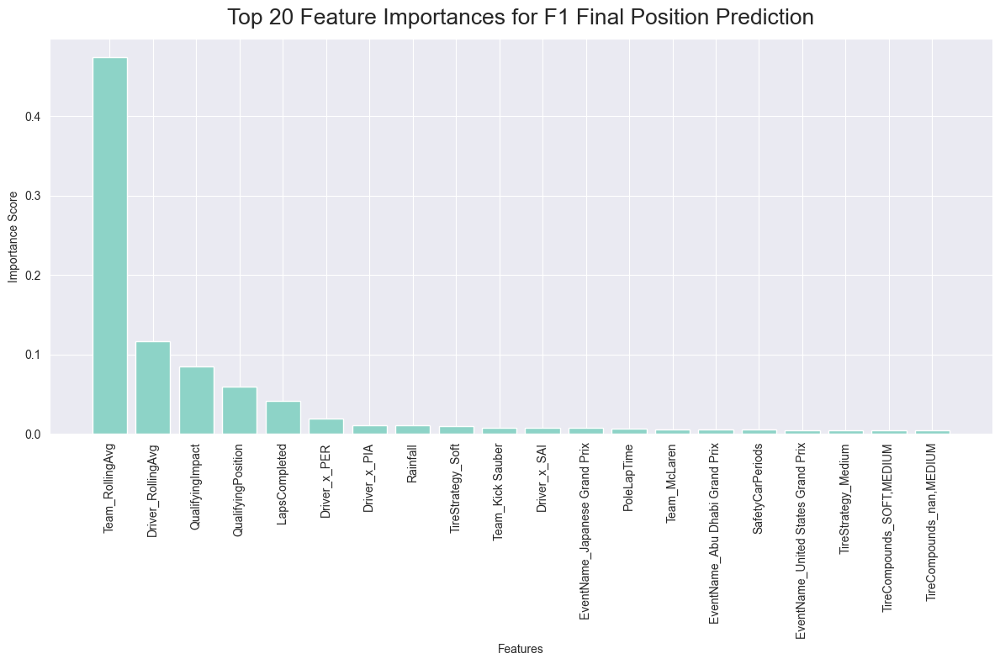

                                feature  importance
21                      Team_RollingAvg    0.474381
20                    Driver_RollingAvg    0.116417
18                     QualifyingImpact    0.085288
0                    QualifyingPosition    0.059170
8                         LapsCompleted    0.041627
35                         Driver_x_PER    0.019327
36                         Driver_x_PIA    0.011046
5                              Rainfall    0.010478
111                   TireStrategy_Soft    0.009427
49                     Team_Kick Sauber    0.008227
39                         Driver_x_SAI    0.008173
68        EventName_Japanese Grand Prix    0.007823
13                          PoleLapTime    0.007147
50                         Team_McLaren    0.005907
55       EventName_Abu Dhabi Grand Prix    0.005535
6                      SafetyCarPeriods    0.005352
78   EventName_United States Grand Prix    0.005067
110                 TireStrategy_Medium    0.005016
102         

In [1147]:
def extract_feature_importances(model_pipeline):
    # Get the best estimator from the RandomizedSearchCV
    best_model = model_pipeline.best_estimator_
    
    # Extract the underlying XGBoost model
    xgb_model = best_model.named_steps['regressor']
    
    # Get feature names from the preprocessor
    preprocessor = best_model.named_steps['preprocessor']
    
    # Get feature names for numerical and categorical columns
    feature_names = (
        # Numerical feature names
        list(preprocessor.named_transformers_['num'].get_feature_names_out()) +
        # Categorical feature names (one-hot encoded)
        list(preprocessor.named_transformers_['cat'].get_feature_names_out())
    )
    
    # Get feature importances
    importances = xgb_model.feature_importances_
    
    # Create a dataframe of features and their importances
    feature_importance_df = pd.DataFrame({
        'feature': feature_names,
        'importance': importances
    }).sort_values('importance', ascending=False)
    
    return feature_importance_df

# After training your model
feature_importances = extract_feature_importances(xgboost_model_2)

# Visualize top 20 features
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 8))
plt.bar(feature_importances['feature'][:20], feature_importances['importance'][:20])
plt.title('Top 20 Feature Importances for F1 Final Position Prediction')
plt.xlabel('Features')
plt.ylabel('Importance Score')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

# Print top 20 features
print(feature_importances.head(20))

In [1148]:
def predict_final_position(model_pipeline, input_data):
    """
    Predict final position for a given set of race data
    
    Parameters:
    - model_pipeline: The trained XGBoost model pipeline
    - input_data: Dictionary with feature values matching the training data columns
    
    Returns:
    - Predicted final position
    """
    # Convert input to DataFrame
    input_df = pd.DataFrame([input_data])
    
    # Preprocess the input data (same as in training)
    input_df = preprocess_complex_columns(input_df)
    
    # Prepare columns in the same order as training data
    categorical_columns = [
        'Driver_x', 'Team', 'EventName', 'TireCompounds', 
        'RainCategory', 'TireStrategy'
    ]
    
    numerical_columns = [
        'QualifyingPosition', 
        'AvgLapTime',
        'FastestLapTime',
        # 'AvgLapTime_Processed', 
        # 'FastestLapTime_Processed', 
        'AirTemp', 'TrackTemp', 'Rainfall', 
        'SafetyCarPeriods', 'SafetyCarDuration', 
        'LapsCompleted', 'Stops', 'Total', 
        'AvgPitStopDuration', 
        'PitStopTimes_Processed', 
        'PoleLapTime',
        'DeltaToPoleTime',
        'RelativeLapTime',
        # 'PoleLapTime_Processed', 
        # 'DeltaToPoleTime_Processed', 
        # 'RelativeLapTime_Processed', 
        'HumidityAdjustedTemp', 
        'PitStopStdDev', 'QualifyingImpact', 
        'SafetyCarInfluence', 'Driver_RollingAvg', 'Team_RollingAvg'
    ]
    
    # Select and order columns
    all_columns = categorical_columns + numerical_columns
    
    # Ensure all expected columns are in the input
    for col in all_columns:
        if col not in input_df.columns:
            # Add missing columns with a default value
            if col in categorical_columns:
                input_df[col] = 'Unknown'
            else:
                input_df[col] = 0
    
    # Select and order columns
    input_data_processed = input_df[all_columns]
    
    # Make prediction
    prediction = model_pipeline.predict(input_data_processed)
    
    return prediction[0]

example_input = {
    'Driver_x': 'VER',
    'Team': 'Red Bull Racing',
    'EventName': 'Monaco Grand Prix',
    'QualifyingPosition': 6,
    'AvgLapTime': 109.765766,
    'FastestLapTime': 74.569,
    'TireCompounds': 'HARD,MEDIUM',
    'AirTemp': 21.5965,
    'TrackTemp': 46.318,
    'Rainfall': 0,
    'SafetyCarPeriods': 1,
    'SafetyCarDuration': 0,
    'LapsCompleted': 77,
    'Stops': 2,
    'Total': 63.14,
    'AvgPitStopDuration': 31.57,
    'PitStopTimes': '39.327, 23.813',
    'SprintPosition': 0,
    'PitStopEfficiency': 0.5,
    'PoleLapTime': 70.27,
    'DeltaToPoleTime': 4.299,
    'RelativeLapTime': 1.472002655,
    'HumidityAdjustedTemp': 33.95725,
    'RainCategory': 'Dry',
    'PitStopStdDev': 7.757,
    'QualifyingImpact': 1,
    'TireStrategy': 'Medium',
    'SafetyCarInfluence': 0,
    'Driver_RollingAvg': 2.666666667,
    'Team_RollingAvg': 5,
}



In [1149]:
# Predict using the trained model
prediction = predict_final_position(xgboost_model_2, example_input)
print(f"Predicted Final Position: {prediction}")

Predicted Final Position: 6.024166584014893


In [1151]:
import joblib

# Save the entire model pipeline (including the RandomizedSearchCV object)
joblib.dump(xgboost_model_2, 'f1_position_prediction_model.pkl')

# Or save just the best estimator (which might be more efficient for deployment)
joblib.dump(xgboost_model_2.best_estimator_, 'f1_position_prediction_best_model.pkl')

['f1_position_prediction_best_model.pkl']